In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from os import walk
import numpy as np
import matplotlib.animation as animation
import pandas.io.json as pd_json
import json
import statistics as stats
from scipy.stats import mannwhitneyu
from scipy.spatial import distance as dist
from scipy.signal import find_peaks

In [6]:
pip install matplotlib --upgrade

DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [7]:
normal_scan = pd.read_csv("/home/olha/study/year4/thesis/data/web_tracking/updated/Опитування. Норма.xlsx - Сканування.csv")["ID"].tolist()
normal_read = pd.read_csv("/home/olha/study/year4/thesis/data/web_tracking/updated/Опитування. Норма.xlsx - Читання.csv")["ID"].tolist()
concussion_scan = pd.read_csv("/home/olha/study/year4/thesis/data/web_tracking/updated/Опитування. Респонденти з контузіями.xlsx - Сканування.csv")["ID"].tolist()
concussion_read = pd.read_csv("/home/olha/study/year4/thesis/data/web_tracking/updated/Опитування. Респонденти з контузіями.xlsx - Читання.csv")["ID"].tolist()

sessions_dict = {}

for s in normal_scan:
    sessions_dict[s] = "Normal Scan"
for s in normal_read:
    sessions_dict[s] = "Normal Read"
for s in concussion_scan:
    sessions_dict[s] = "Concussion Scan"
for s in concussion_read:
    sessions_dict[s] = "Concussion Read"
sessions_dict

{'nOQRQnXCjYfEjdHkGsVt': 'Normal Scan',
 '9TqIMnl5HQl8qERfxVEc': 'Normal Scan',
 'jmBKTEek0LtPDgWu3yOj': 'Normal Scan',
 'BUV5Gdw45Mn4TzRP2chu': 'Normal Scan',
 'S4S21Dhf1s4TQT14Nd4Y                          і                                                       m5GzWYq0Bv5vdsLum2mA': 'Normal Scan',
 '0vDqTTS4iDY6DF5NOp8f': 'Normal Scan',
 'u5dOYq51Sd8qDKUrTQfL': 'Normal Scan',
 'x7XhOkaJGIWyzYnnlNEj': 'Normal Scan',
 'KpvwhSkbepJQTVPLuhOg': 'Normal Scan',
 '2N0kUSJASI5JIwtMnJ6Z': 'Normal Scan',
 'wTi8ChH1rrN6BioyZ6AB': 'Normal Scan',
 'IWY6zTCH48kAYqhLq0xx': 'Normal Scan',
 'MtU5kaSMD9b9CzdA5kaz': 'Normal Scan',
 '44E3YIVHtJTAEneYLU1g': 'Normal Scan',
 'qxdzibb5ytmZyniXGkN2': 'Normal Scan',
 '7Bo5WX4PfxXwnh5QVCMk': 'Normal Scan',
 'SoO55MIfSyBEqQ6AD5iG': 'Normal Scan',
 '5n0g1LGcORhAO1DXcLQk': 'Normal Scan',
 'UZgFxsIqLId5NYLd2X08': 'Normal Scan',
 'KKFVRCBr0WhcvLdEonYE': 'Normal Read',
 'W6B74XpCm6ytNUQIkl3r': 'Normal Read',
 'BvcD6EK15z6n7wuR1N6o': 'Normal Read',
 'JJpcZkRzcFAGgDw6

In [8]:
def get_all_users_names_from_folder(dir_name):
    f = []
    for (dirpath, dirnames, filenames) in walk(dir_name):
        f.extend(dirnames)
        break
    # onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    return f

users_path = "/home/olha/study/year4/thesis/data/web_tracking/updated/concussion_eyepass_data/data_raw/users"
users_names = get_all_users_names_from_folder(users_path)
users_names

['QuIbB8xArLV5OAviwoud8VhLTWq2',
 'TmBhiXQbBBVGXZMzXvPq317I0ti1',
 '8IuFkRQN9pMYlkIAzH28CPO0BX02',
 '4hGpDW1lsGgNA98VSSrV3ZH1Usz2',
 'VfLdIV20anVMGKm4AxJvK5412M83',
 'AH3y0e3kcyS2rggft7vSyUaBqZh1',
 'BQ1usU65EYgDNWK6ImPJ9VAHOAq2',
 'meXlEEUJ37TTmsnjRiXiYxLTiZd2',
 'm63dlFEoqnXR4EHoCl4eR9hx4Pb2',
 'uqcQI9nAK5YNH5YHmxxbtotlHhk1',
 '3X96O1eXc8SOlYdhi6tjLvuSBhp1',
 'aT2FIH5Q7lUwuEuLk6pY2tdWuqx2',
 'k1qL5d7a5xNH76pgx8faL6gOBQh2',
 's3Vw4dBBxGfjVjLw3GSKnJxaXyH3',
 'EmezAkYgAjb63MYGX7Pn6sduGb43',
 'XYHFiNfvVyPfqMyU6tolHH9pfr92',
 'vRrG2ISMXfbQgpuPs0zt3mzcci83',
 'uGfbuaQcW7XvW1p1FrqYDO5VWYg1',
 'z5YjeCN069ZhUXgeFDrTGKHEjaw2']

In [59]:
def plot_ear(left_ear, left_thr, right_ear, right_thr, session_id):
#     plt.figure(figsize=(8, 6))
#     plt.plot(ear, label='ear values')
#     plt.axhline(y=mod_ear_thr, color='r', linestyle='--', label='mod_ear_thr')
#     plt.title('Eye Aspect Ratio')
#     plt.xlabel('Index')
#     plt.ylabel('EAR Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
    fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

    # Plot for the first eye
    axs[0].plot(left_ear, label='Left eye EAR')
    axs[0].axhline(y=left_thr, color='r', linestyle='--', label='left_mod_ear_thr')
    axs[0].set_title('Left Eye')
    axs[0].set_xlabel('Index')
    axs[0].set_ylabel('Eye Aspect Ratio')
    axs[0].legend()
    axs[0].grid(True)

    # Plot for the second eye
    axs[1].plot(right_ear, label='Right eye EAR')
    axs[1].axhline(y=right_thr, color='r', linestyle='--', label='right_mod_ear_thr')
    axs[1].set_title('Right Eye')
    axs[1].set_xlabel('Index')
    axs[1].set_ylabel('Eye Aspect Ratio')
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    
    group = sessions_dict[session_id]
    folder_path = f"../../plots/Eye_Aspect_Ratio/{group}"
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    file_name = f"{session_id}.png"
    file_path = os.path.join(folder_path, file_name)

    plt.savefig(file_path)
    
    plt.show()


def plot_ear_with_scipy(left_ear, left_thr, right_ear, right_thr, session_id):
#     from 0.025 (min) up to 1 (max), but with minus shpuld be from -1 (min) to -0.025 (max)
    left_peaks, _ = find_peaks(-left_ear, distance=90, height=(-1, -0.1))
    right_peaks, _ = find_peaks(-right_ear, distance=90, height=(-1, -0.1))
    
#     plt.plot(x)
#     plt.plot(peaks, x[peaks], "x")
#     plt.plot(np.zeros_like(x), "--", color="gray")
#     plt.show()
    
    fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

    # Plot for the first eye
    axs[0].plot(left_ear, label='Left eye EAR')
    axs[0].plot(left_peaks, left_ear[left_peaks], "x", label='Left eye EAR Peaks')
    axs[0].axhline(y=left_thr, color='r', linestyle='--', label='left_mod_ear_thr')
    axs[0].set_title('Left Eye')
    axs[0].set_xlabel('Index')
    axs[0].set_ylabel('Eye Aspect Ratio')
    axs[0].legend()
    axs[0].grid(True)

    # Plot for the second eye
    axs[1].plot(right_ear, label='Right eye EAR')
    axs[1].plot(right_peaks, right_ear[right_peaks], "x", label='Left eye EAR Peaks')
    axs[1].axhline(y=right_thr, color='r', linestyle='--', label='right_mod_ear_thr')
    axs[1].set_title('Right Eye')
    axs[1].set_xlabel('Index')
    axs[1].set_ylabel('Eye Aspect Ratio')
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    
    group = sessions_dict[session_id]
    folder_path = f"../../plots/Eye_Aspect_Ratio/{group}"
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    file_name = f"{session_id}.png"
    file_path = os.path.join(folder_path, file_name)

#     plt.savefig(file_path)
    
    plt.show()
    

def eye_aspect_ratio(p1, p2, p3, p4, p5, p6):
    """
    Takes 6 coordinates of an eye and returns an array of EAR for that eye.
    
         P2    P3
    P1             P4
         P6    P5
    
    Source: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9044337/#eqn-2
    """
    A = np.linalg.norm(p2 - p6, axis=1)
    B = np.linalg.norm(p3 - p5, axis=1)
    C = np.linalg.norm(p1 - p4, axis=1)
    ear_closed = (A.min() + B.min()) / (2 * C.max())
    ear_open = (A.max() + B.max()) / (2 * C.min())
    mod_ear_thr = (ear_closed + ear_open) / 2
    ear = (A + B) / (2 * C)
    
    return ear, mod_ear_thr

def count_ear(df, session_id):
    """
    Takes dataframe of a person's session data and returns an array of a modified EAR.
    """
    l_p1 = df[["X6", "Y6"]].values.reshape(-1, 2)
    l_p2 = df[["X7", "Y7"]].values.reshape(-1, 2)
    l_p3 = df[["X8", "Y8"]].values.reshape(-1, 2)
    l_p4 = df[["X9", "Y9"]].values.reshape(-1, 2)
    l_p5 = df[["X10", "Y10"]].values.reshape(-1, 2)
    l_p6 = df[["X11", "Y11"]].values.reshape(-1, 2)
    
    r_p1 = df[["X12", "Y12"]].values.reshape(-1, 2)
    r_p2 = df[["X13", "Y13"]].values.reshape(-1, 2)
    r_p3 = df[["X14", "Y14"]].values.reshape(-1, 2)
    r_p4 = df[["X15", "Y15"]].values.reshape(-1, 2)
    r_p5 = df[["X16", "Y16"]].values.reshape(-1, 2)
    r_p6 = df[["X17", "Y17"]].values.reshape(-1, 2)
    

    left_ear, left_thr = eye_aspect_ratio(l_p1, l_p2, l_p3, l_p4, l_p5, l_p6)
    right_ear, right_thr = eye_aspect_ratio(r_p1, r_p2, r_p3, r_p4, r_p5, r_p6)
    
#     plot_ear(left_ear, left_thr, right_ear, right_thr, session_id)
    plot_ear_with_scipy(left_ear, left_thr, right_ear, right_thr, session_id)
    
    
    # TO-DO:
    # 3 seconds for blink?
    return left_ear <= left_thr, right_ear <= right_thr

In [60]:
def plot_head_point(x, y, ind, session_id):
    plt.figure(figsize=(12, 6))
    plt.scatter(x, y, marker='o', color='blue', s=10)
    plt.title('Forehead points')
    plt.xlabel('X')
    plt.ylabel('Y')

#     plt.subplot(1, 2, 1)
#     plt.scatter(np.where(ind)[0], x, marker='o', color='blue', s=10)
#     plt.title('Head point X')
#     plt.xlabel('ind')
#     plt.ylabel('x')

#     plt.subplot(1, 2, 2)
#     plt.scatter(np.where(ind)[0], y, marker='o', color='blue', s=10)
#     plt.title('Head point Y')
#     plt.xlabel('ind')
#     plt.ylabel('y')

    plt.tight_layout()  # Adjust layout to prevent overlapping labels
    
    group = sessions_dict[session_id]
    folder_path = f"../../plots/Head_movements/{group}"
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    file_name = f"{session_id}.png"
    file_path = os.path.join(folder_path, file_name)

    plt.savefig(file_path)
    plt.show()

['0vDqTTS4iDY6DF5NOp8f', 'IxFK072TVWPwYlGys7rw']
0vDqTTS4iDY6DF5NOp8f
Good data for  0vDqTTS4iDY6DF5NOp8f ,  100.0 %


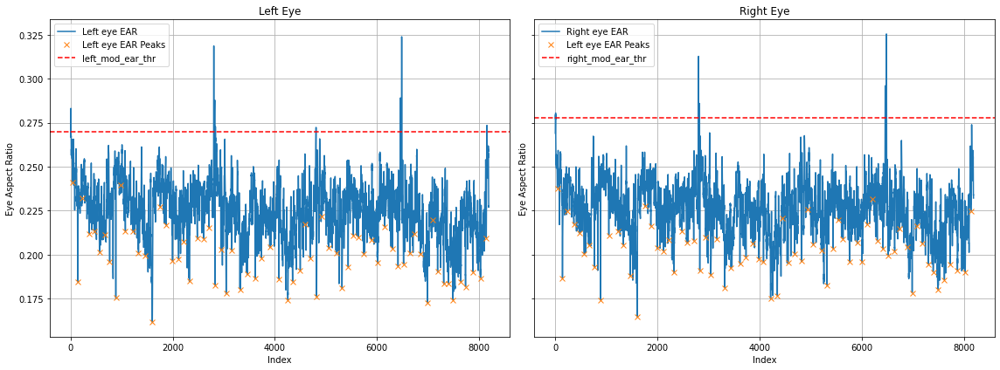

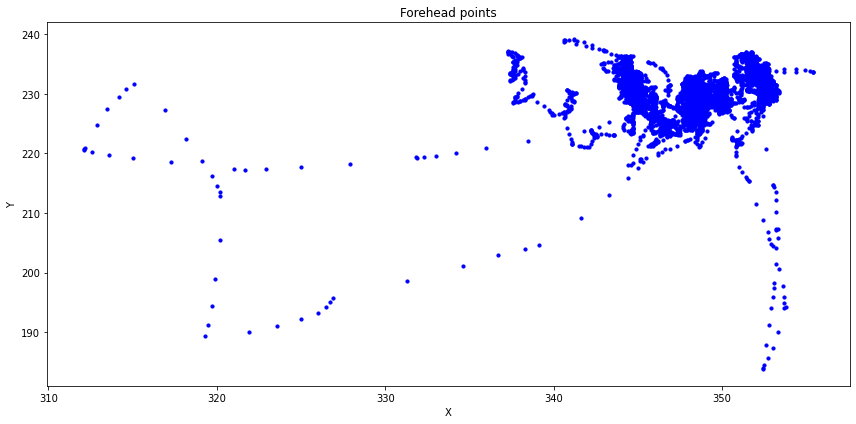

IxFK072TVWPwYlGys7rw
Good data for  IxFK072TVWPwYlGys7rw ,  100.0 %


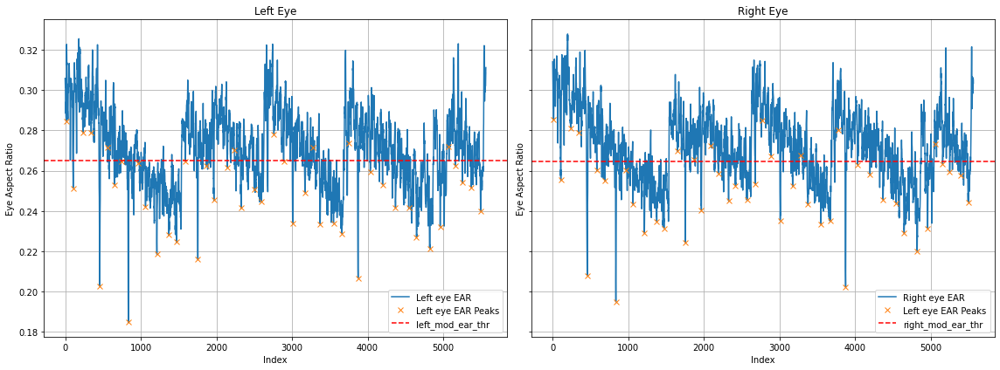

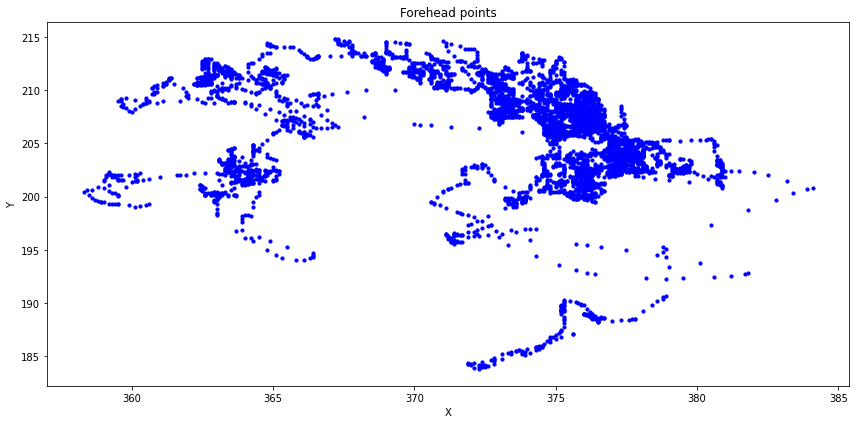

['2N0kUSJASI5JIwtMnJ6Z', 'eVx48oKwJpOecNEasAHf']
2N0kUSJASI5JIwtMnJ6Z
Good data for  2N0kUSJASI5JIwtMnJ6Z ,  99.93441906219259 %


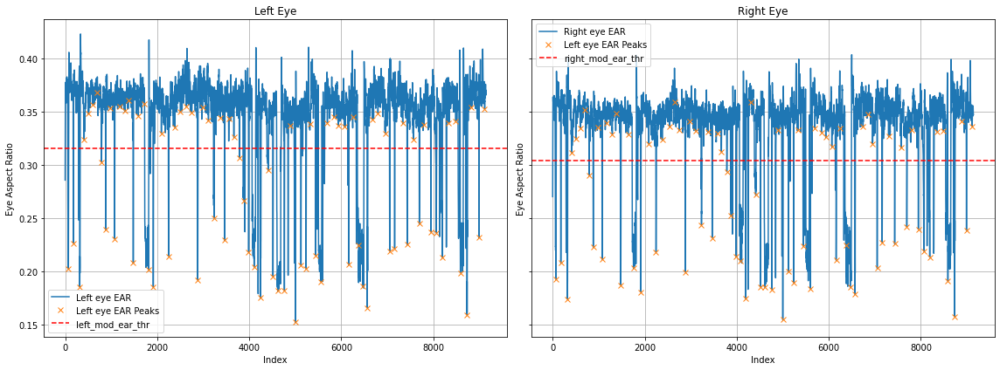

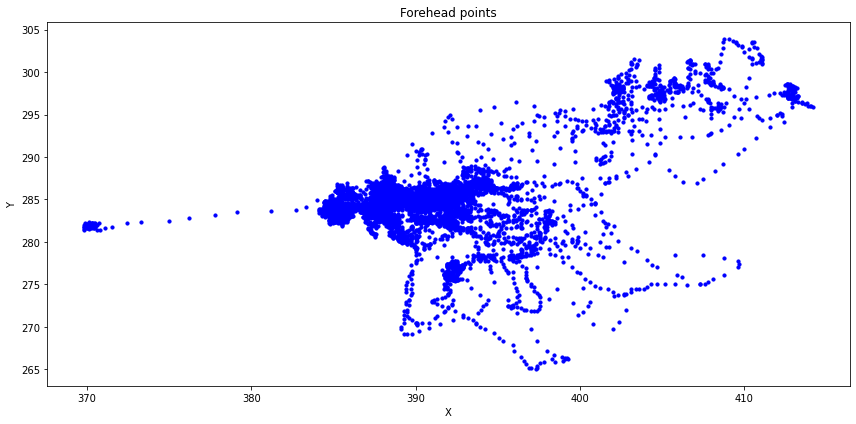

eVx48oKwJpOecNEasAHf
Good data for  eVx48oKwJpOecNEasAHf ,  99.98715313463515 %


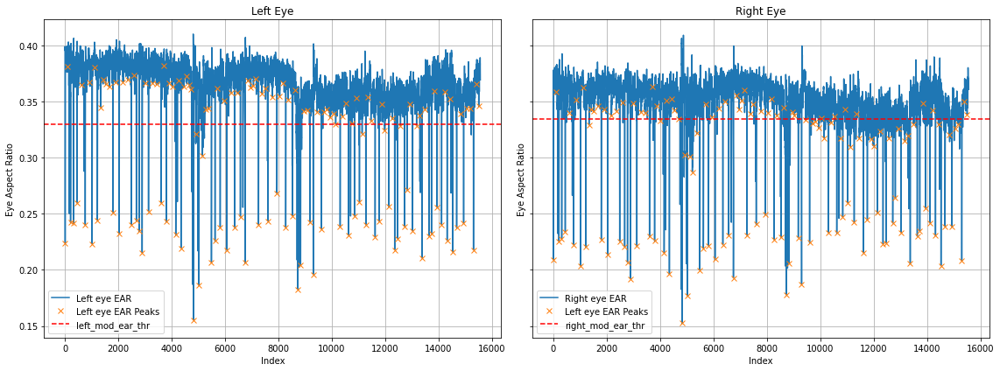

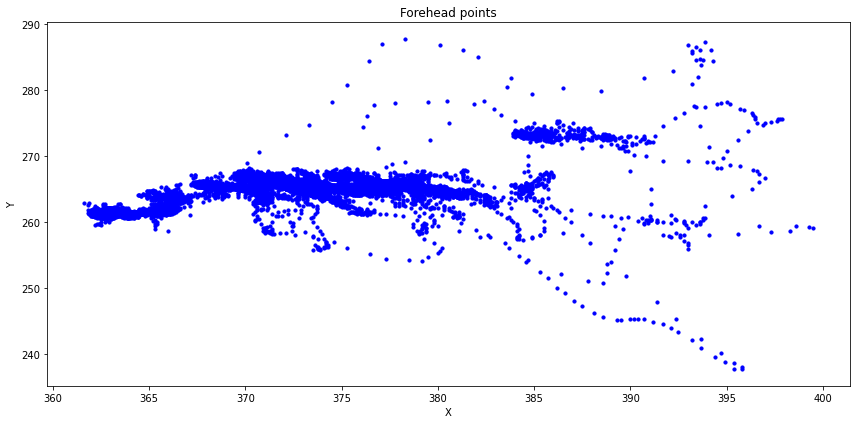

['qxdzibb5ytmZyniXGkN2', '8I5OjidfaOip7sBIdNv1']
qxdzibb5ytmZyniXGkN2
Good data for  qxdzibb5ytmZyniXGkN2 ,  95.0808847804556 %


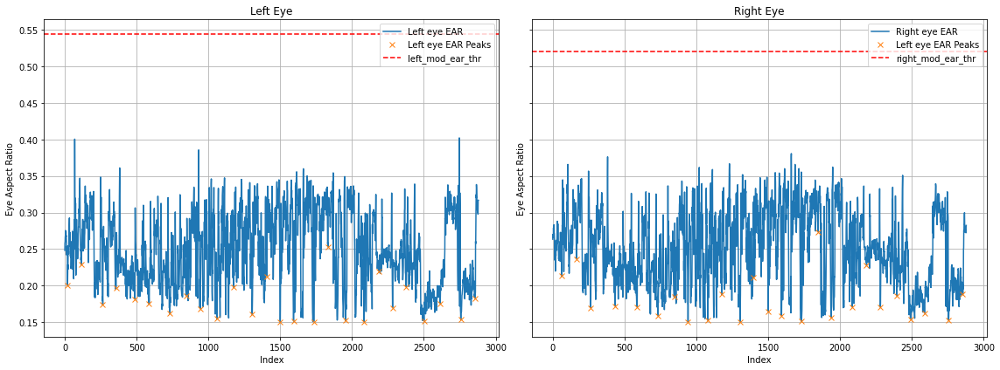

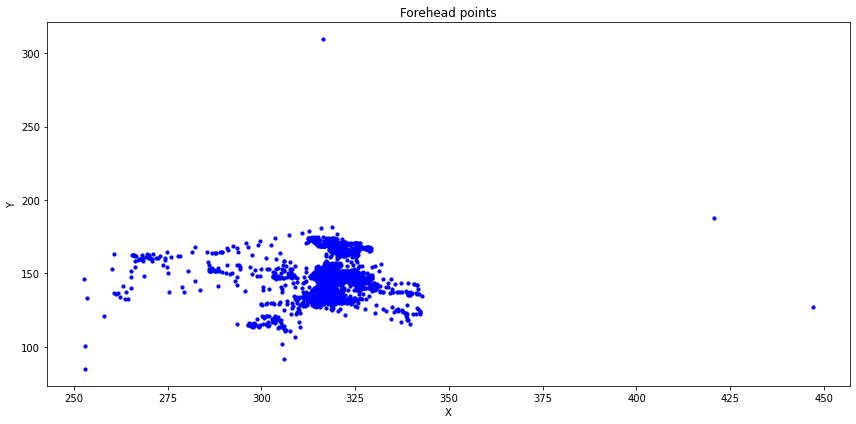

8I5OjidfaOip7sBIdNv1
Good data for  8I5OjidfaOip7sBIdNv1 ,  99.27872230808862 %


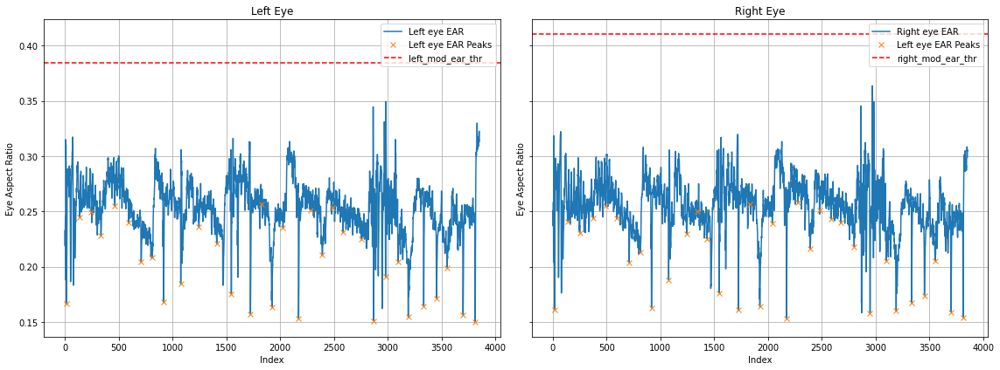

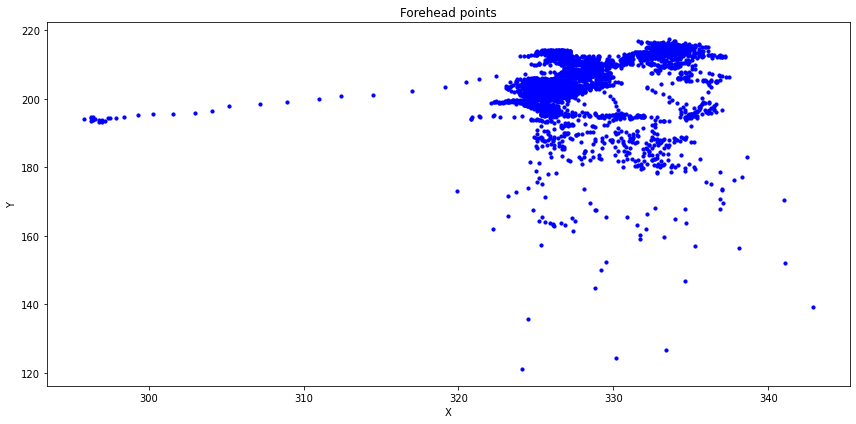

['S4S21Dhf1s4TQT14Nd4Y', 'm5GzWYq0Bv5vdsLum2mA', 'qolKFgxi6Kt6FqEKE7zR']
qolKFgxi6Kt6FqEKE7zR
Good data for  qolKFgxi6Kt6FqEKE7zR ,  99.98024496246542 %


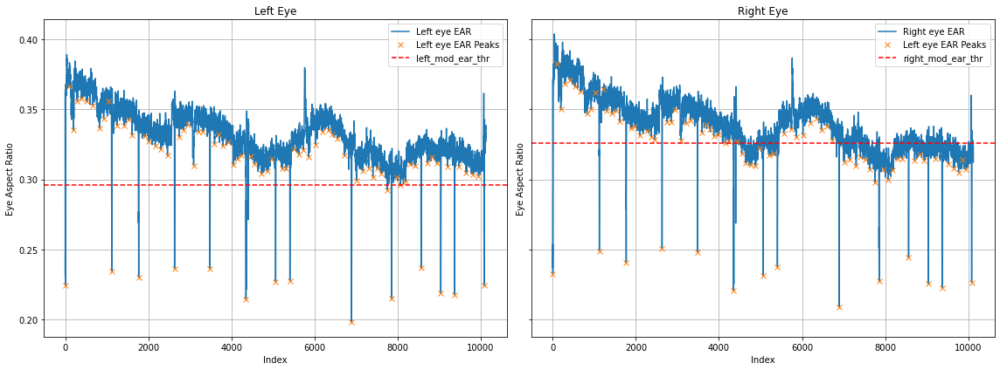

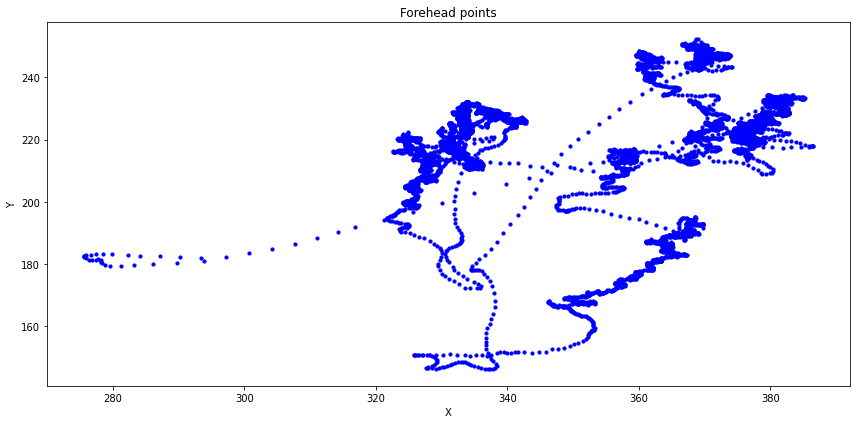

['y28aaUsUOIQXfN07Ja8L', 'SoO55MIfSyBEqQ6AD5iG']
y28aaUsUOIQXfN07Ja8L
Good data for  y28aaUsUOIQXfN07Ja8L ,  99.6221382529451 %


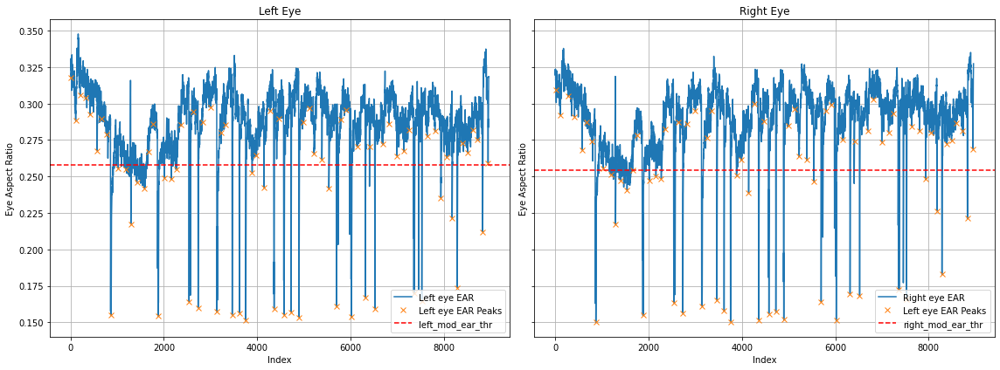

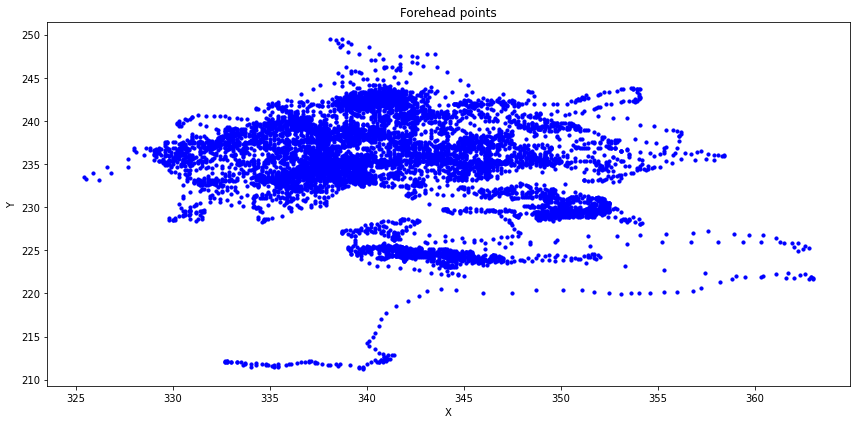

SoO55MIfSyBEqQ6AD5iG
Good data for  SoO55MIfSyBEqQ6AD5iG ,  98.67659222497932 %


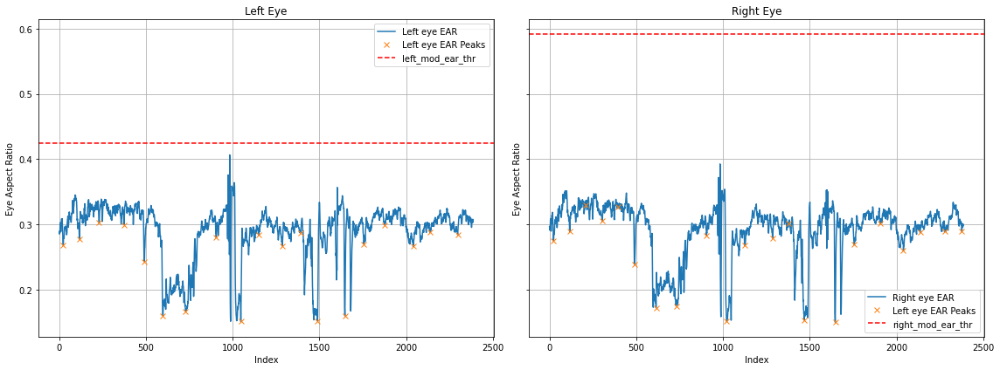

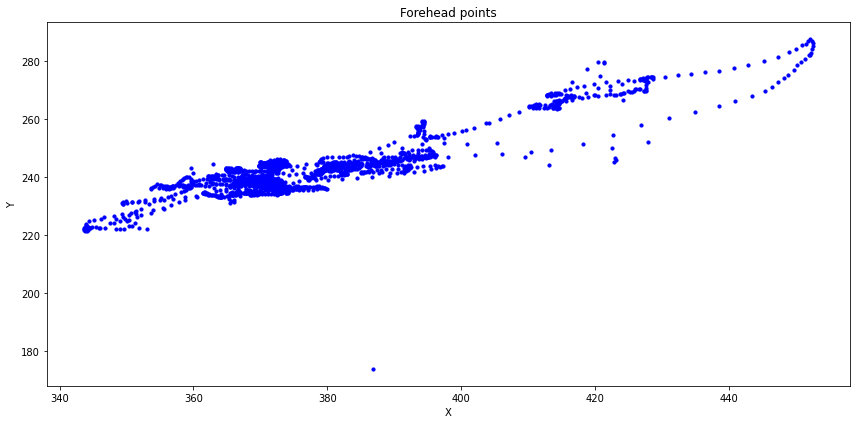

['hUEkI2mVf34Ufg2BHBAB', 'KpvwhSkbepJQTVPLuhOg']
hUEkI2mVf34Ufg2BHBAB
Good data for  hUEkI2mVf34Ufg2BHBAB ,  94.0150153325579 %


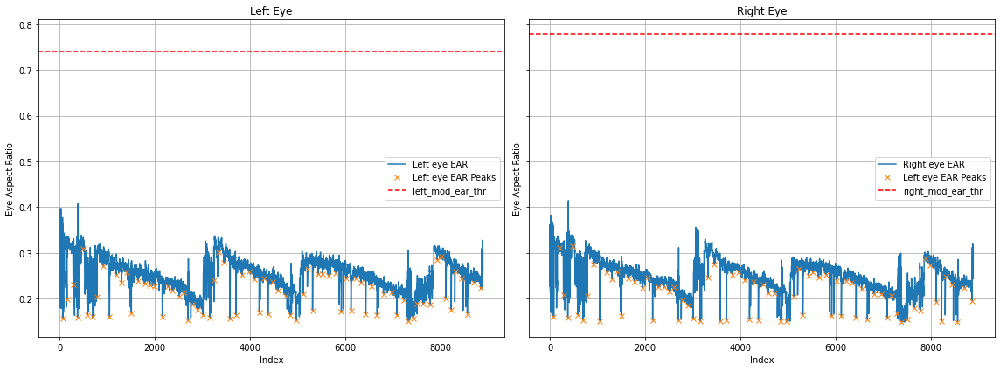

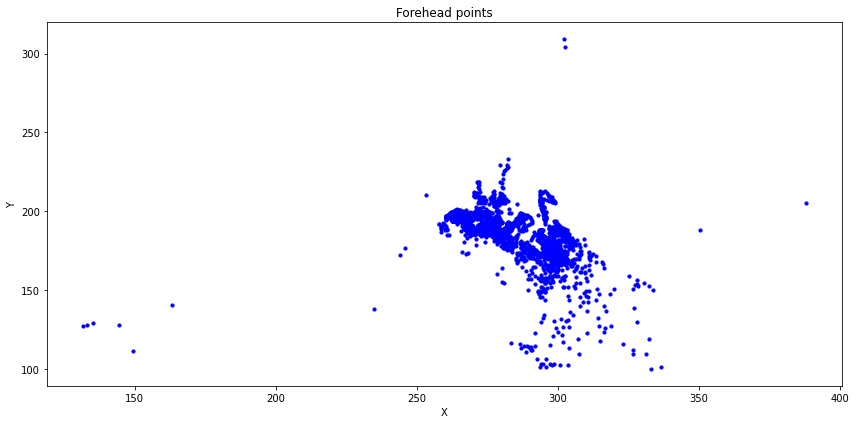

KpvwhSkbepJQTVPLuhOg
Good data for  KpvwhSkbepJQTVPLuhOg ,  84.17540514775978 %


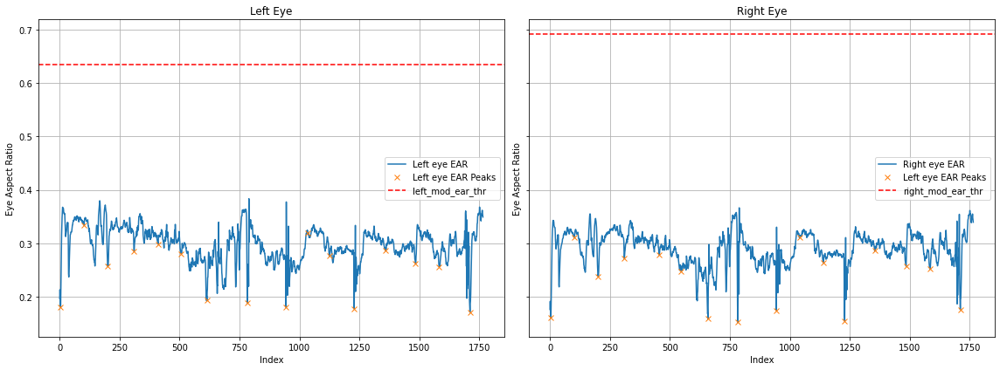

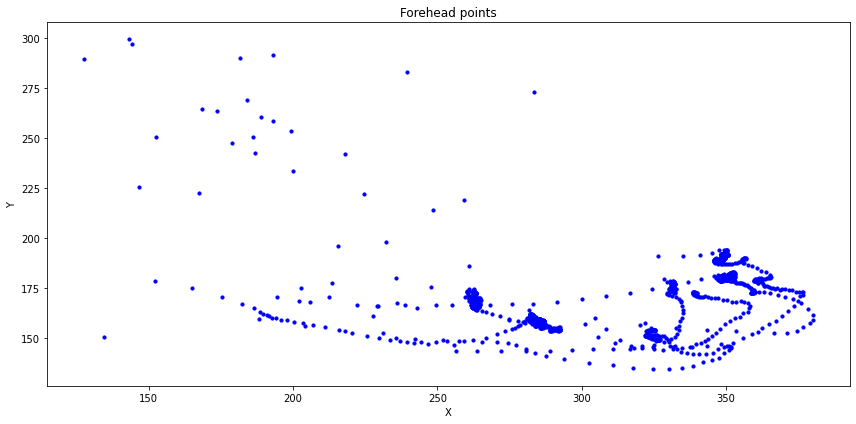

['44E3YIVHtJTAEneYLU1g', 'mne0Gu9l23zrvddMQ52T']
44E3YIVHtJTAEneYLU1g
Good data for  44E3YIVHtJTAEneYLU1g ,  96.37809187279152 %


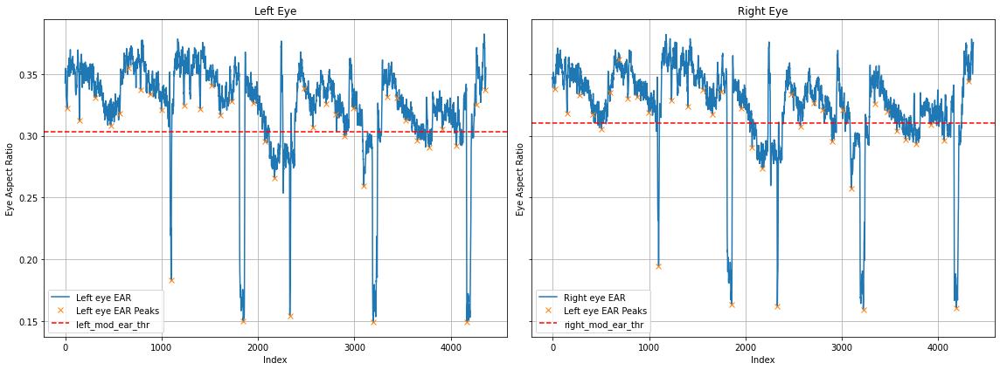

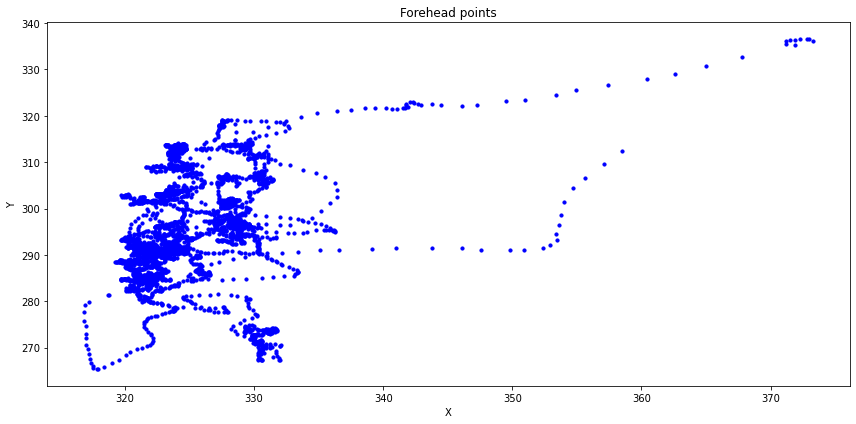

mne0Gu9l23zrvddMQ52T
Good data for  mne0Gu9l23zrvddMQ52T ,  100.0 %


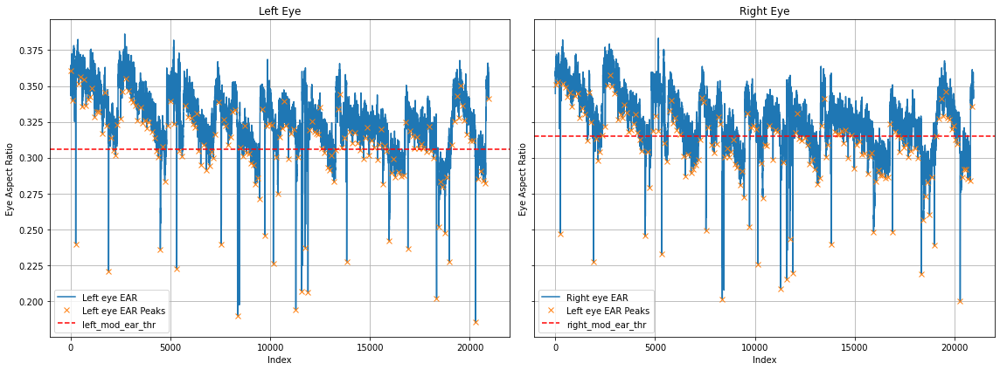

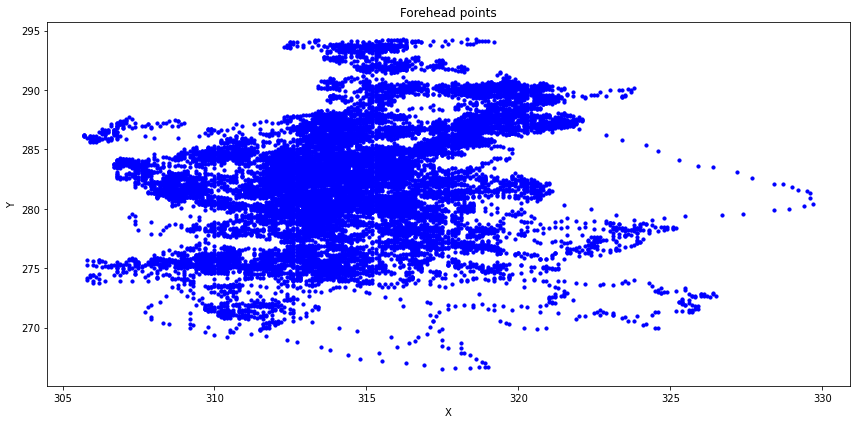

['jmBKTEek0LtPDgWu3yOj', 'BvcD6EK15z6n7wuR1N6o']
jmBKTEek0LtPDgWu3yOj
Good data for  jmBKTEek0LtPDgWu3yOj ,  99.97141223556318 %


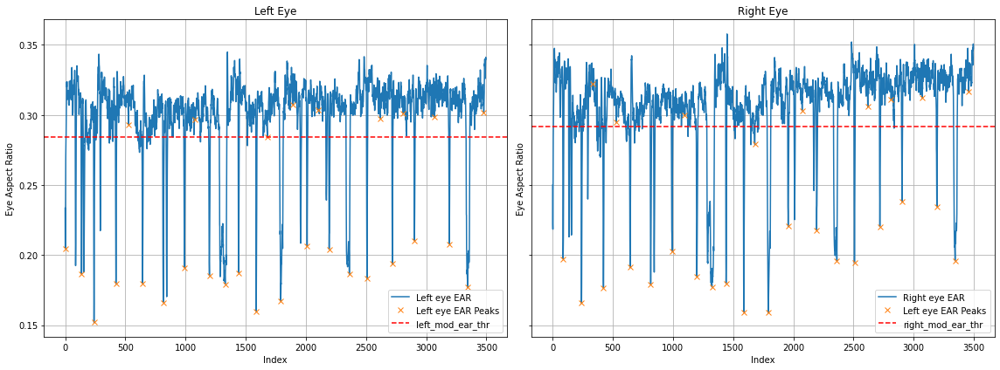

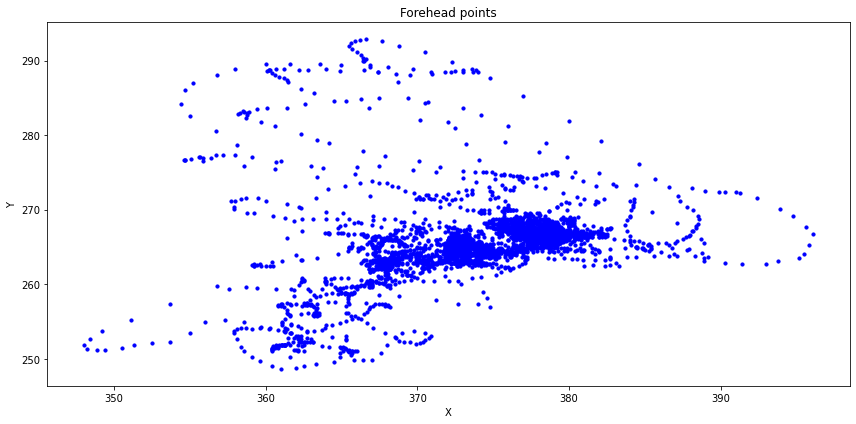

BvcD6EK15z6n7wuR1N6o
Good data for  BvcD6EK15z6n7wuR1N6o ,  99.30301799972932 %


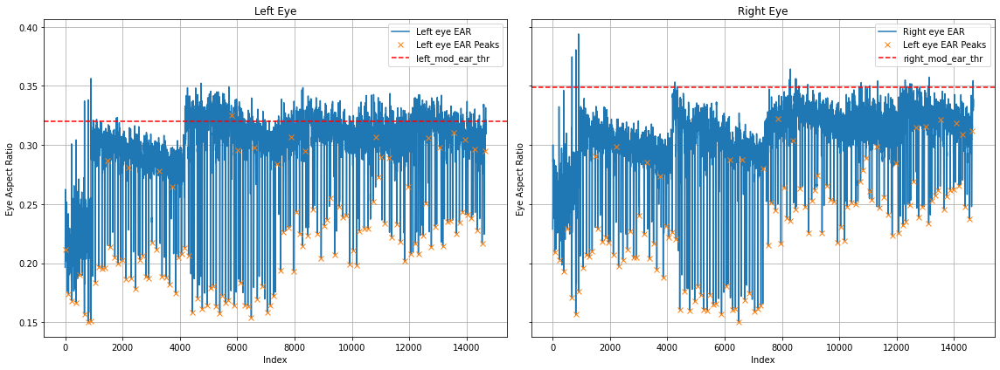

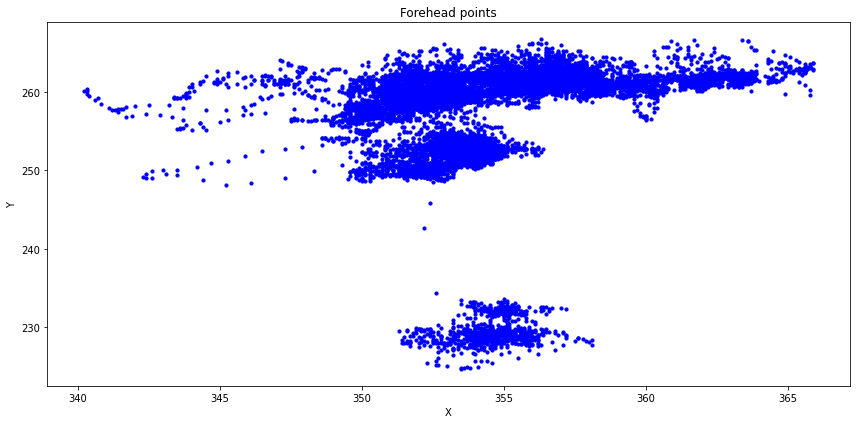

['hz8CcPLBCVhripI6GNwt', 'x7XhOkaJGIWyzYnnlNEj', '.DS_Store', 'THgf2wT6UX4Z9RoEQJYB']
hz8CcPLBCVhripI6GNwt
Good data for  hz8CcPLBCVhripI6GNwt ,  100.0 %


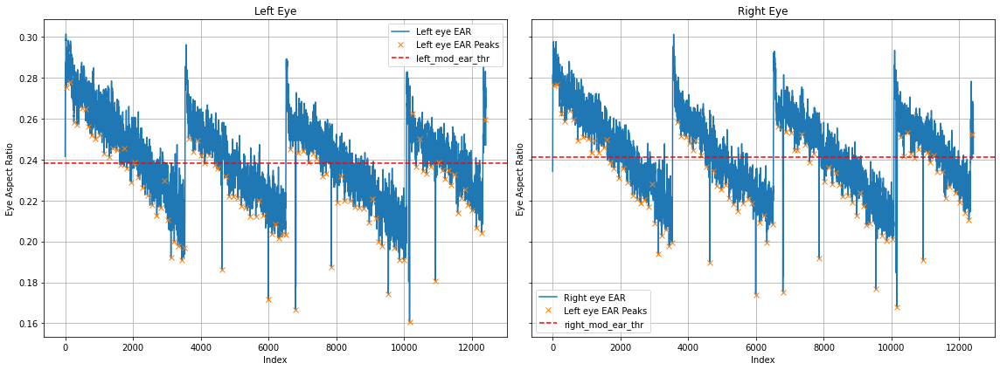

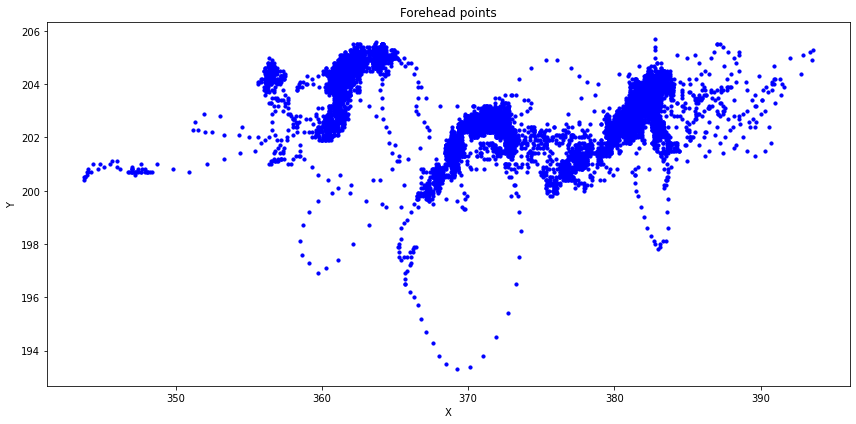

x7XhOkaJGIWyzYnnlNEj
Good data for  x7XhOkaJGIWyzYnnlNEj ,  100.0 %


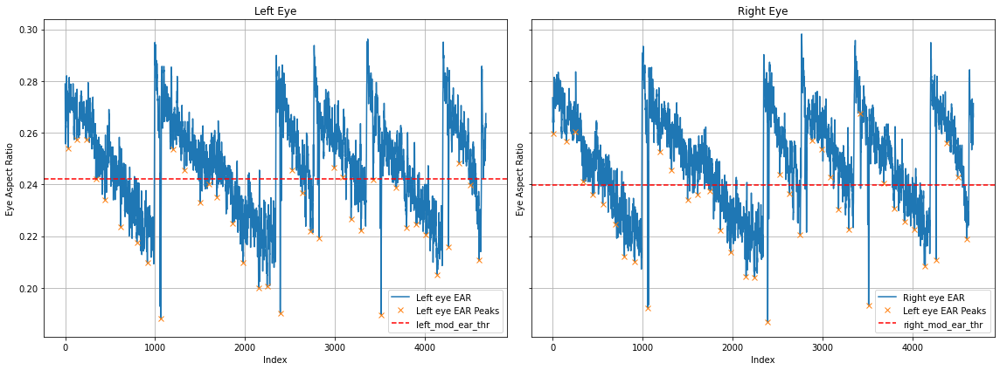

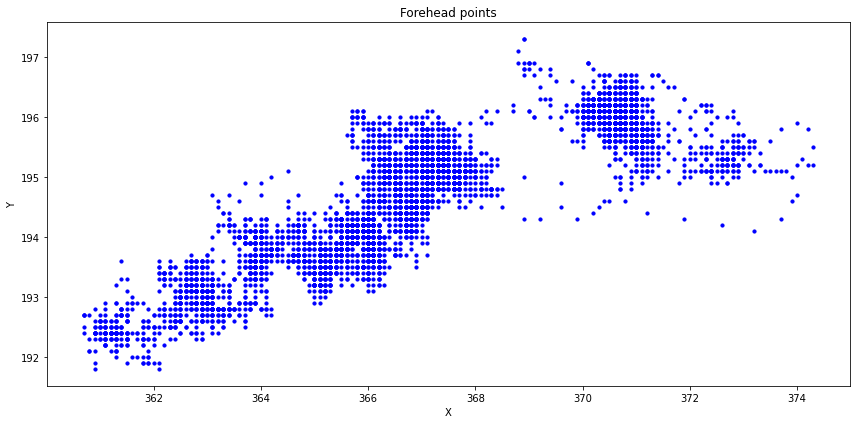

['wTi8ChH1rrN6BioyZ6AB', 'JUqxu7ObpzHMLUk2Jn8v', 'qmFhpBXAZgRAsnOR5x0j']
wTi8ChH1rrN6BioyZ6AB
Good data for  wTi8ChH1rrN6BioyZ6AB ,  99.97099767981439 %


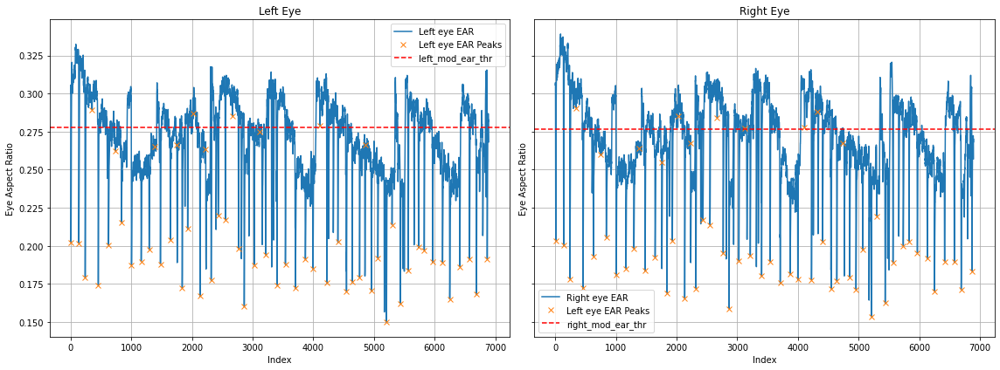

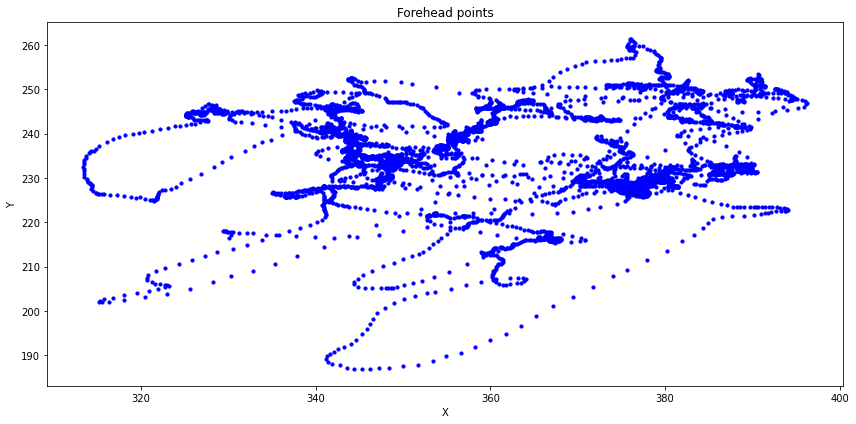

JUqxu7ObpzHMLUk2Jn8v
Good data for  JUqxu7ObpzHMLUk2Jn8v ,  91.54175588865097 %


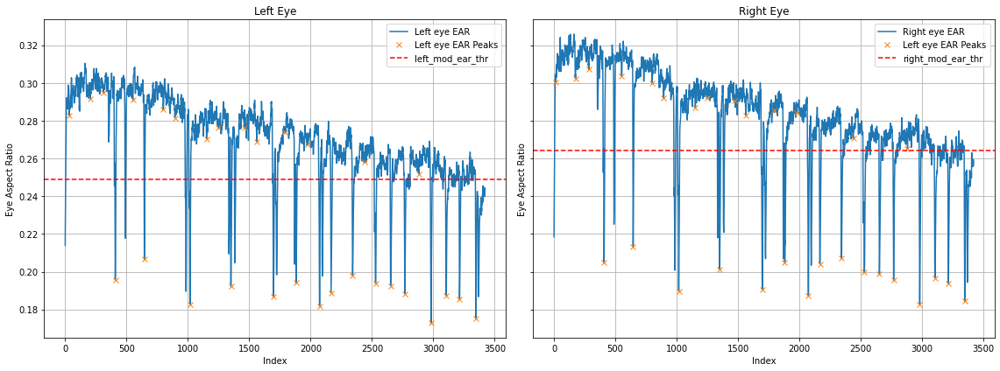

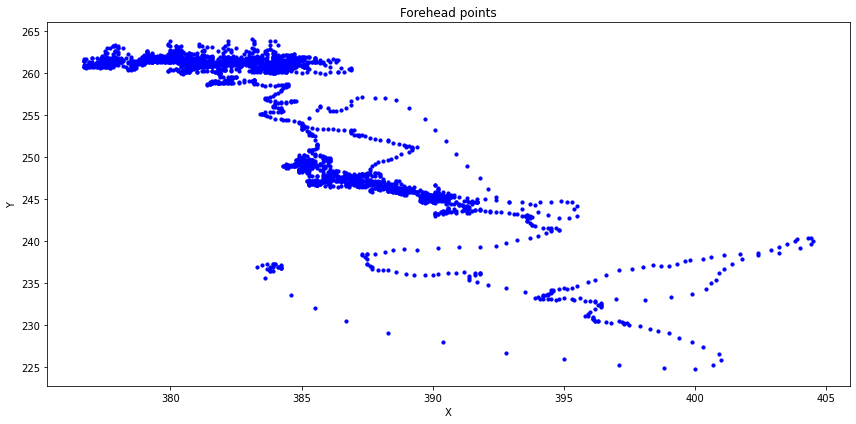

['JJpcZkRzcFAGgDw6ZgYm', 'BUV5Gdw45Mn4TzRP2chu', 'UZgFxsIqLId5NYLd2X08', 'Mfbq8prL1yr7mz2ibkSL']
JJpcZkRzcFAGgDw6ZgYm
Good data for  JJpcZkRzcFAGgDw6ZgYm ,  100.0 %


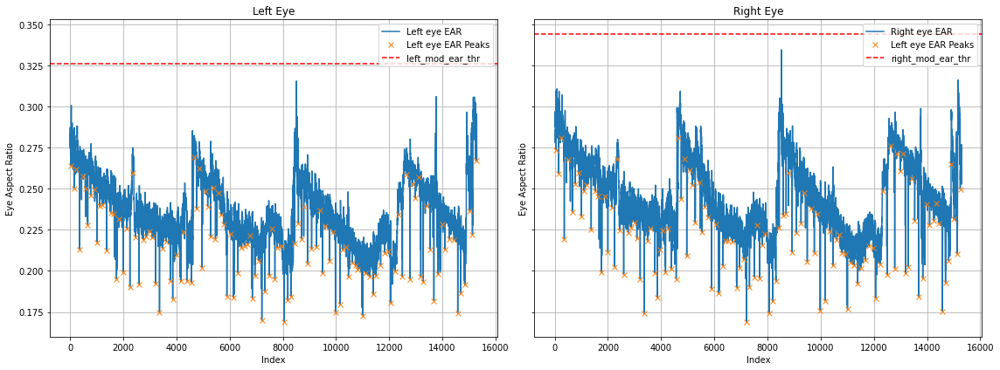

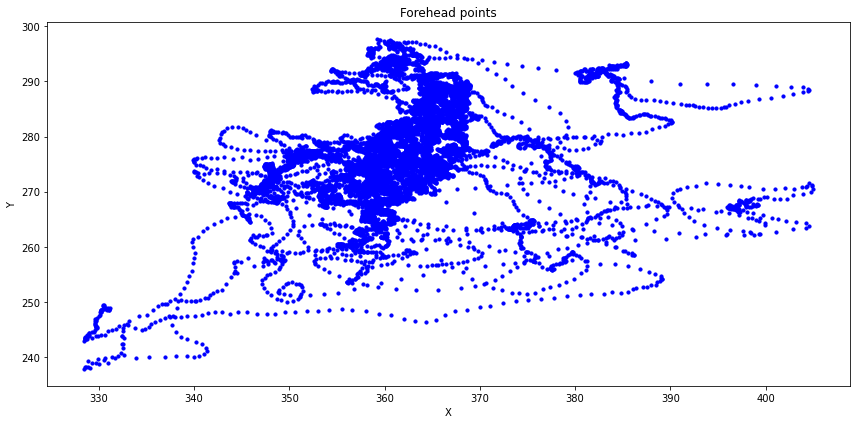

BUV5Gdw45Mn4TzRP2chu
Good data for  BUV5Gdw45Mn4TzRP2chu ,  99.79420611049548 %


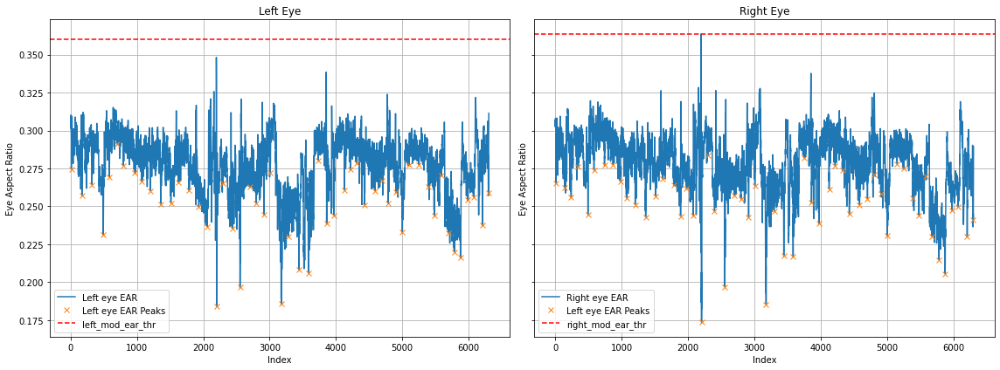

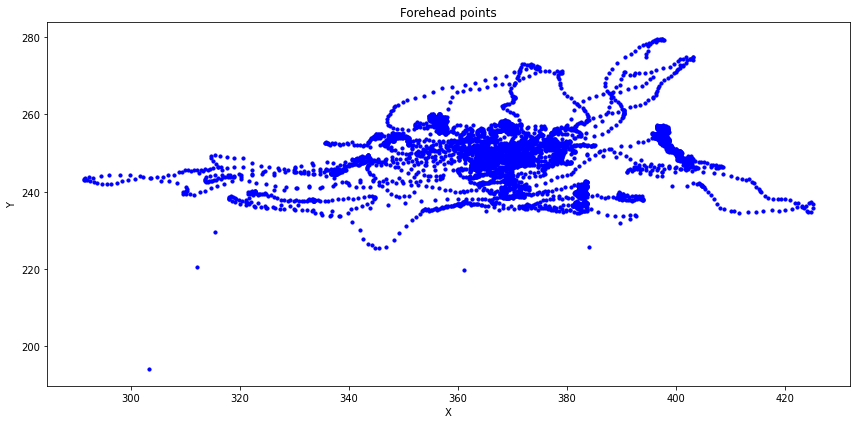

UZgFxsIqLId5NYLd2X08
Good data for  UZgFxsIqLId5NYLd2X08 ,  98.72858908705633 %


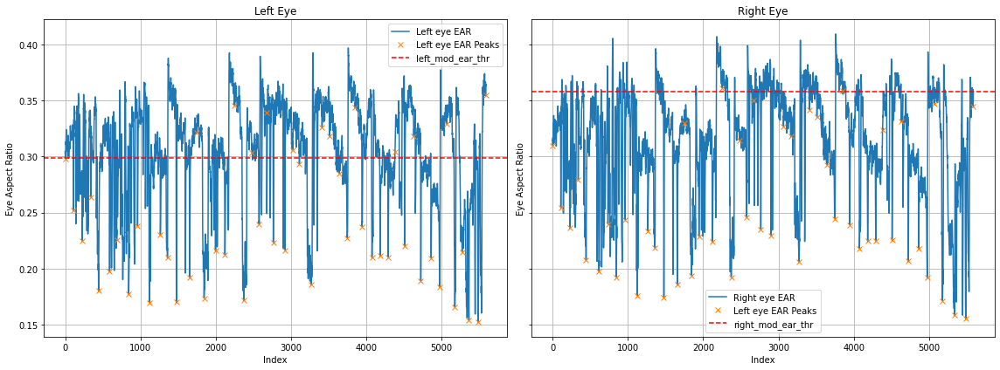

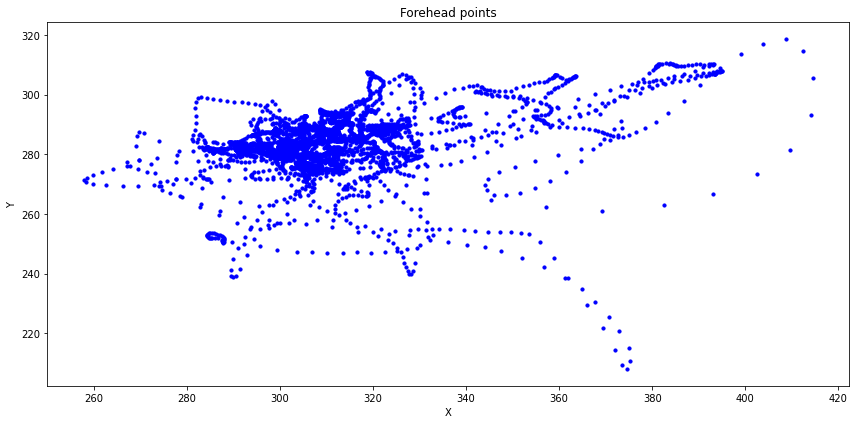

Mfbq8prL1yr7mz2ibkSL
Good data for  Mfbq8prL1yr7mz2ibkSL ,  99.80191985372542 %


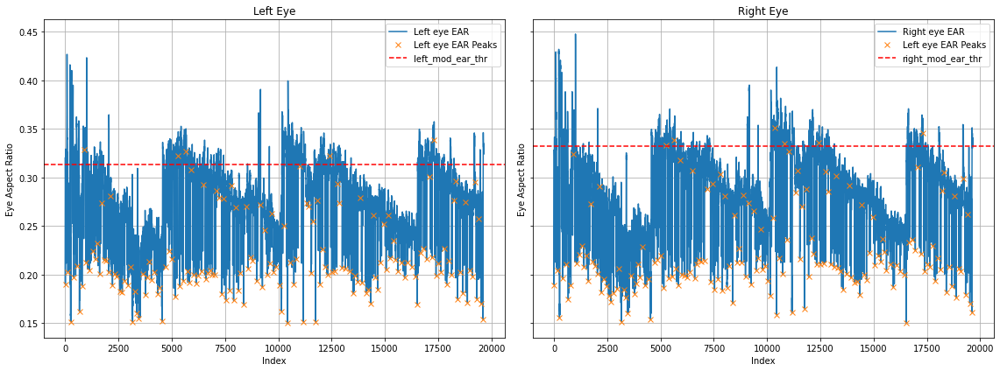

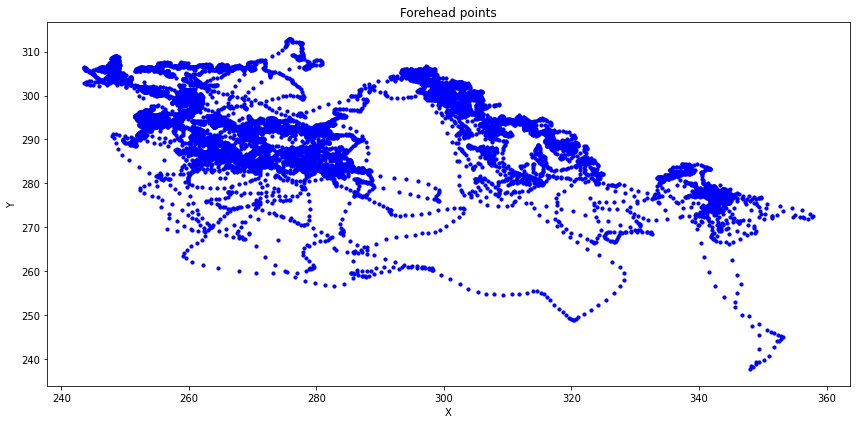

['9TqIMnl5HQl8qERfxVEc', 'IWY6zTCH48kAYqhLq0xx', 'W6B74XpCm6ytNUQIkl3r', 'YT2traJWYIoZEoNzOXnj']
9TqIMnl5HQl8qERfxVEc
Good data for  9TqIMnl5HQl8qERfxVEc ,  99.97962510187449 %


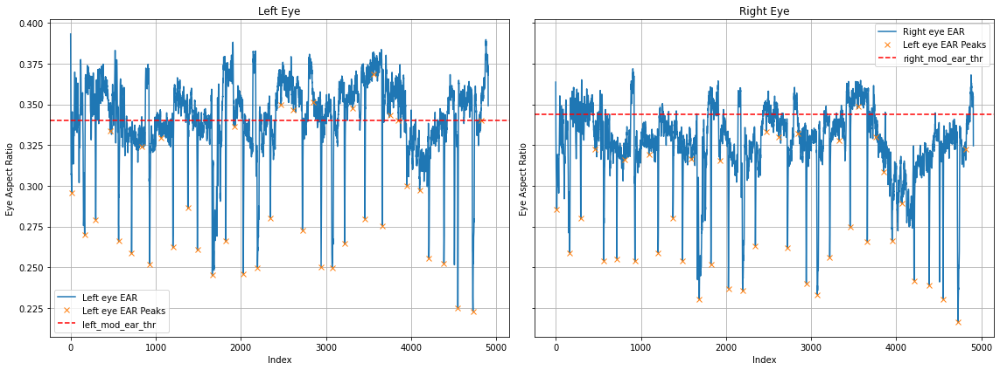

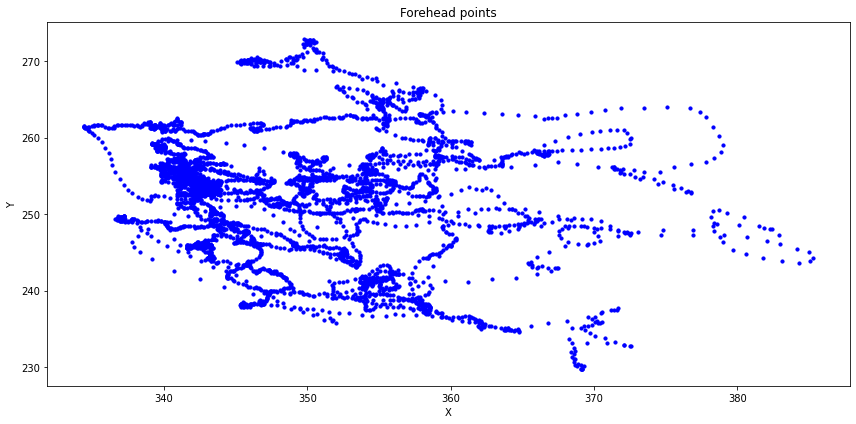

IWY6zTCH48kAYqhLq0xx
Good data for  IWY6zTCH48kAYqhLq0xx ,  94.97711394844616 %


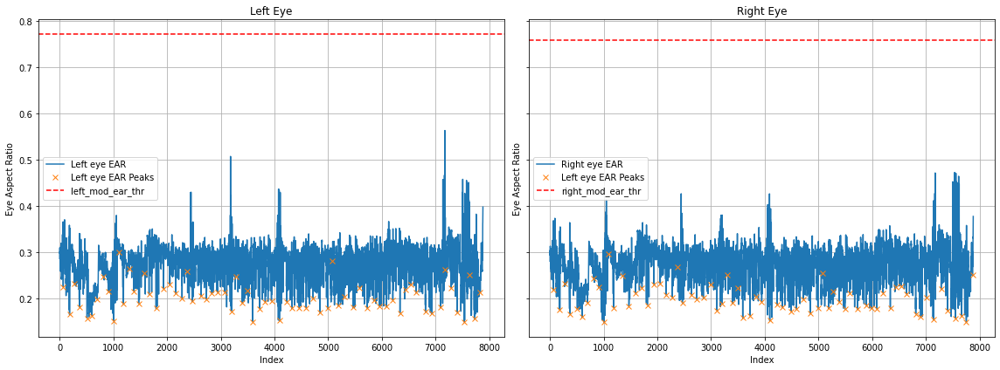

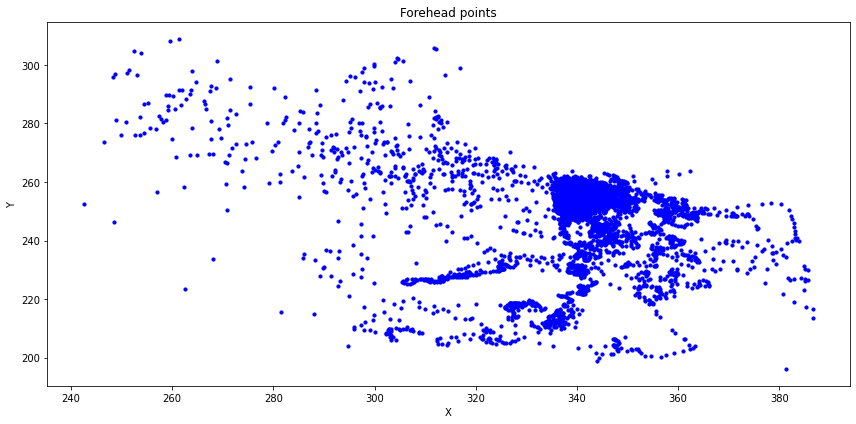

W6B74XpCm6ytNUQIkl3r
Good data for  W6B74XpCm6ytNUQIkl3r ,  99.97720226153565 %


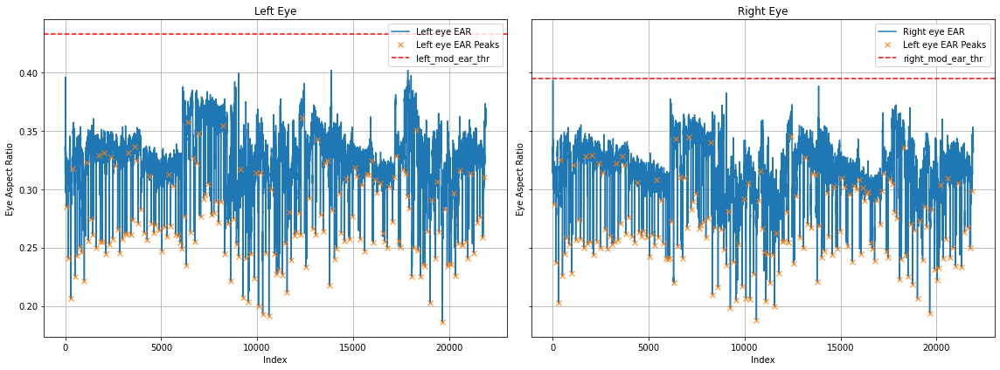

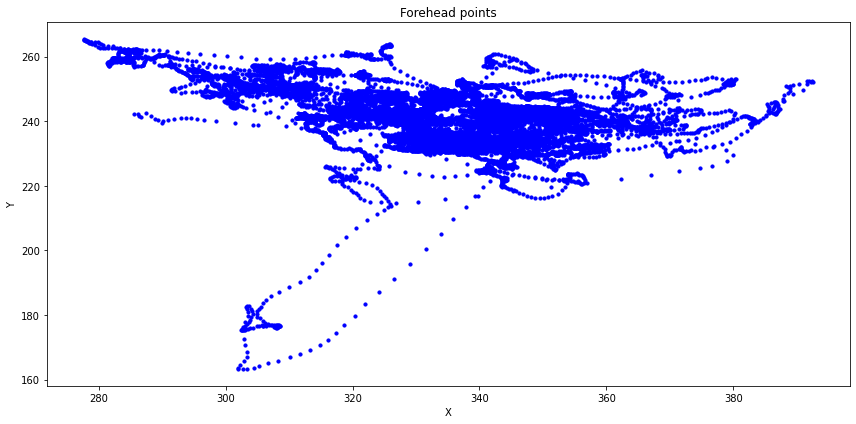

YT2traJWYIoZEoNzOXnj
Good data for  YT2traJWYIoZEoNzOXnj ,  99.1930318944537 %


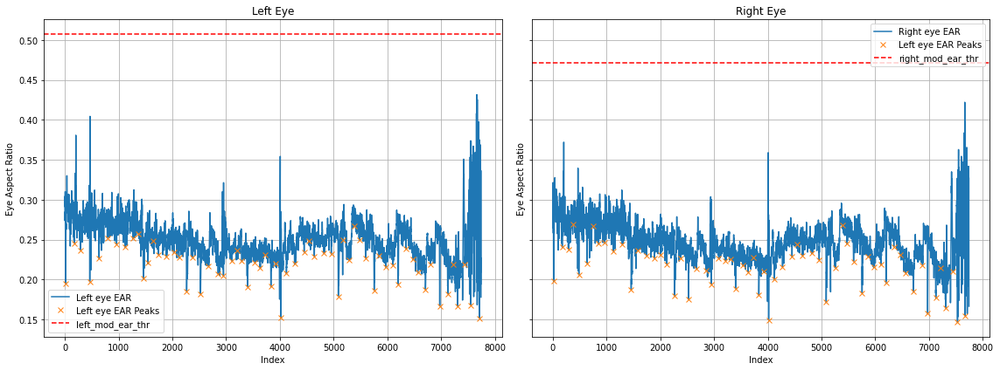

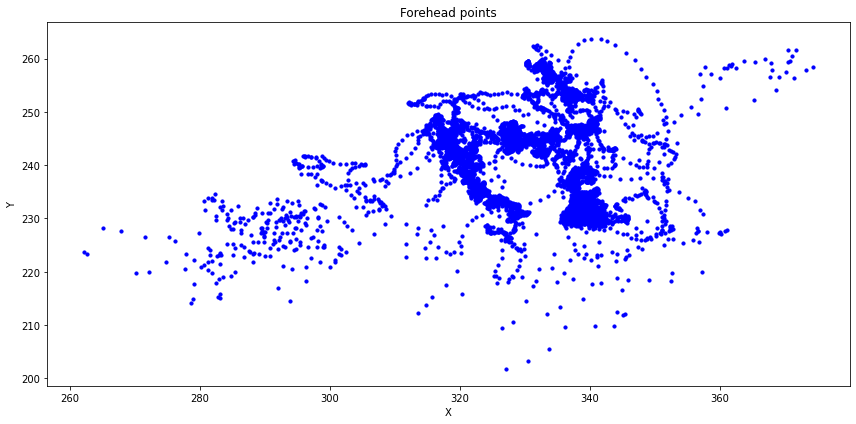

['9gxHq57QwCsL4TLAmXm8', 'MtU5kaSMD9b9CzdA5kaz']
MtU5kaSMD9b9CzdA5kaz
Good data for  MtU5kaSMD9b9CzdA5kaz ,  99.74659486854608 %


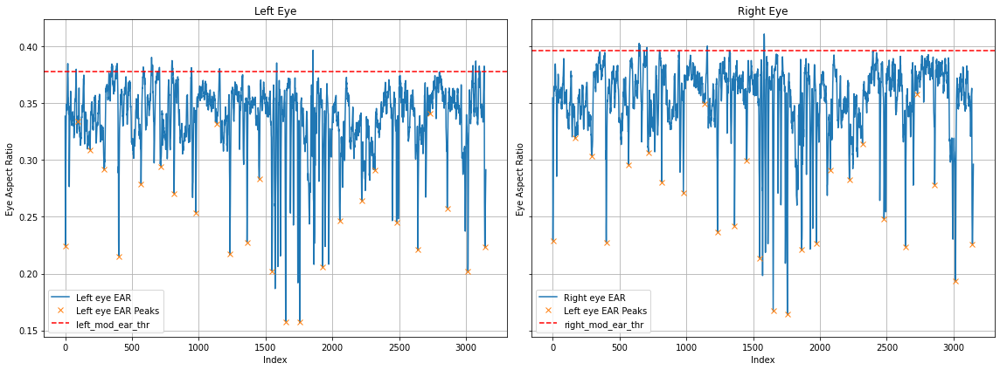

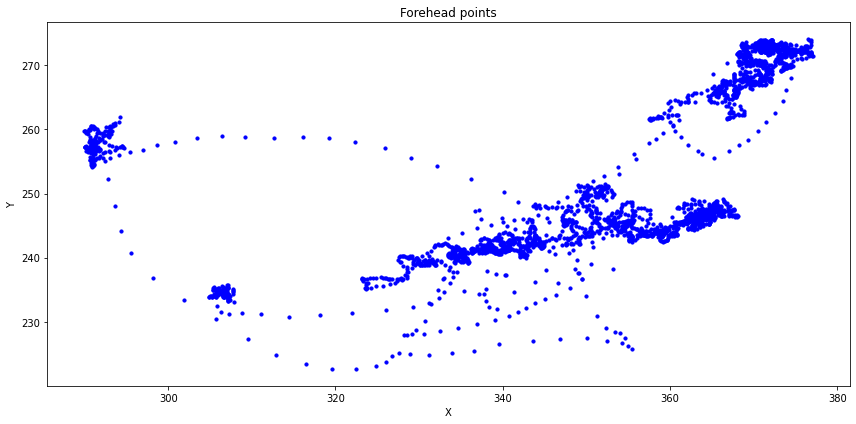

['nOQRQnXCjYfEjdHkGsVt', 'KKFVRCBr0WhcvLdEonYE']
nOQRQnXCjYfEjdHkGsVt
Good data for  nOQRQnXCjYfEjdHkGsVt ,  84.52975920036347 %


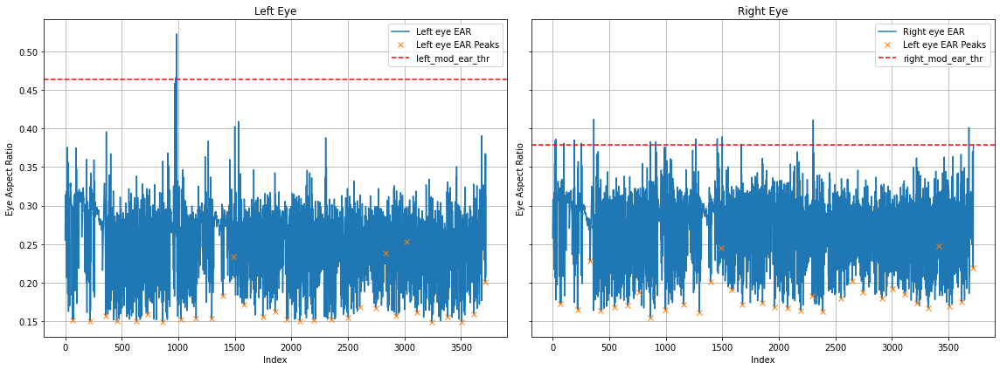

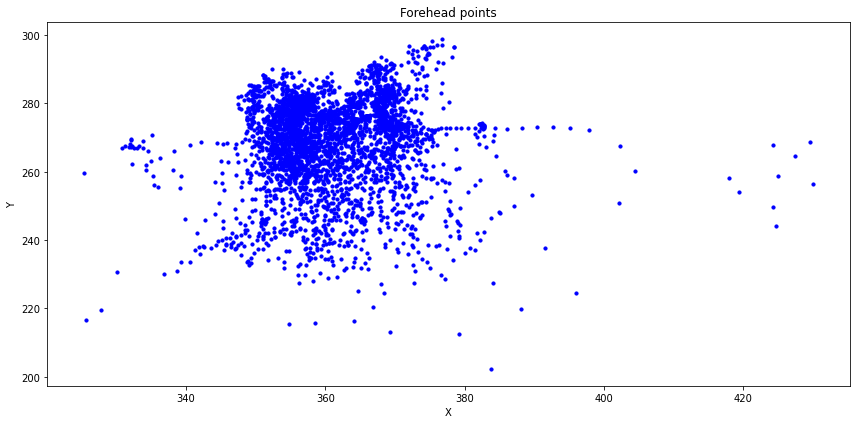

KKFVRCBr0WhcvLdEonYE
Good data for  KKFVRCBr0WhcvLdEonYE ,  97.76249347031168 %


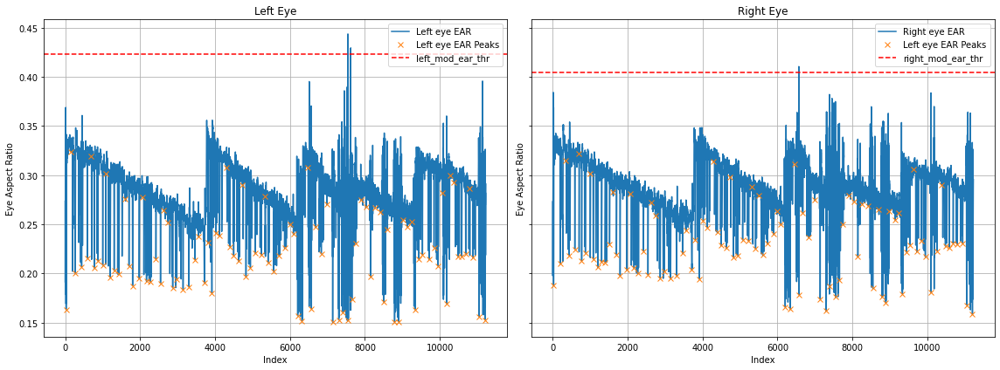

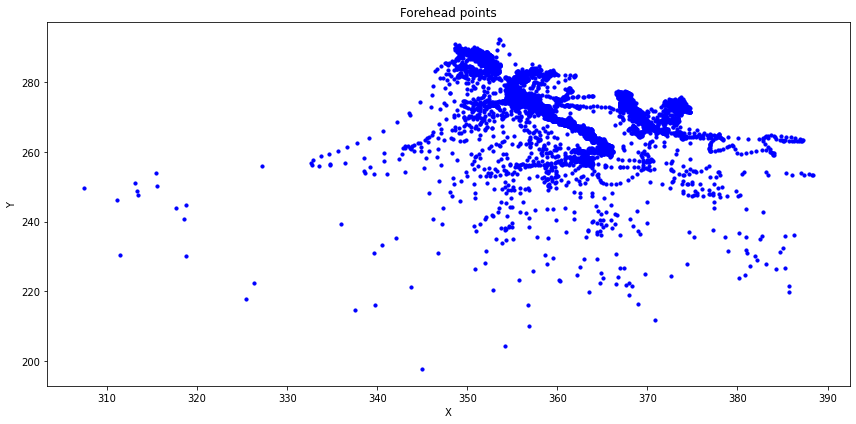

['u5dOYq51Sd8qDKUrTQfL', 'NhRfp18YhW50lUn5XNGO']
u5dOYq51Sd8qDKUrTQfL
Good data for  u5dOYq51Sd8qDKUrTQfL ,  99.83745123537061 %


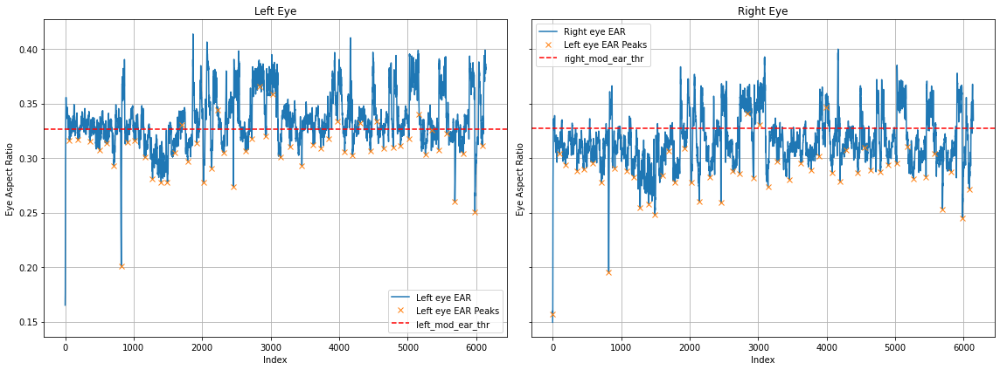

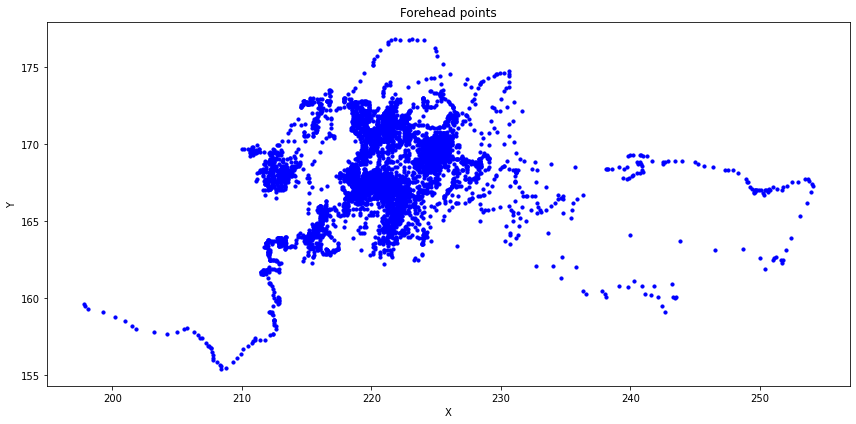

NhRfp18YhW50lUn5XNGO
Good data for  NhRfp18YhW50lUn5XNGO ,  100.0 %


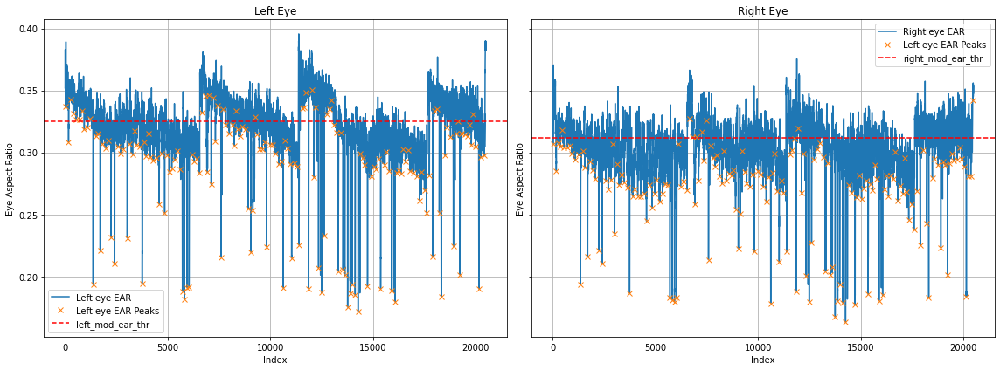

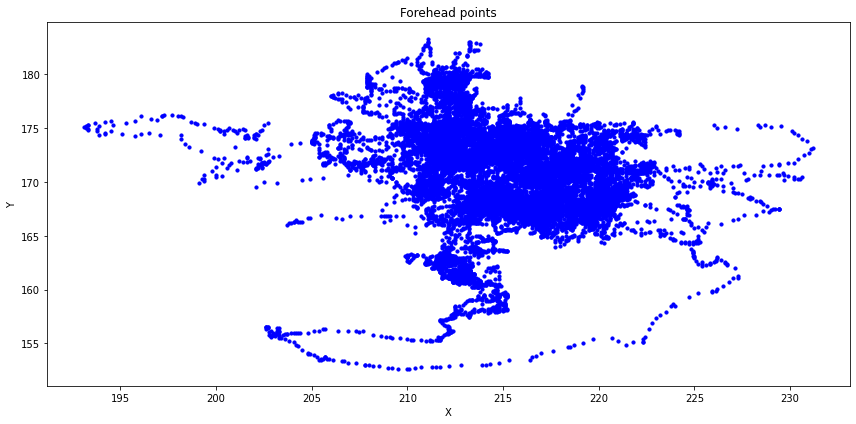

['.DS_Store', 'gUOwt2ytY31QlcI4Ln3y', 'aJvBUPEpvhcuzUTXZfus', 'PZMuBrZuvtX3x8VDd1pR']
['PH4tUuyZYml8u16poAGt', 'bjfhCLT4tyuwl4ctsfMX', 'gz3WugAeAZ6Lt4ZkjNlB', 'fXIYXEjpMOyuuDXaYrK8', 'y6Ttu1DSd50T2rUg1slL', 'Byxfkaot0x12WMgb6aGU', 'iyYpu4OY9yrWoupwljJg', 'kiskqGaF1LD3vAe4BTN4', 'n6gwMWeMDrjDGVDOd4y3', 'jiq2jatJgUmWwuJEtTJd', 'wJhkd6qKK6G8LKXuJDuv', 'mvhnYvgnP0XFchTQAwnQ', 'iOUZeQsj8qiRZALCibre', 'tLKmUmQoyfLdp4wlKVXR', 'ywgm1g2xrm0w83dTe6l3', 'GmyVxiJMosWJfAzJd5Sz', 'sCMWu21PDZxWNGhub2an', 'CA4AMXTscGdpsbJbtS3g', 'CvbqMOJarUsCDQw8FZ5x', 'IY4ZbqFvoOUpEL1dXLeE', 'p5IurDtg9ivSyFEpjGkN', 'HOTeTSL35JZL791ptlU9', 'XdajCVySTIvFEooqvXjh', '.DS_Store', 'FDP5KCUE6JNGZldTQP2C', 'Mae24aFpUtGWXmoJbujf', 'efk3akCrqEykD8PjVGqy', '8UCl13QMemfMqnXKLG0z', 'XjkPboPyEdXs97fxio8q', 'CIv9SP6FrstM2UXx03Mu', 'cm3sFGs1jKpUlcfA29pP', 'OAS1PPBaZfuFX8kipPhP', '0GxtNKcuMWrUGw5o086z', 'CVC1c61Qe7uw4uBfIMB0', '8C4PrFiBk9cH8kZxT5Za', 'nBCJwfeqnpNa1H44nJw4', 'tbTH1VgegZHomsLlptMg', 'SN19IR56JH2rQhyt2Qiy', 'L2da8z1fgzM

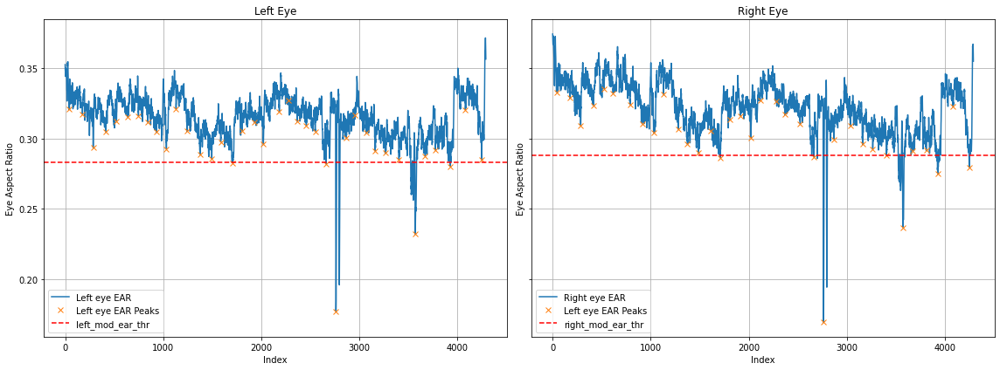

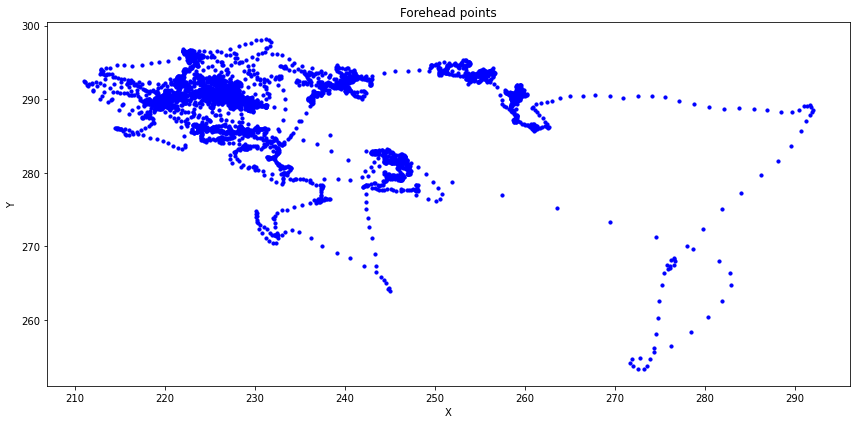

bjfhCLT4tyuwl4ctsfMX
Good data for  bjfhCLT4tyuwl4ctsfMX ,  99.93418165862221 %


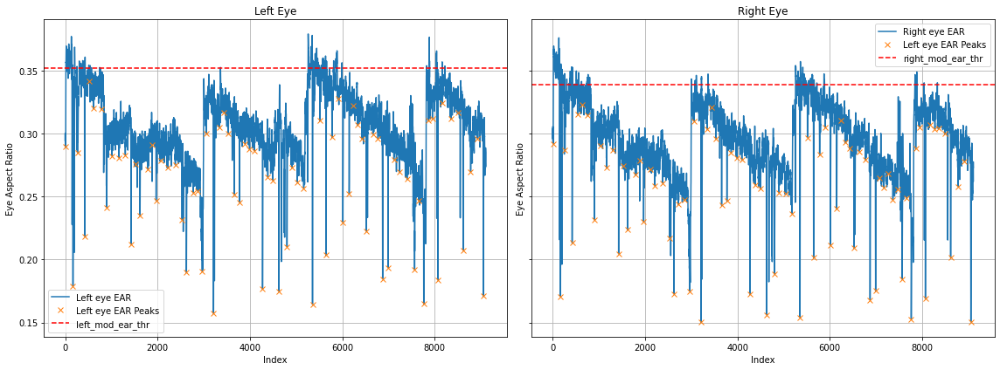

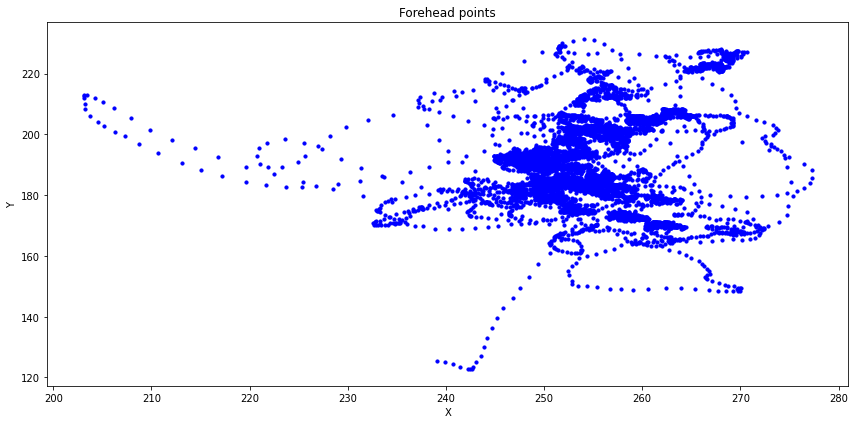

gz3WugAeAZ6Lt4ZkjNlB
Good data for  gz3WugAeAZ6Lt4ZkjNlB ,  98.76059843908004 %


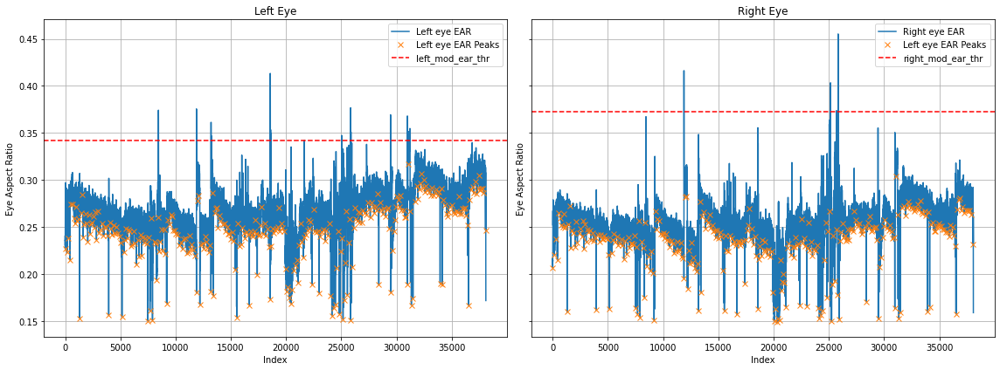

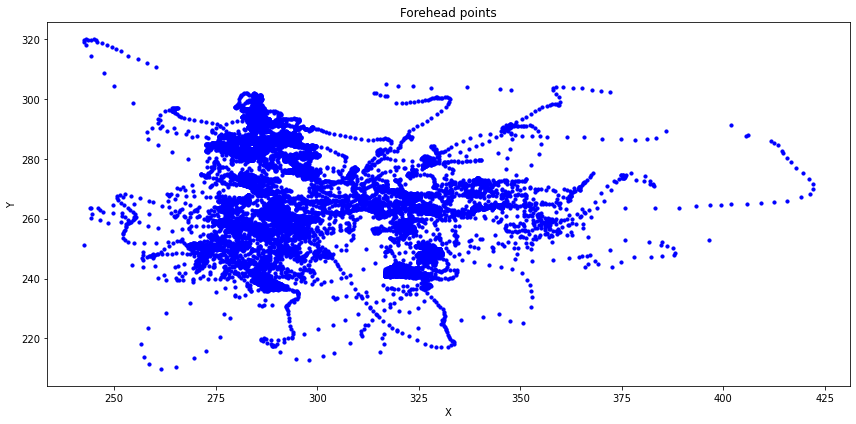

fXIYXEjpMOyuuDXaYrK8
Good data for  fXIYXEjpMOyuuDXaYrK8 ,  99.85405010946242 %


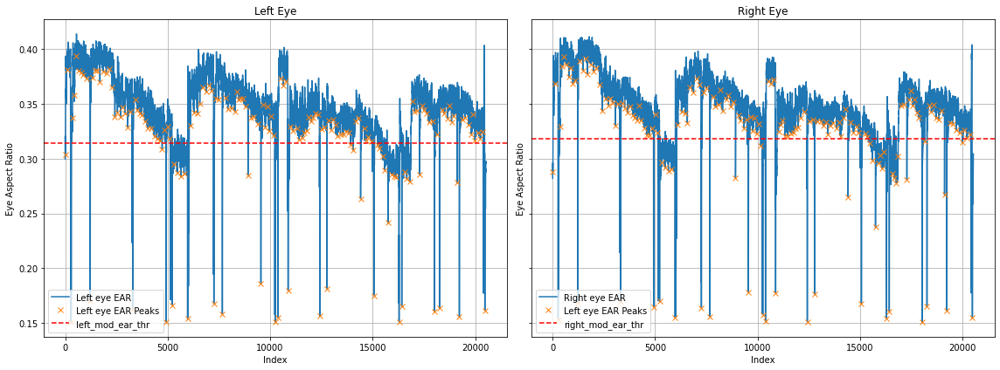

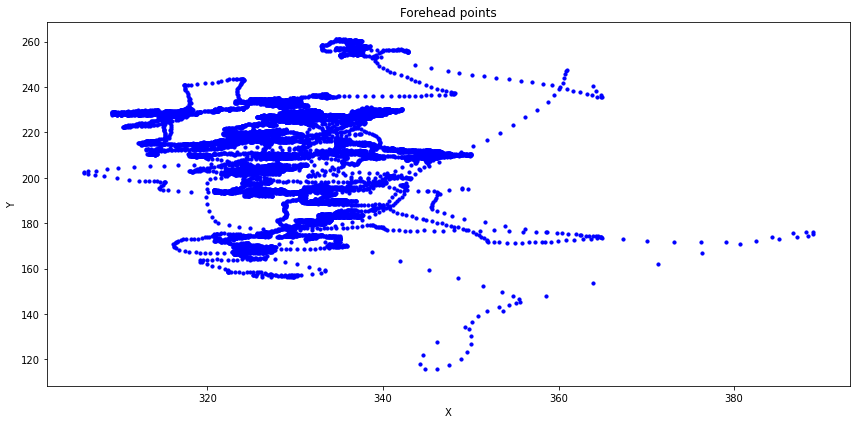

y6Ttu1DSd50T2rUg1slL
Good data for  y6Ttu1DSd50T2rUg1slL ,  97.78622729193071 %


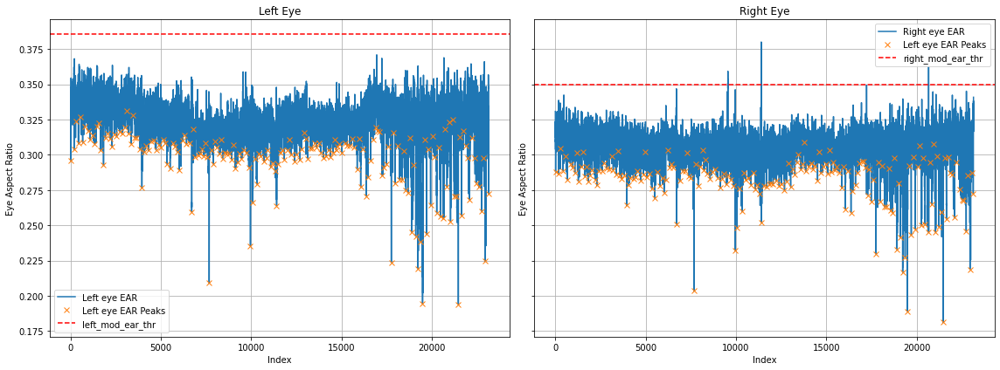

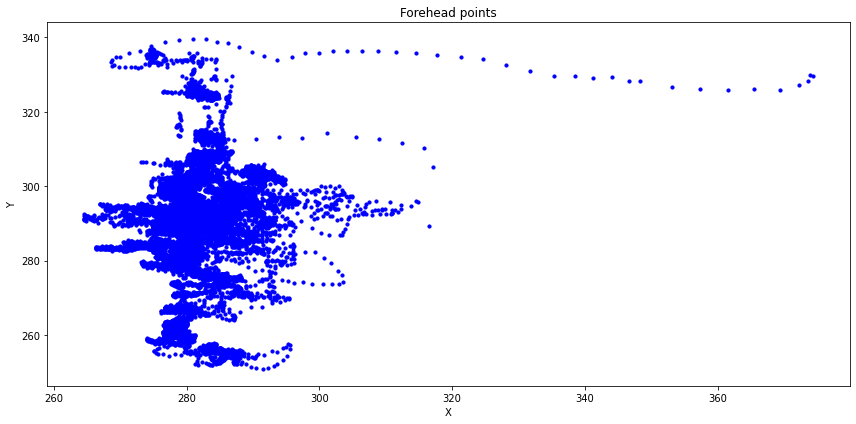

Byxfkaot0x12WMgb6aGU
Good data for  Byxfkaot0x12WMgb6aGU ,  100.0 %


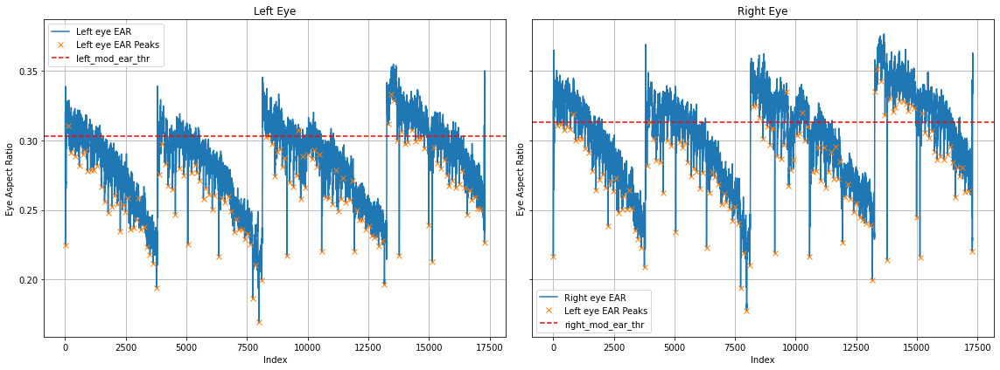

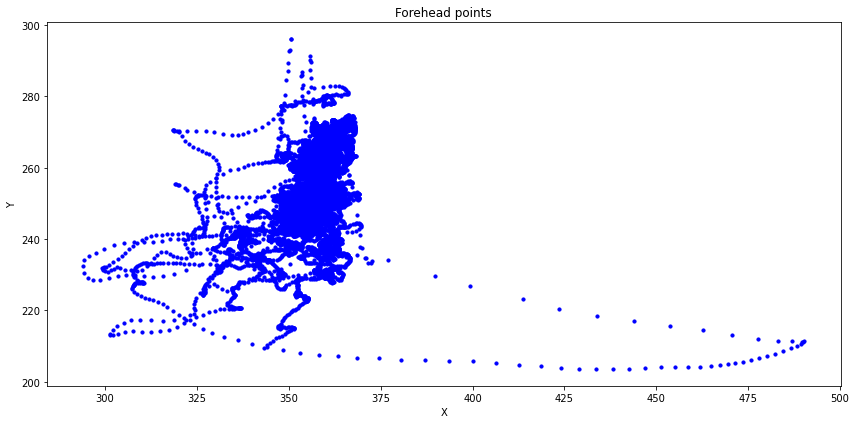

iyYpu4OY9yrWoupwljJg
Good data for  iyYpu4OY9yrWoupwljJg ,  99.80645728864256 %


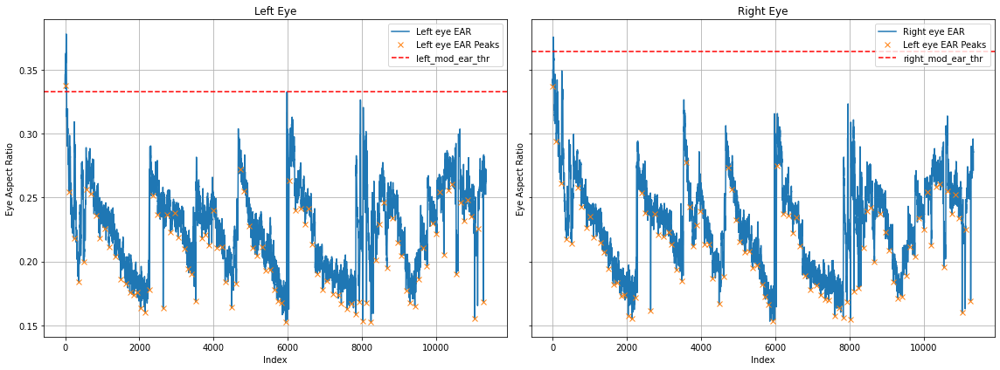

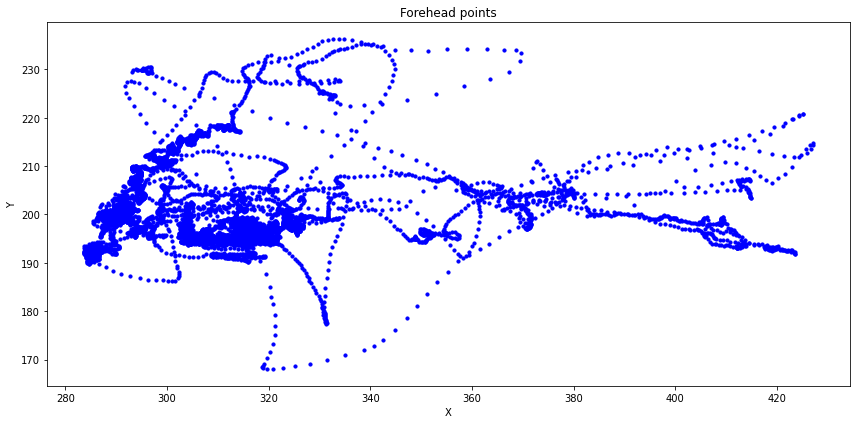

kiskqGaF1LD3vAe4BTN4
Good data for  kiskqGaF1LD3vAe4BTN4 ,  99.68530174009626 %


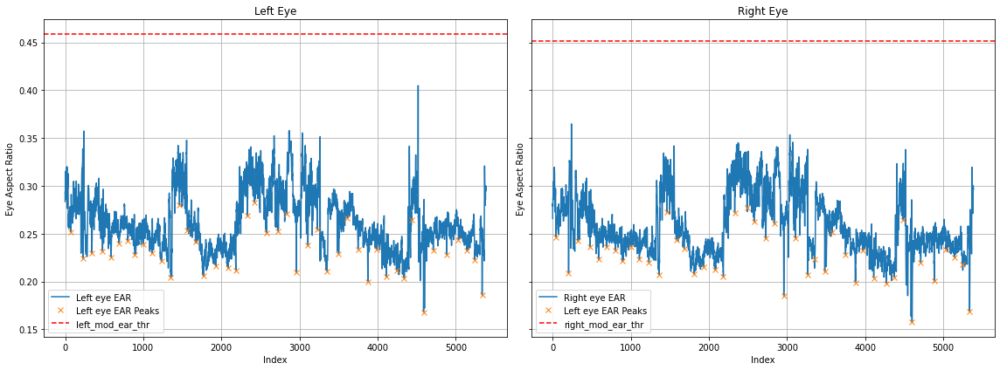

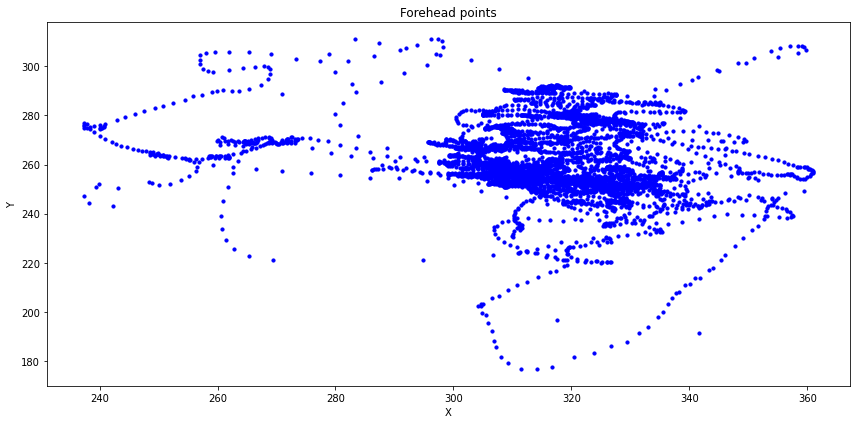

n6gwMWeMDrjDGVDOd4y3
Good data for  n6gwMWeMDrjDGVDOd4y3 ,  89.43719412724307 %


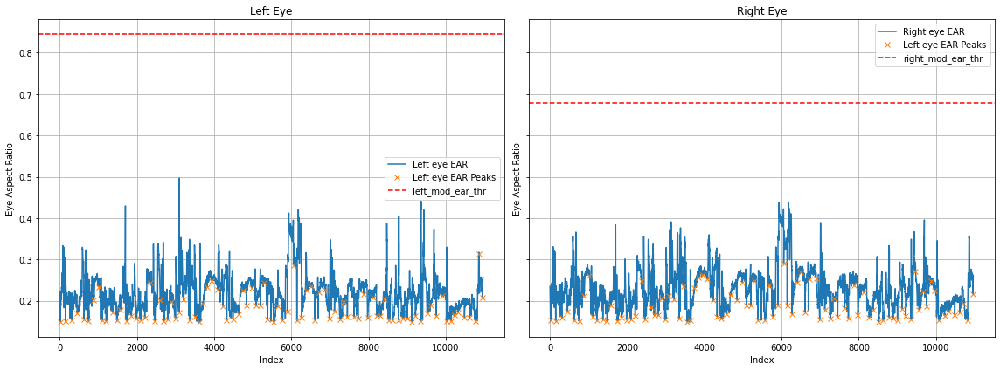

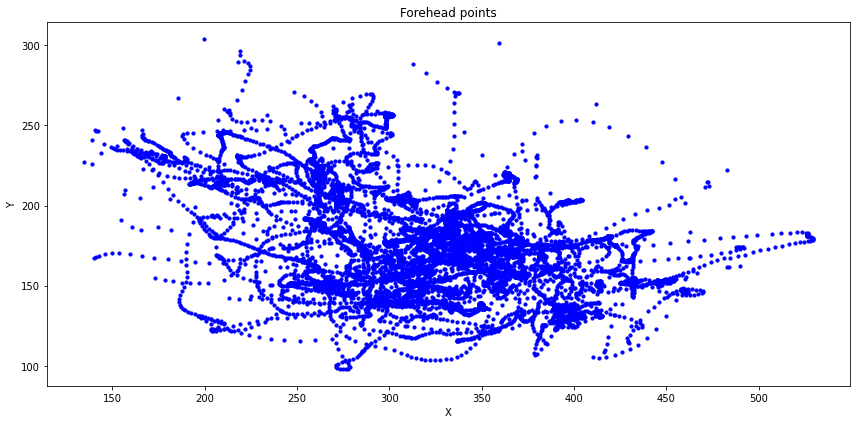

jiq2jatJgUmWwuJEtTJd
Good data for  jiq2jatJgUmWwuJEtTJd ,  99.95859384704568 %


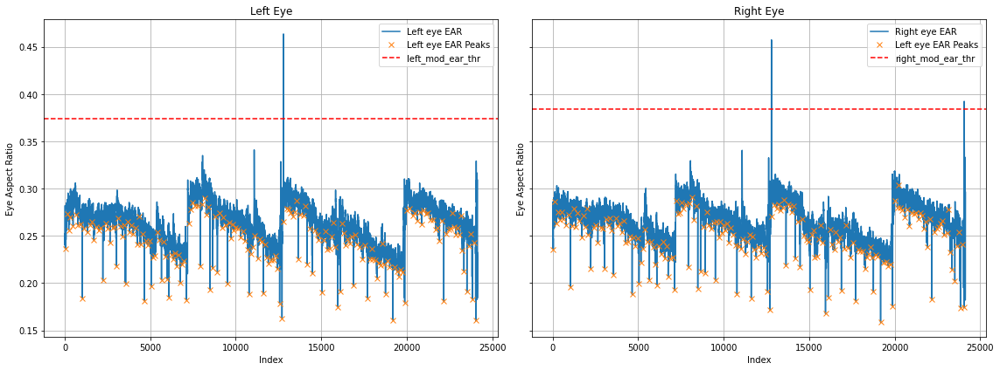

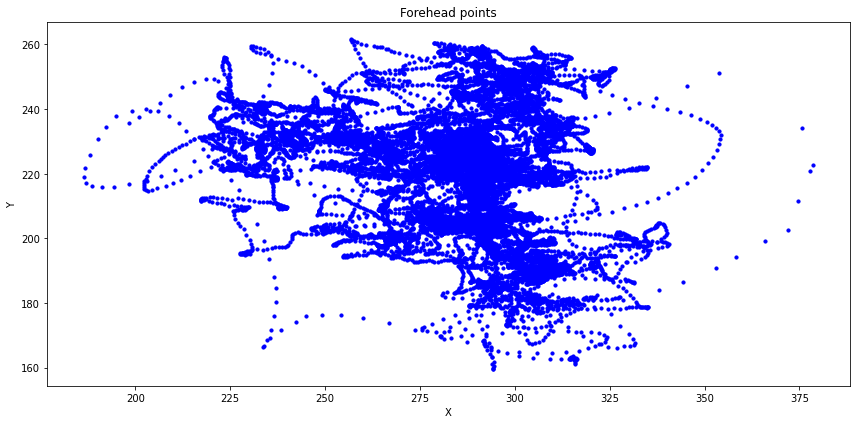

wJhkd6qKK6G8LKXuJDuv
Good data for  wJhkd6qKK6G8LKXuJDuv ,  96.95891431172163 %


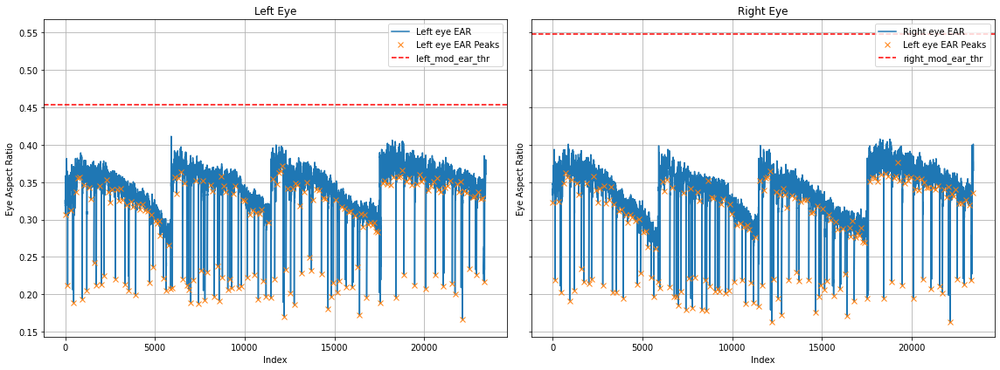

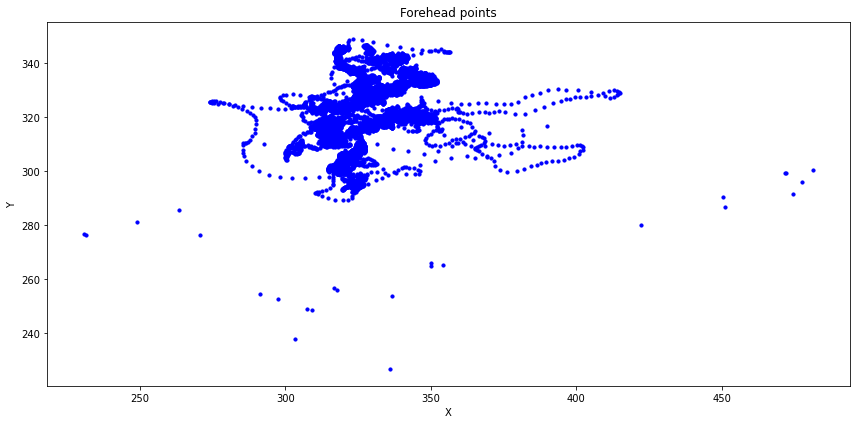

mvhnYvgnP0XFchTQAwnQ
Good data for  mvhnYvgnP0XFchTQAwnQ ,  94.9468085106383 %


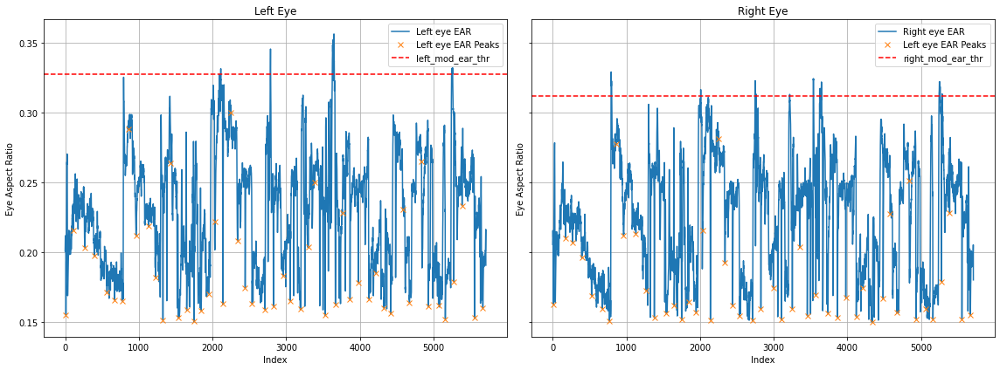

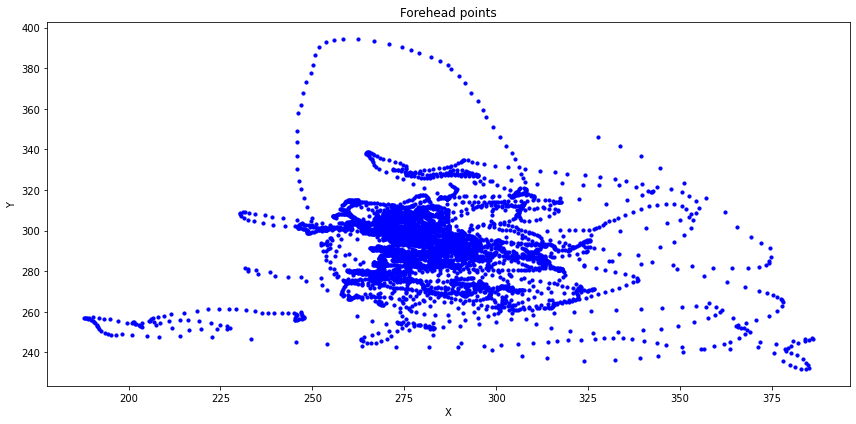

iOUZeQsj8qiRZALCibre
Good data for  iOUZeQsj8qiRZALCibre ,  92.68371641307867 %


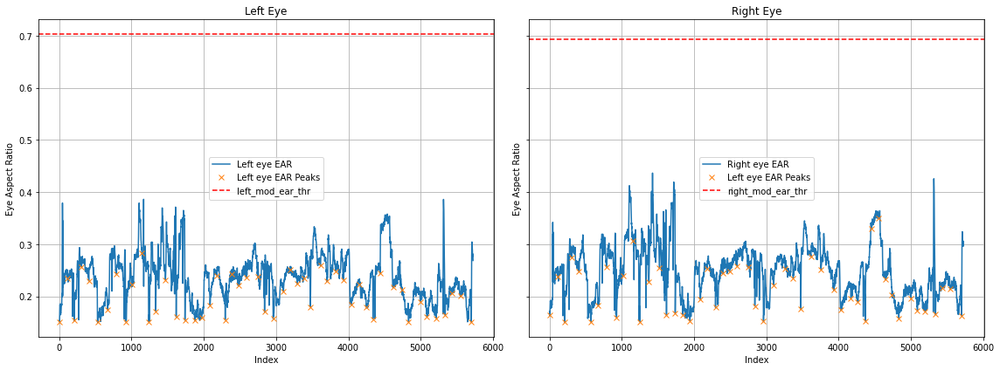

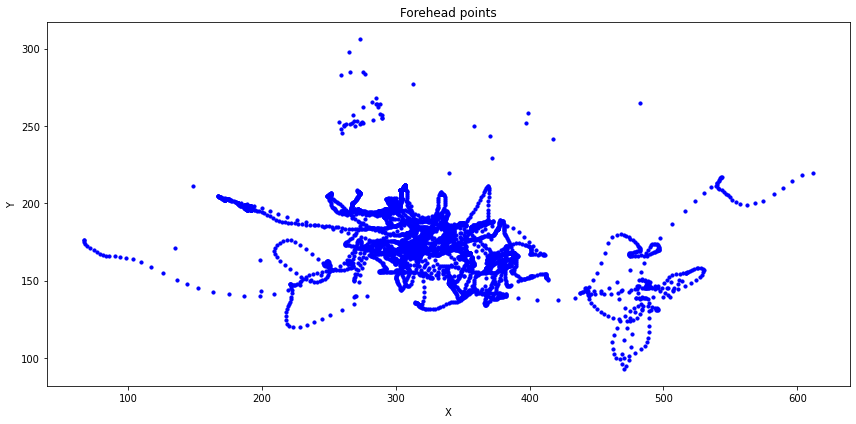

tLKmUmQoyfLdp4wlKVXR
Good data for  tLKmUmQoyfLdp4wlKVXR ,  96.36380041505006 %


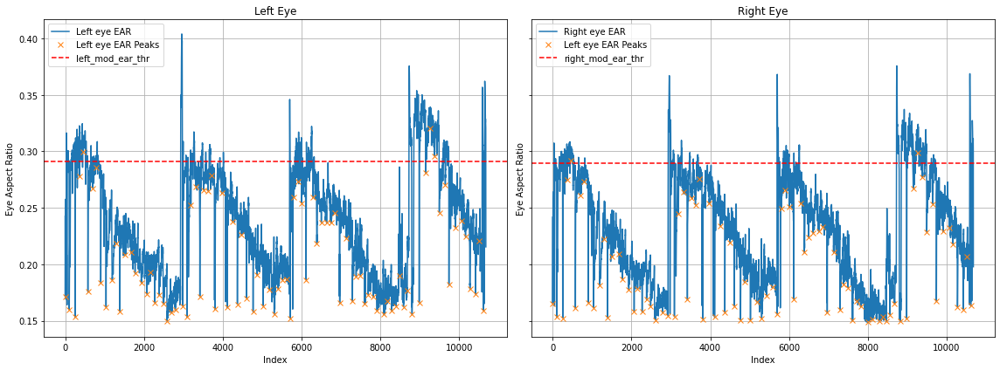

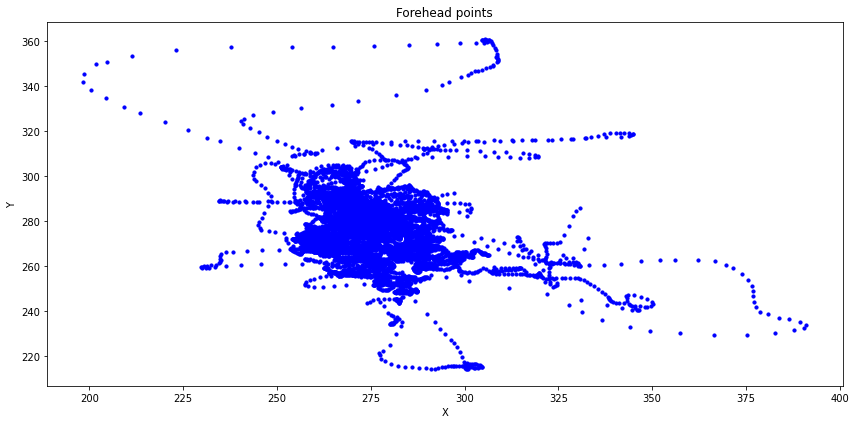

ywgm1g2xrm0w83dTe6l3
Good data for  ywgm1g2xrm0w83dTe6l3 ,  96.54346338124572 %


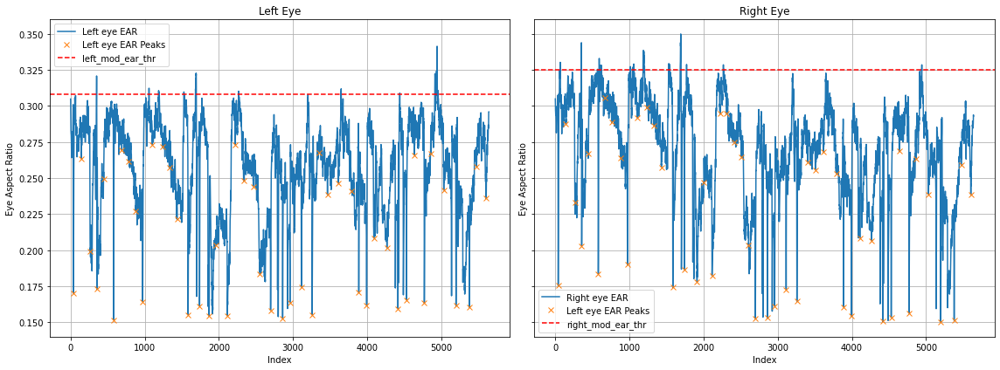

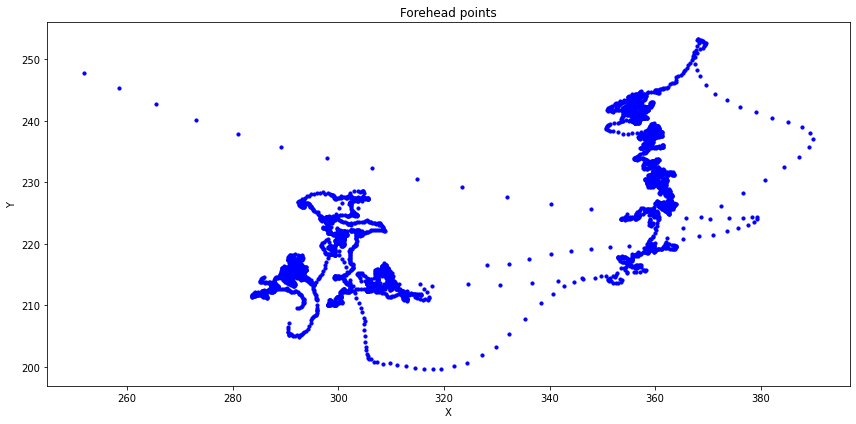

GmyVxiJMosWJfAzJd5Sz
Good data for  GmyVxiJMosWJfAzJd5Sz ,  97.21240675304279 %


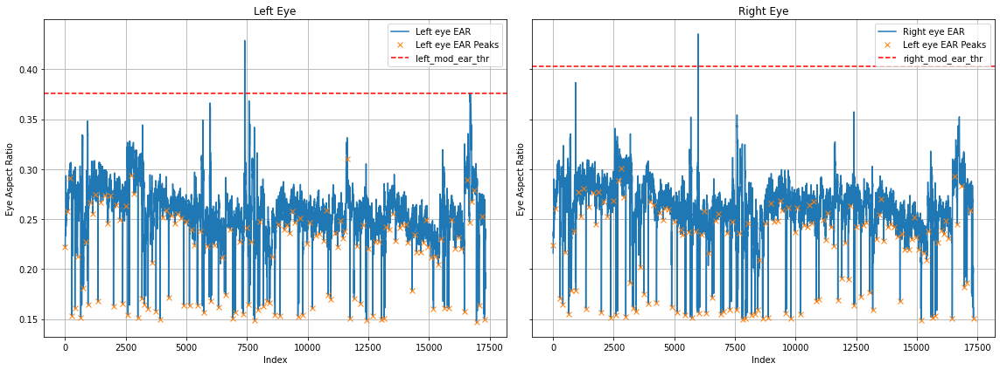

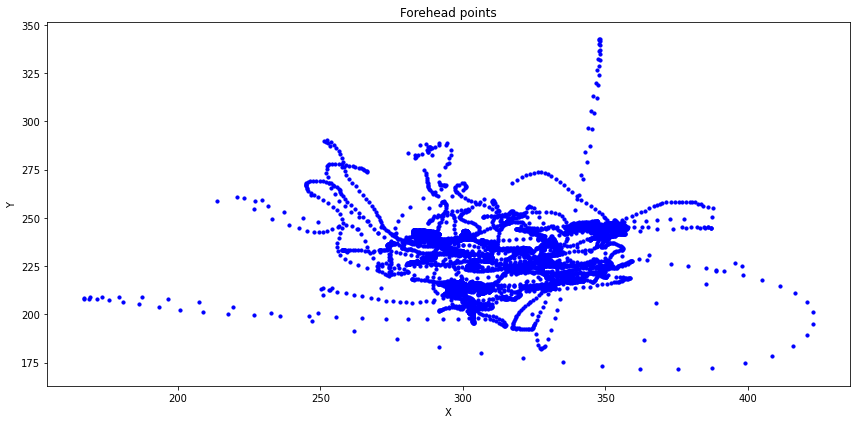

sCMWu21PDZxWNGhub2an
Good data for  sCMWu21PDZxWNGhub2an ,  97.58862324814508 %


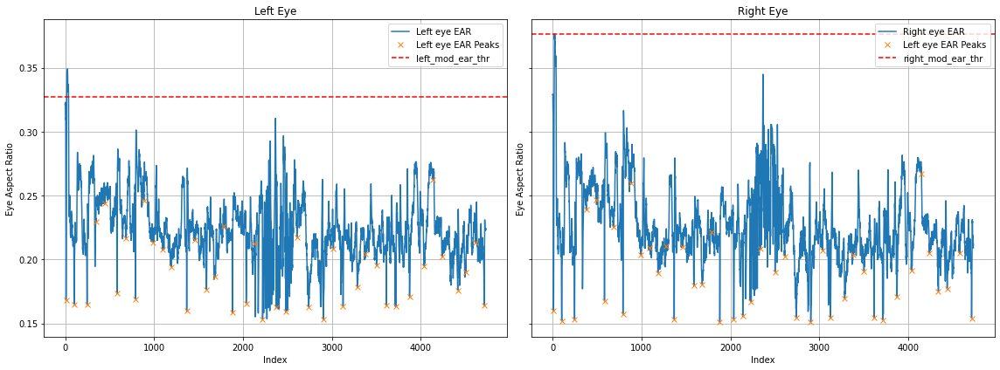

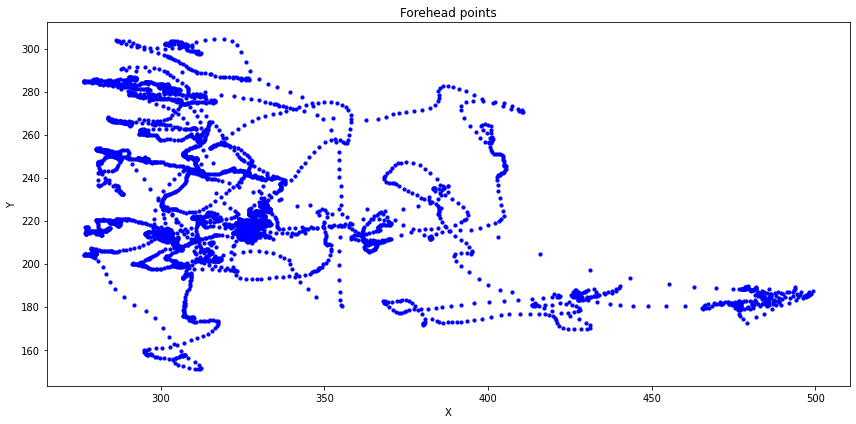

CA4AMXTscGdpsbJbtS3g
Good data for  CA4AMXTscGdpsbJbtS3g ,  99.49773982923155 %


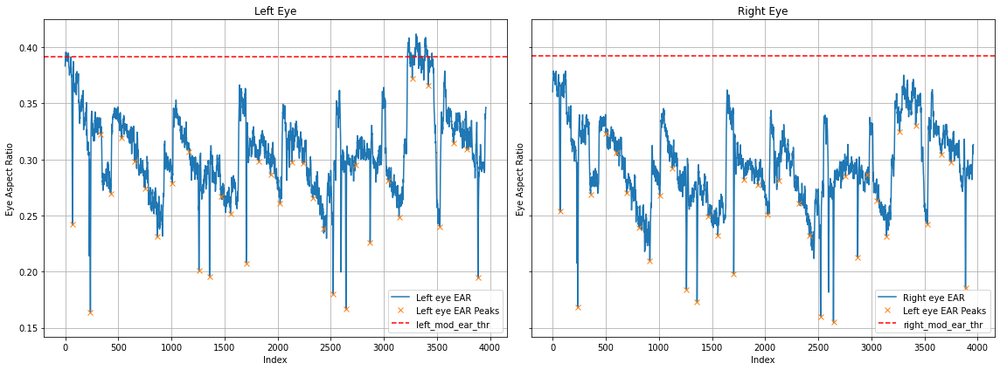

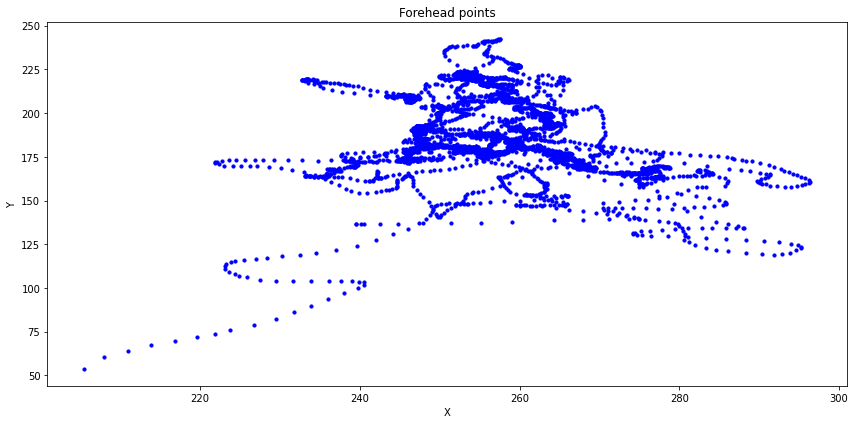

CvbqMOJarUsCDQw8FZ5x
Good data for  CvbqMOJarUsCDQw8FZ5x ,  99.59963967570815 %


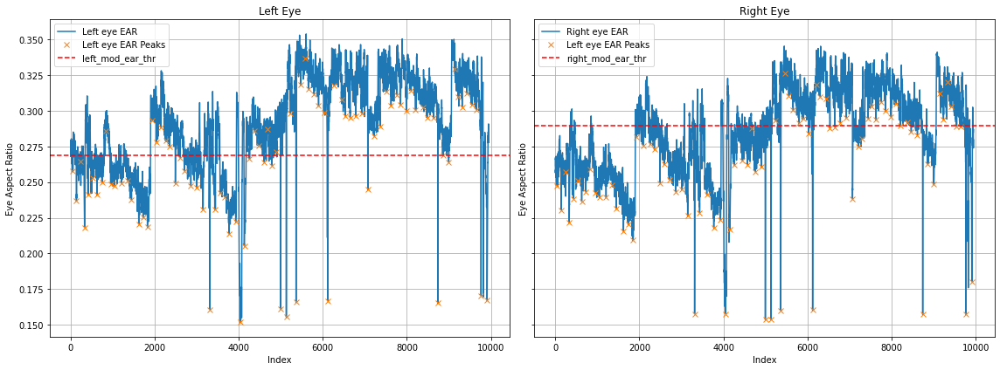

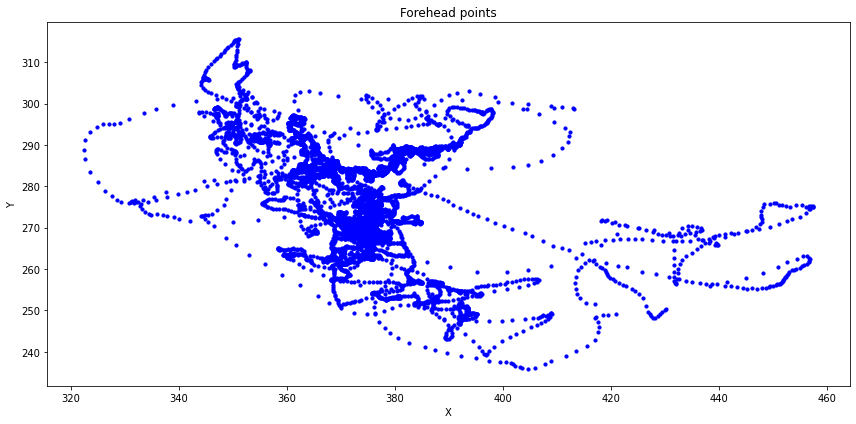

IY4ZbqFvoOUpEL1dXLeE
Good data for  IY4ZbqFvoOUpEL1dXLeE ,  93.52057478772045 %


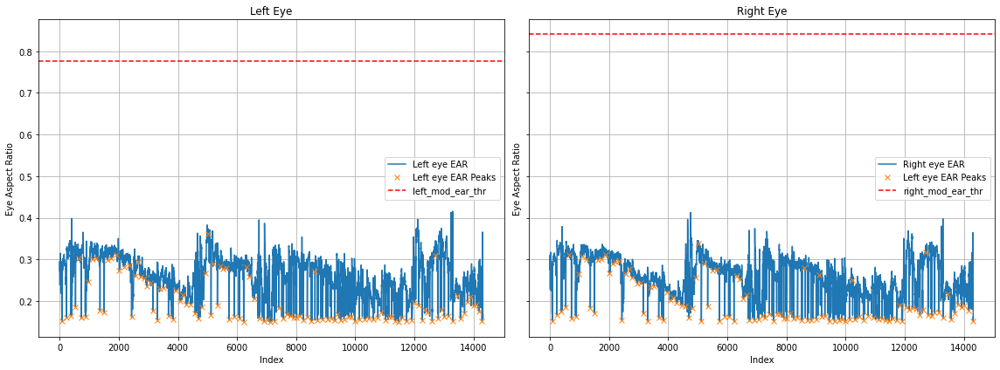

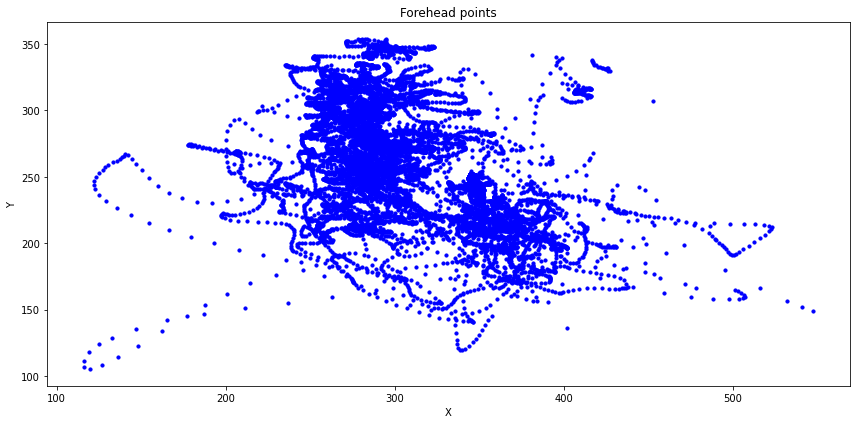

p5IurDtg9ivSyFEpjGkN
Good data for  p5IurDtg9ivSyFEpjGkN ,  99.96008302730321 %


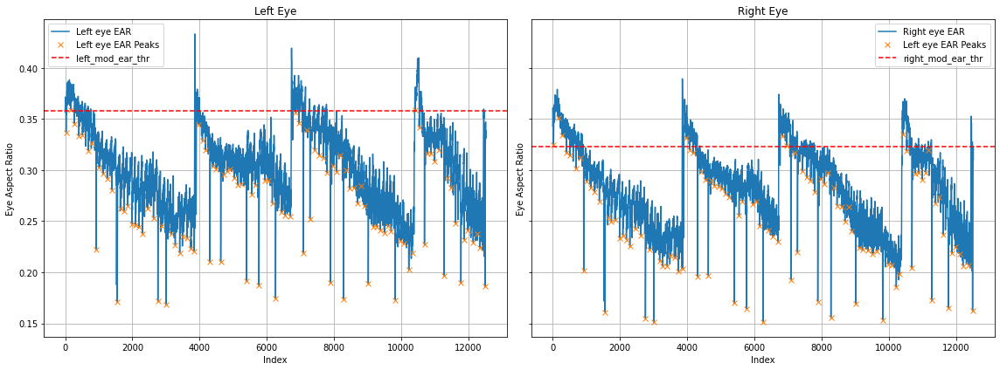

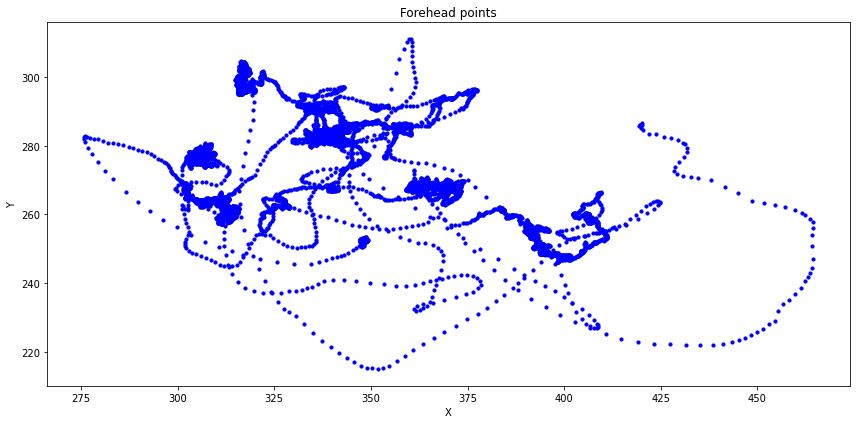

HOTeTSL35JZL791ptlU9
Good data for  HOTeTSL35JZL791ptlU9 ,  99.88190455741048 %


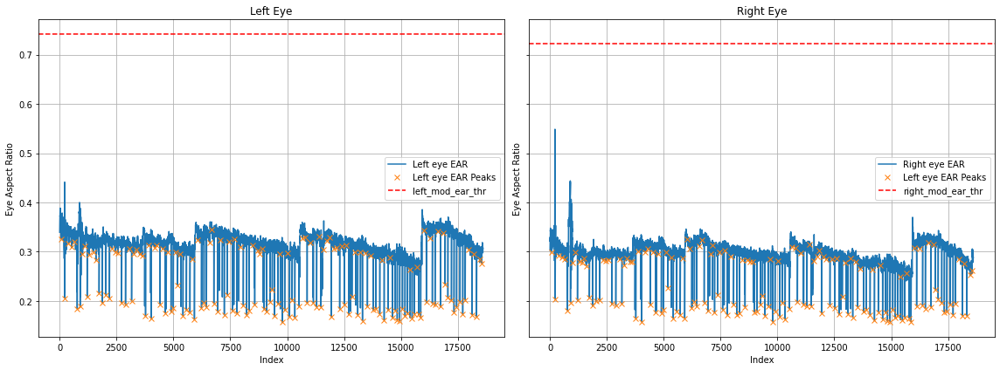

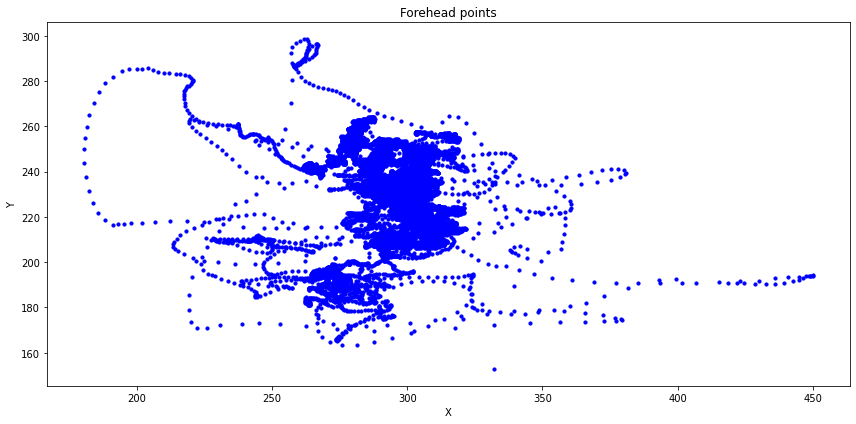

XdajCVySTIvFEooqvXjh
Good data for  XdajCVySTIvFEooqvXjh ,  90.90316269970656 %


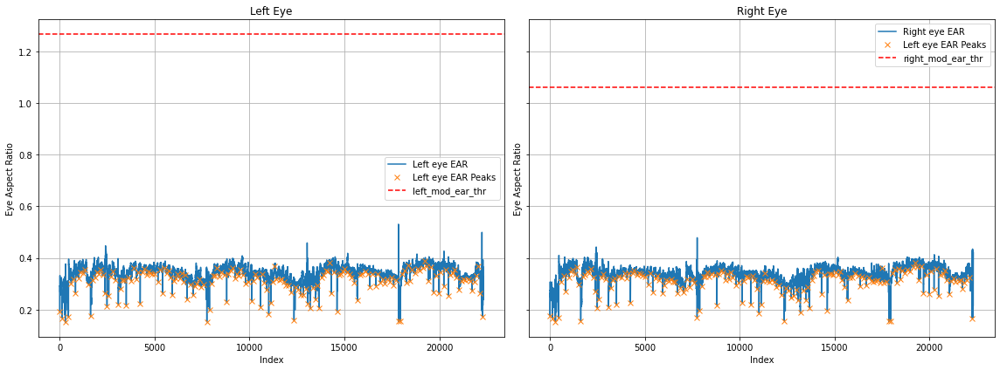

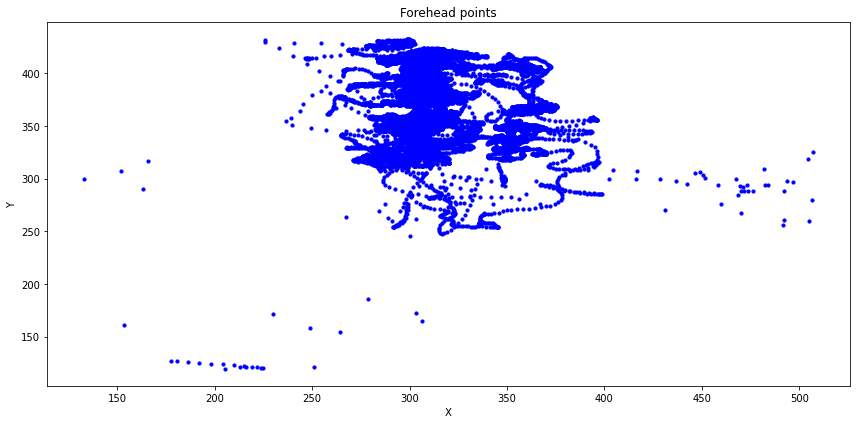

FDP5KCUE6JNGZldTQP2C
Good data for  FDP5KCUE6JNGZldTQP2C ,  93.80194858809931 %


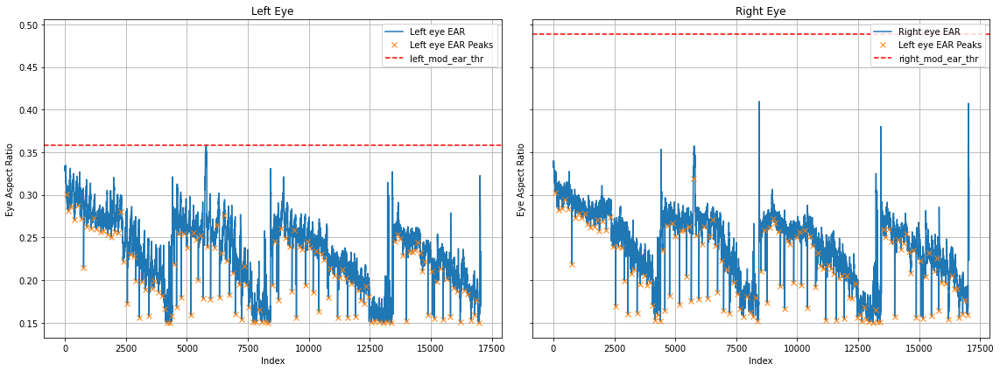

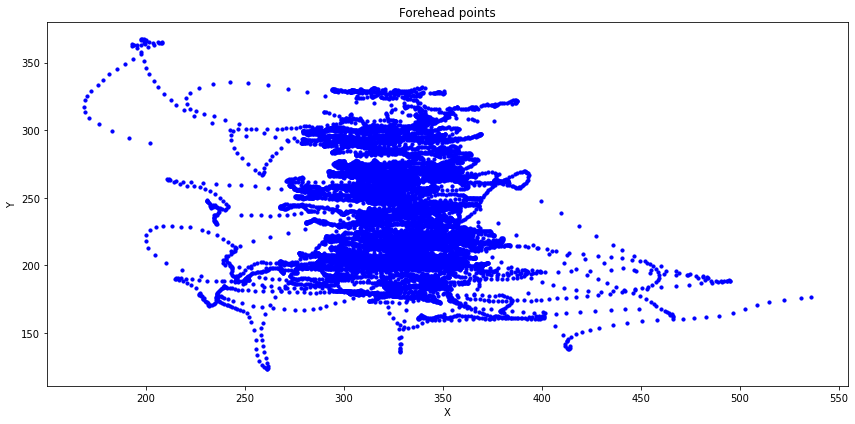

Mae24aFpUtGWXmoJbujf
Good data for  Mae24aFpUtGWXmoJbujf ,  99.9084249084249 %


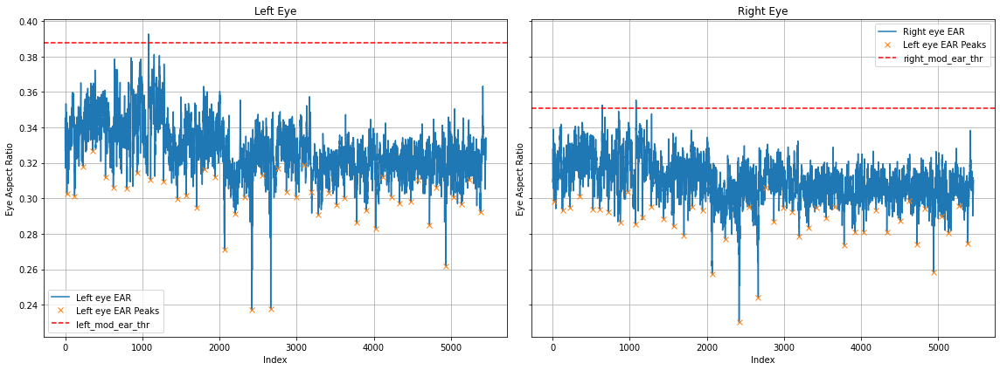

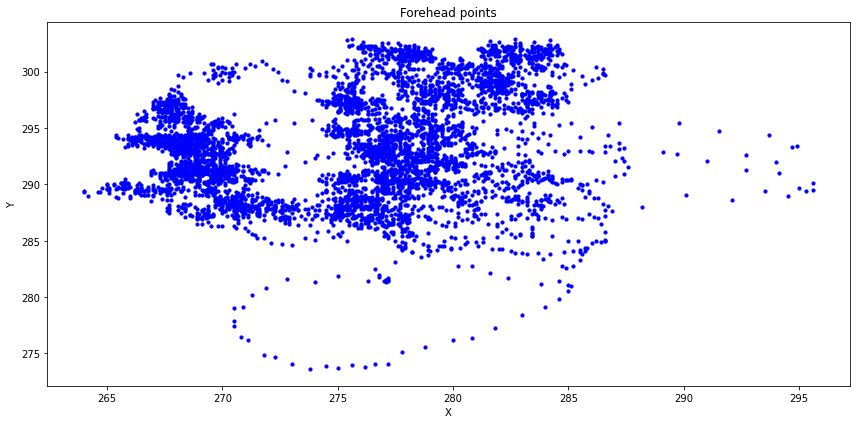

efk3akCrqEykD8PjVGqy
Good data for  efk3akCrqEykD8PjVGqy ,  99.78517722878625 %


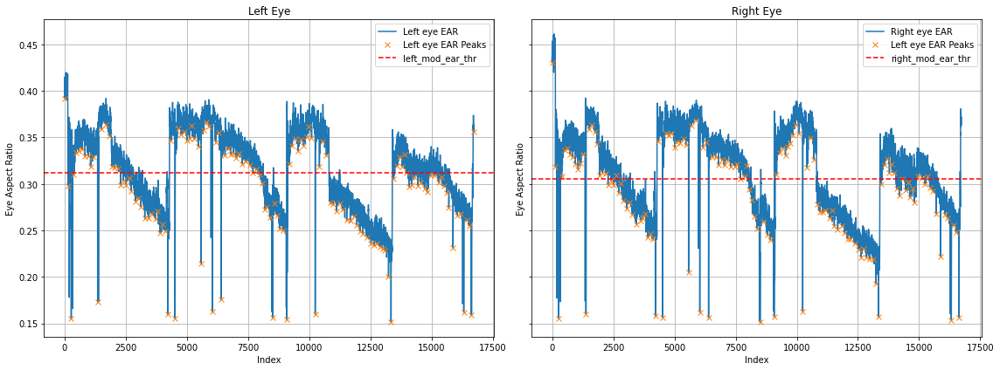

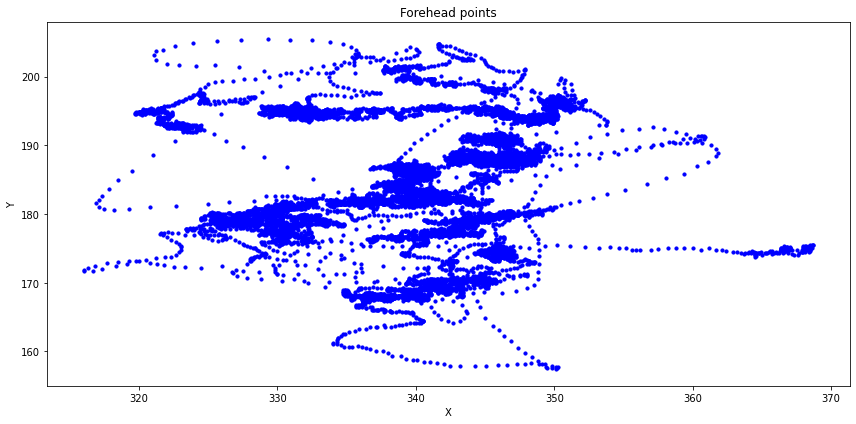

8UCl13QMemfMqnXKLG0z
Good data for  8UCl13QMemfMqnXKLG0z ,  99.66893507448961 %


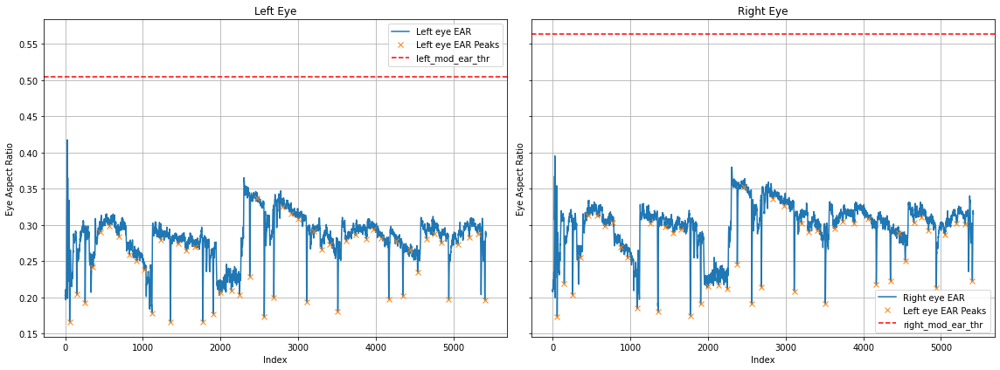

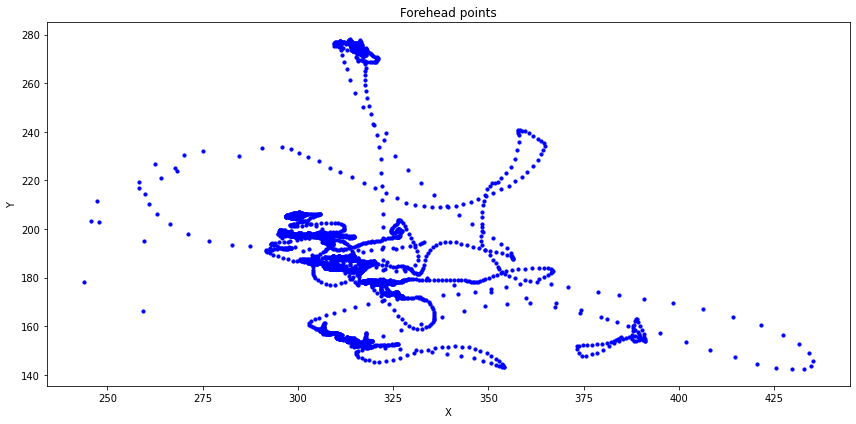

XjkPboPyEdXs97fxio8q
Good data for  XjkPboPyEdXs97fxio8q ,  99.06017331868668 %


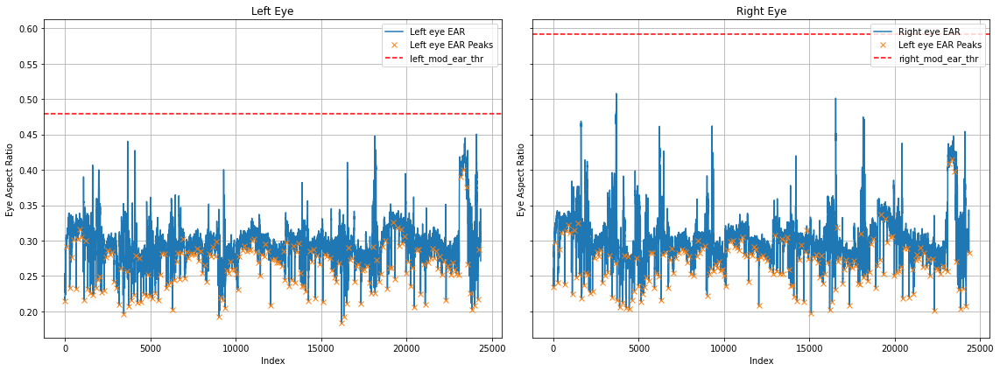

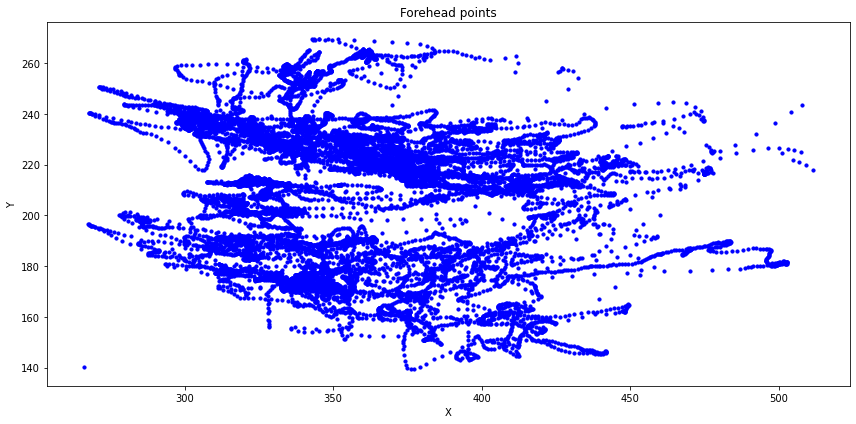

cm3sFGs1jKpUlcfA29pP
Good data for  cm3sFGs1jKpUlcfA29pP ,  100.0 %


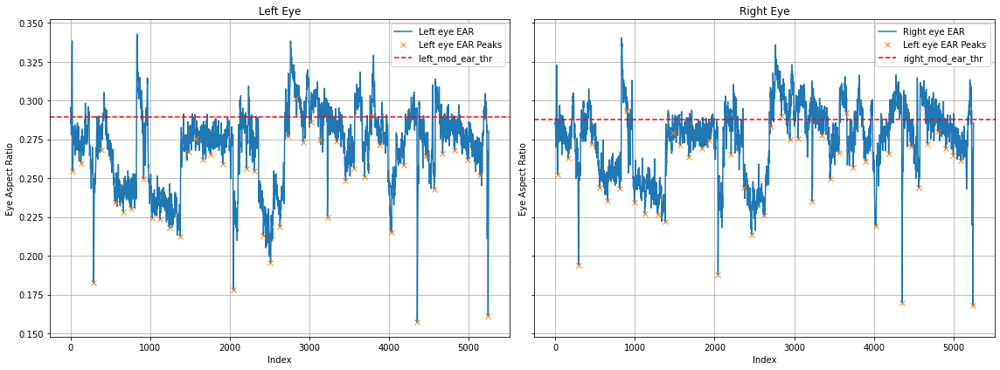

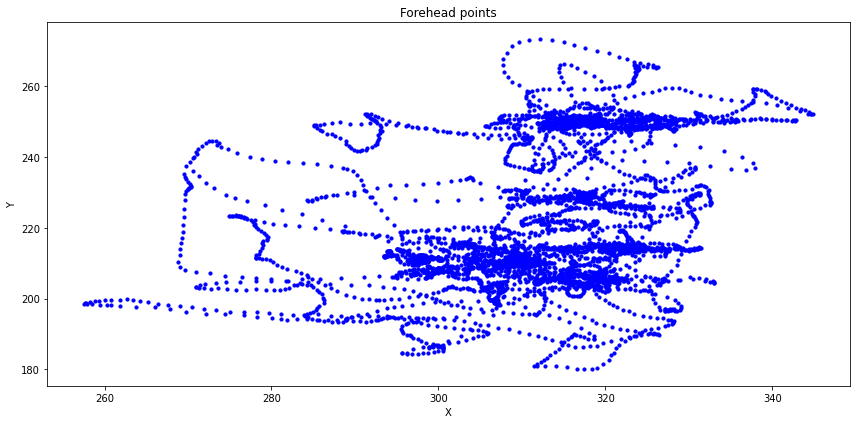

OAS1PPBaZfuFX8kipPhP
Good data for  OAS1PPBaZfuFX8kipPhP ,  99.31621880998081 %


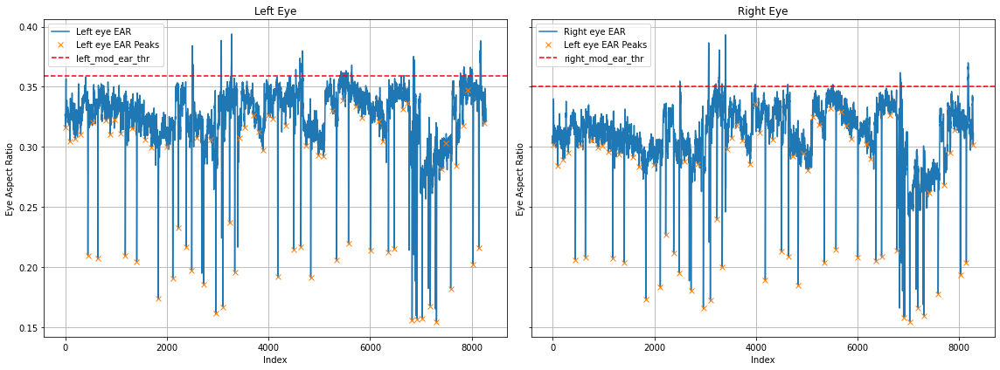

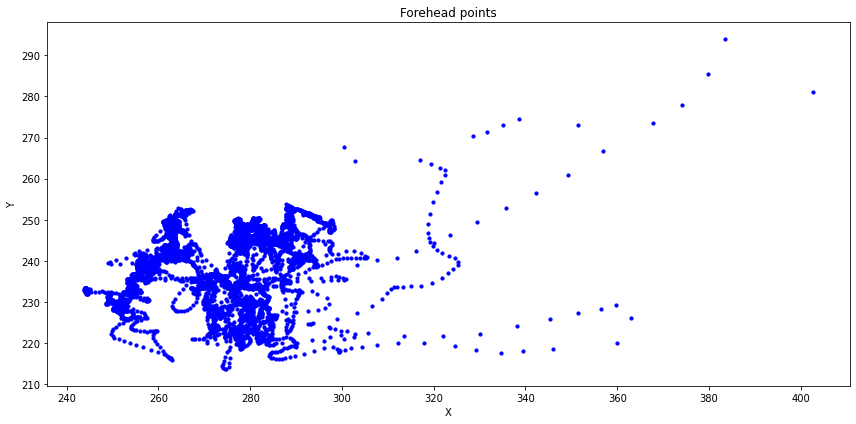

0GxtNKcuMWrUGw5o086z
Good data for  0GxtNKcuMWrUGw5o086z ,  99.82404692082112 %


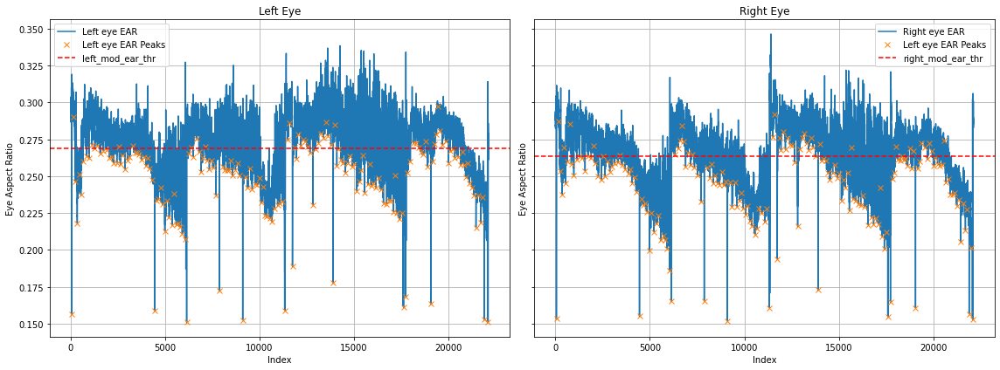

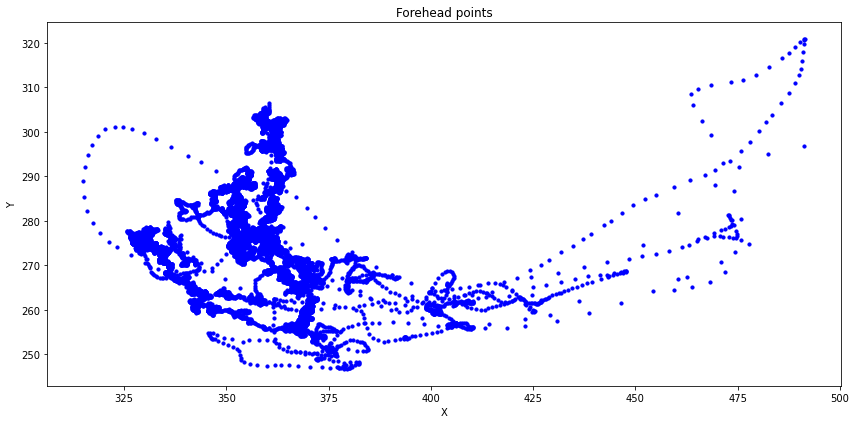

CVC1c61Qe7uw4uBfIMB0
Good data for  CVC1c61Qe7uw4uBfIMB0 ,  99.92845218220843 %


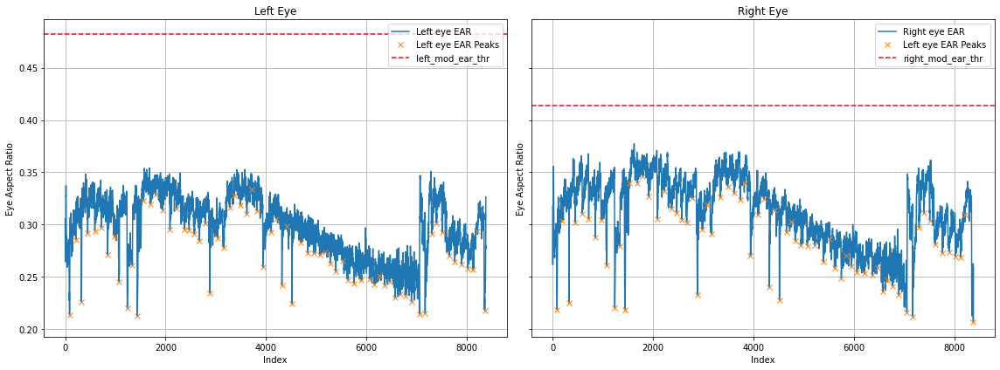

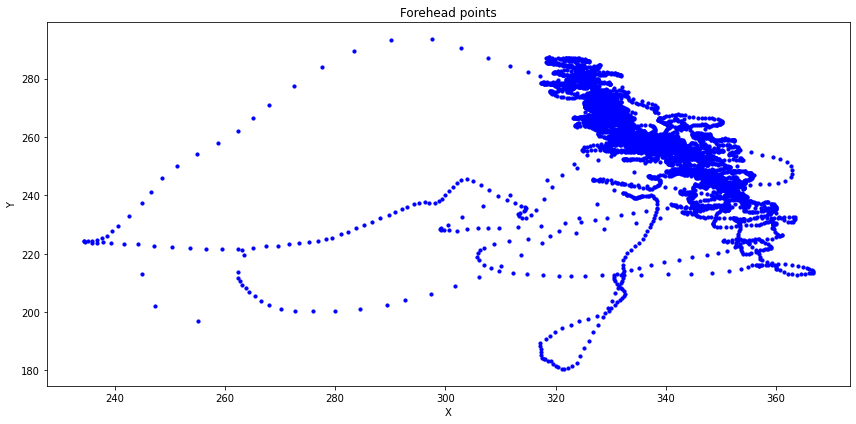

8C4PrFiBk9cH8kZxT5Za
Good data for  8C4PrFiBk9cH8kZxT5Za ,  99.34917274366816 %


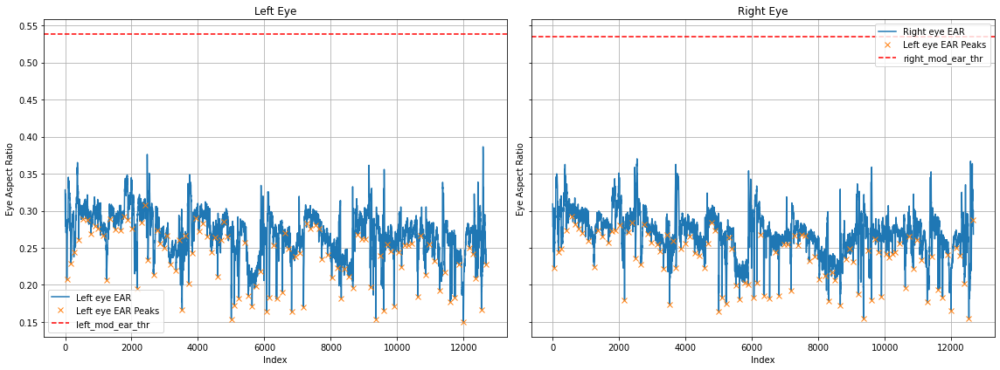

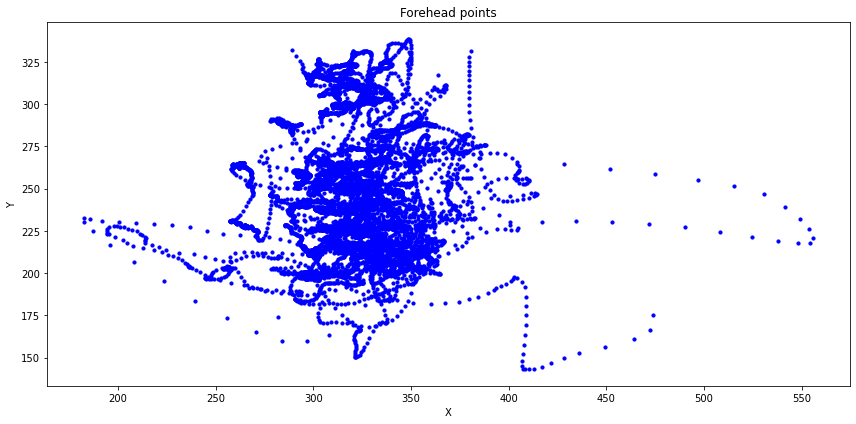

nBCJwfeqnpNa1H44nJw4
Good data for  nBCJwfeqnpNa1H44nJw4 ,  96.3956701980654 %


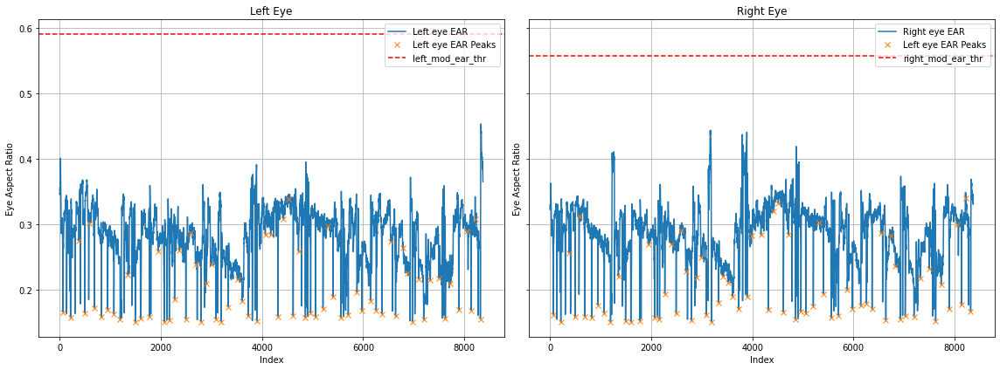

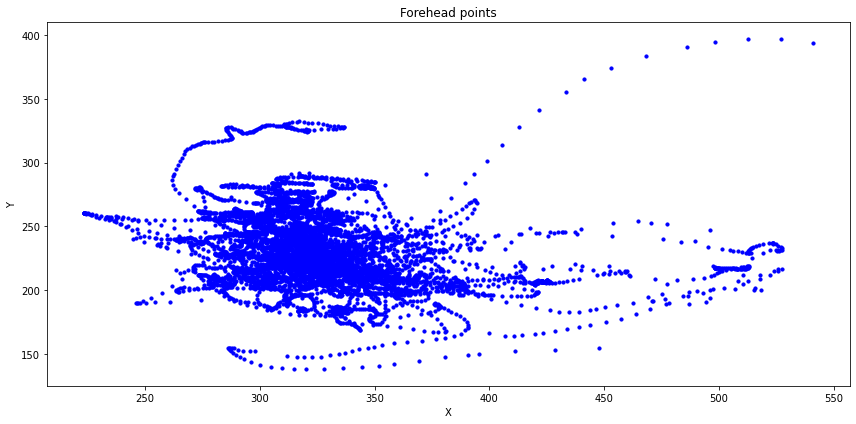

SN19IR56JH2rQhyt2Qiy
Good data for  SN19IR56JH2rQhyt2Qiy ,  97.06574895852201 %


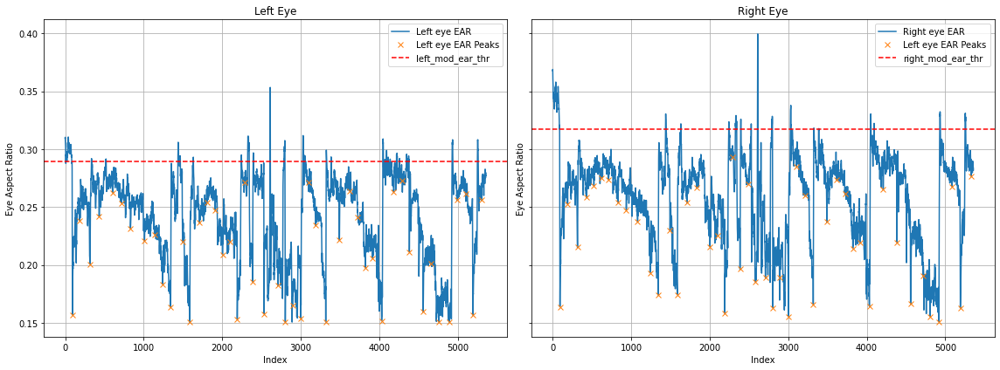

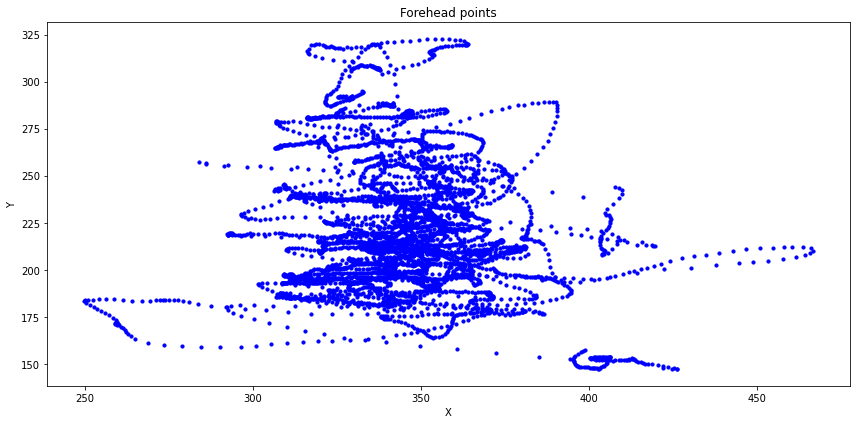

L2da8z1fgzMg09amNr7P
Good data for  L2da8z1fgzMg09amNr7P ,  95.20139595753963 %


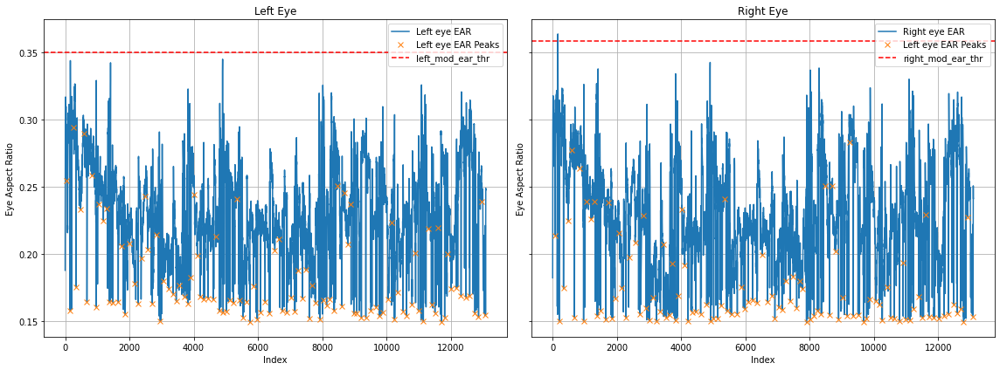

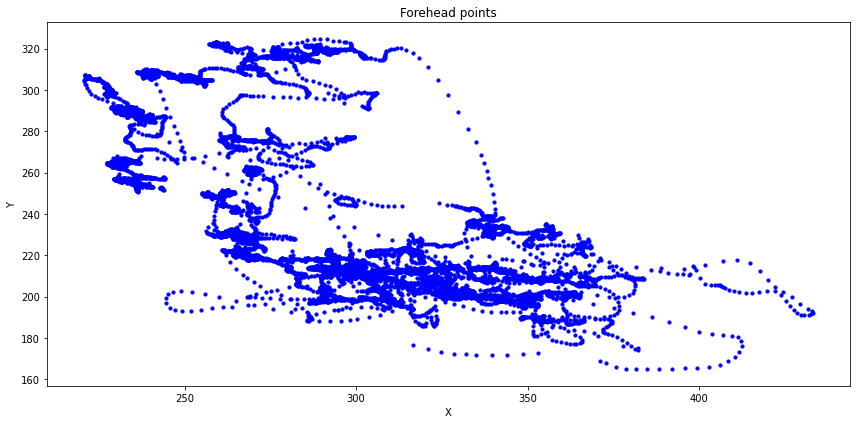

nZgAbtHzeo2wFTUHQwew
Good data for  nZgAbtHzeo2wFTUHQwew ,  99.46206511108007 %


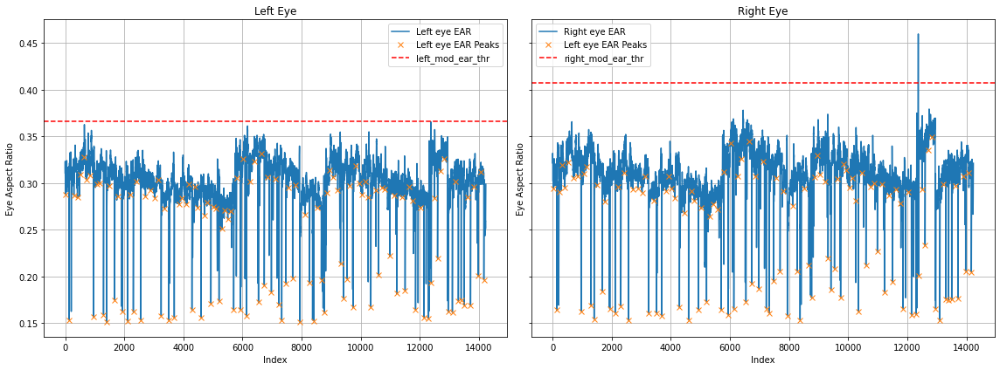

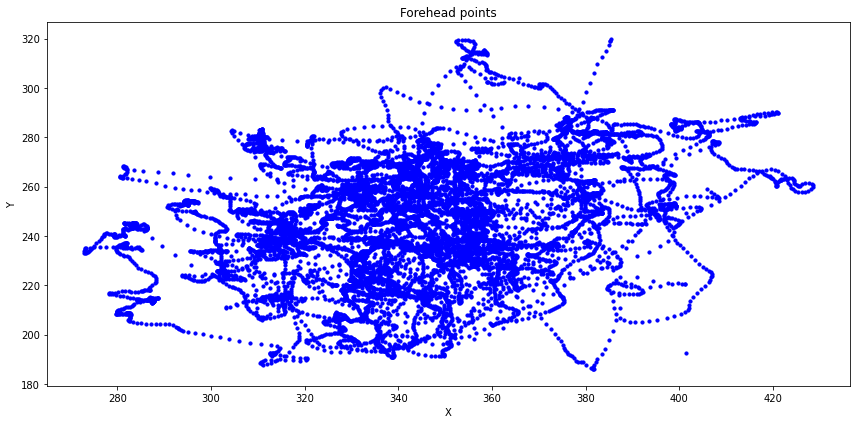

zlLPcwwh5oHLxjGFOX53
Good data for  zlLPcwwh5oHLxjGFOX53 ,  99.85146676568883 %


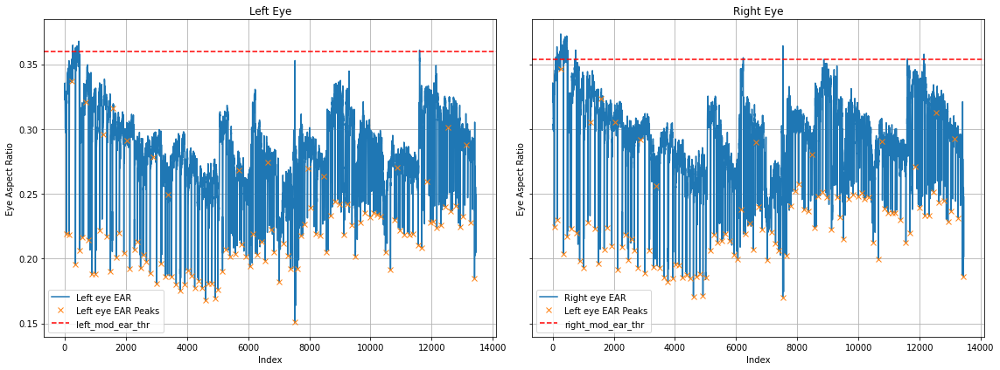

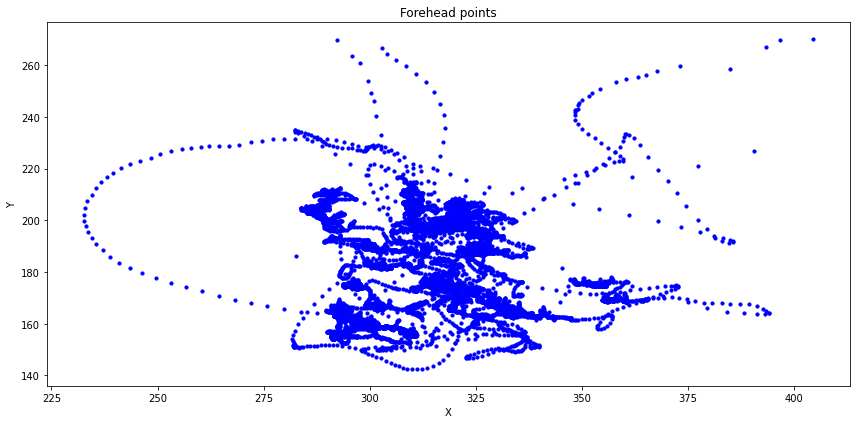

eFHOUodRpopG5sQ3kZSA
Good data for  eFHOUodRpopG5sQ3kZSA ,  99.09027666292076 %


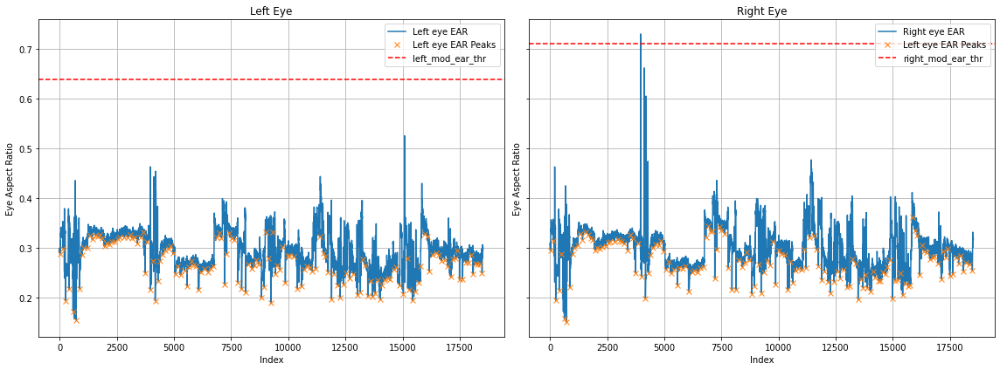

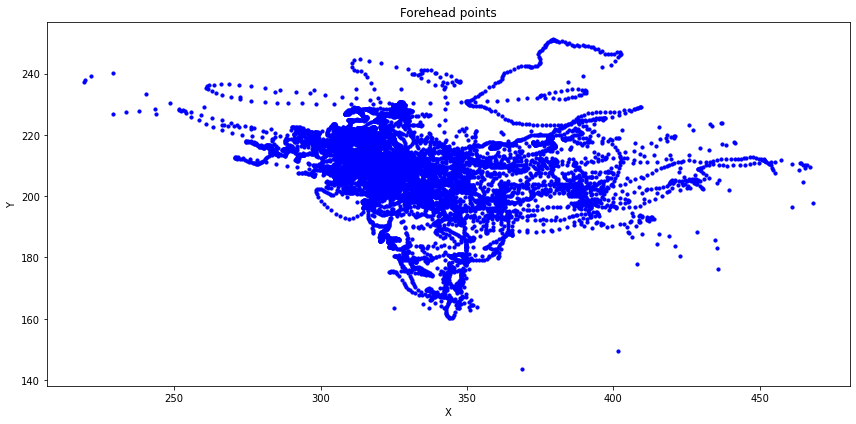

nZNyty5K5cmjH8mxKnqF
Good data for  nZNyty5K5cmjH8mxKnqF ,  99.63548646475475 %


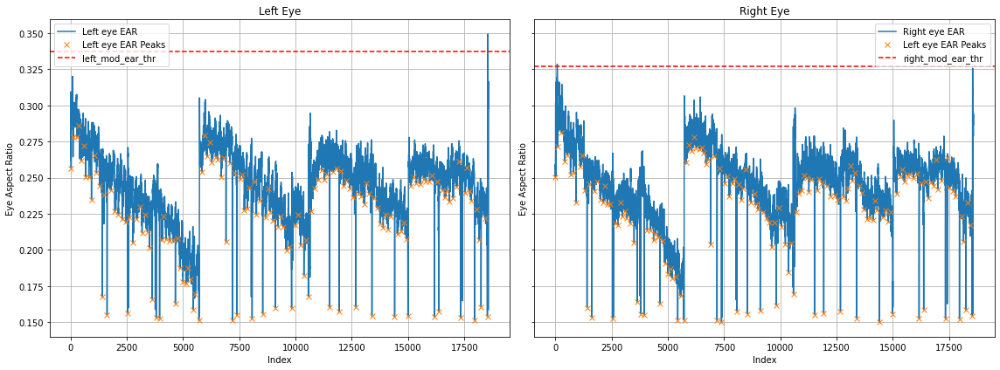

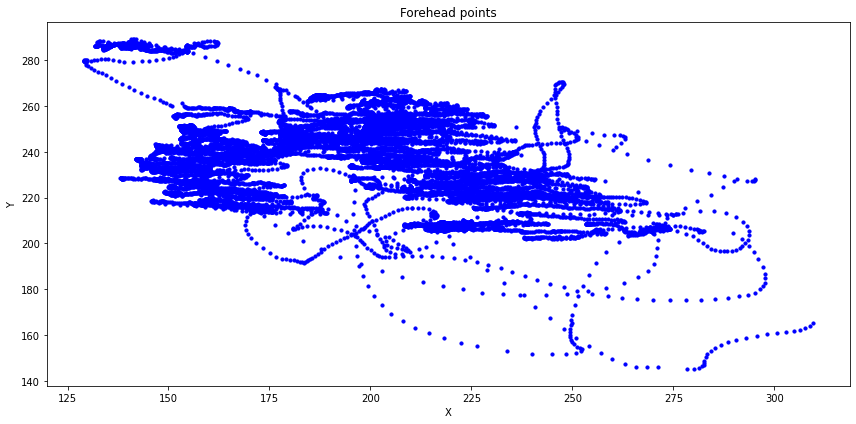

2scmjPWhqE23rBGEr4eQ
Good data for  2scmjPWhqE23rBGEr4eQ ,  99.46099626843571 %


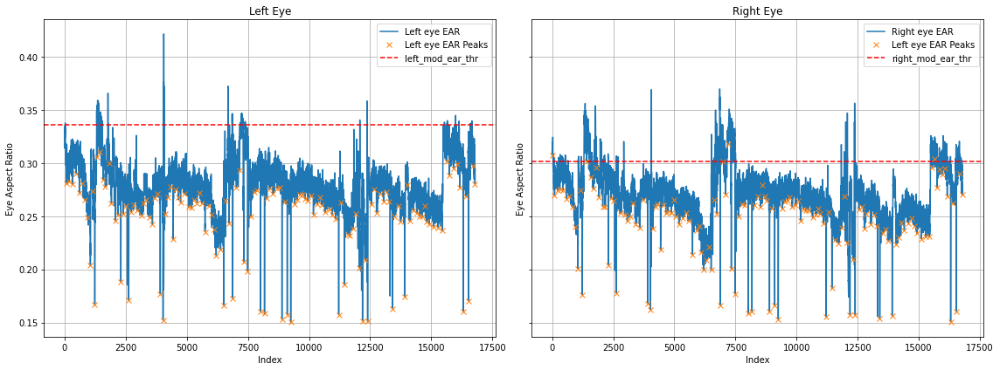

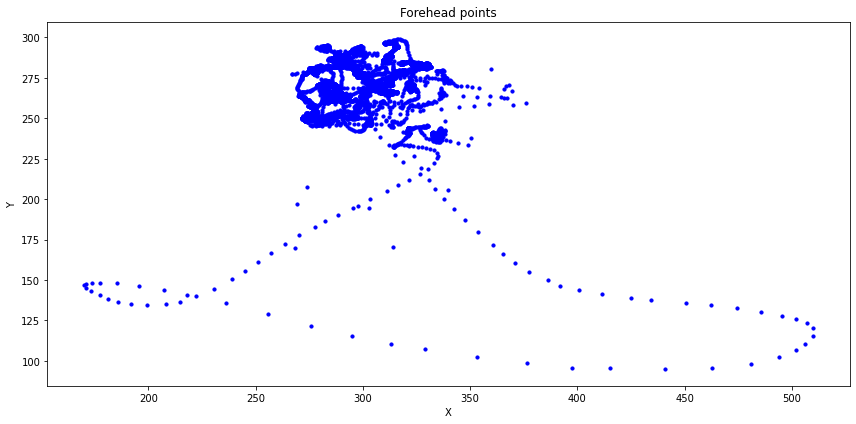

JCqmZgE7s4vwKckxOjzP
Good data for  JCqmZgE7s4vwKckxOjzP ,  99.54238825989191 %


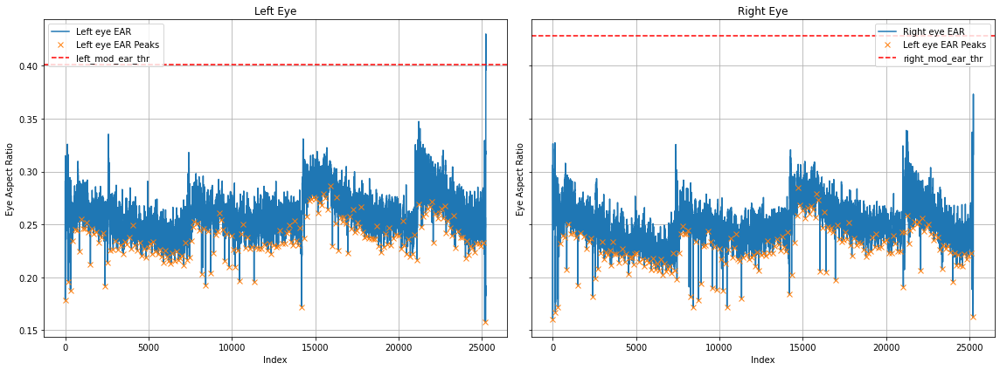

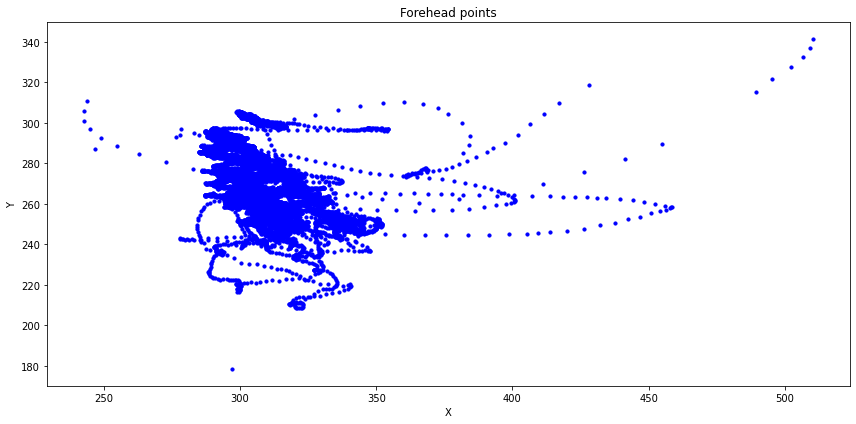

bRXSvgb1tQ9otIl9HMsF
Good data for  bRXSvgb1tQ9otIl9HMsF ,  99.9529696318194 %


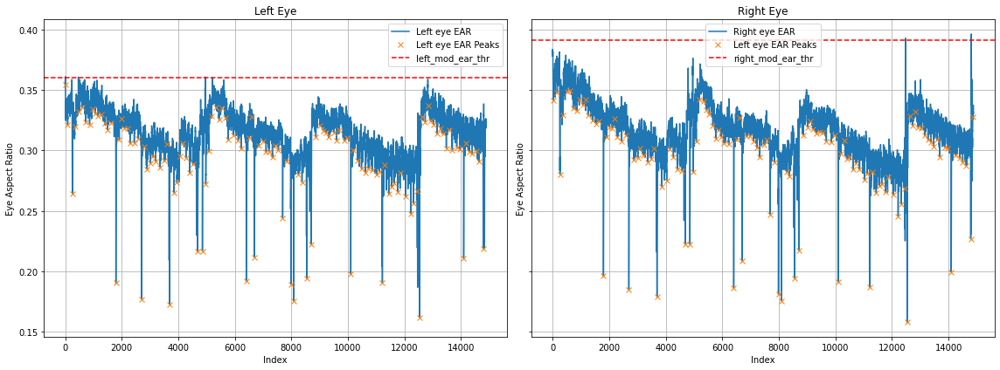

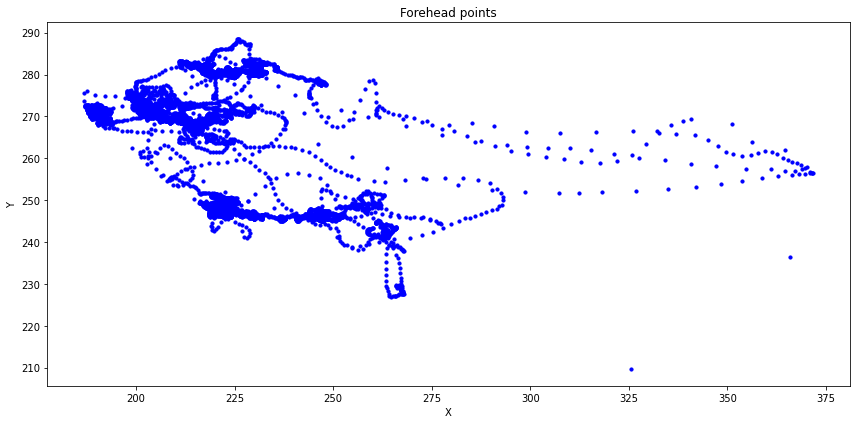

KKSpEtOO8VDzvki0ZDhq
Good data for  KKSpEtOO8VDzvki0ZDhq ,  98.87573964497042 %


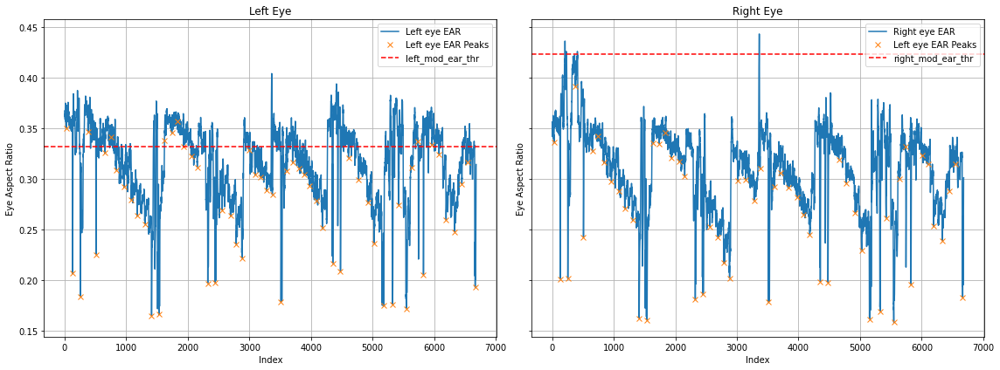

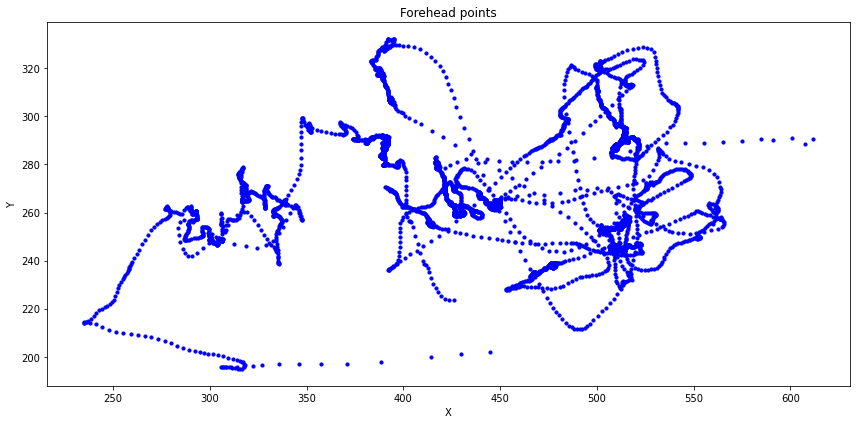

R4uaqbx8esZy3qEXYdJq
Good data for  R4uaqbx8esZy3qEXYdJq ,  98.41304113138291 %


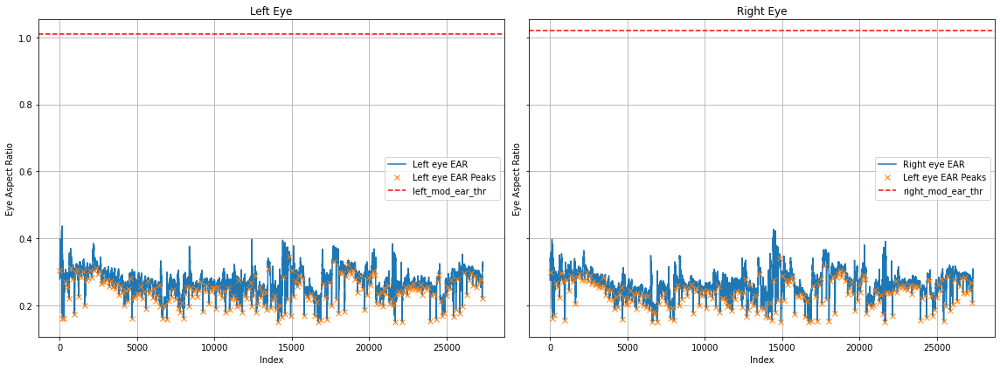

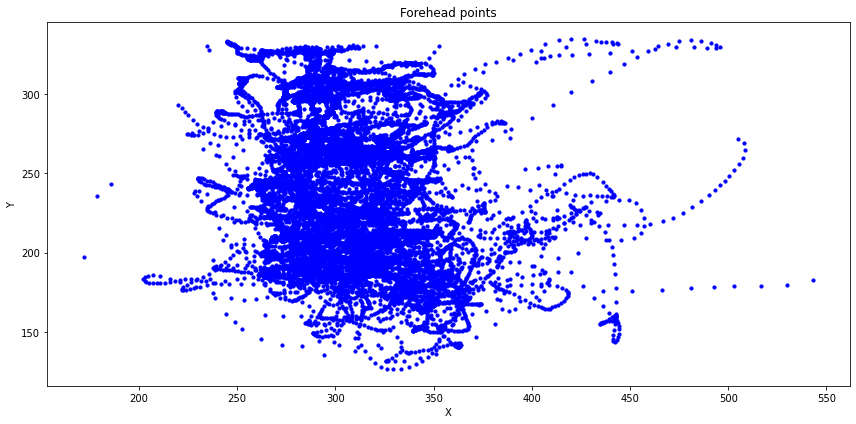

5awGCn0TYzocJrEQtR9e
Good data for  5awGCn0TYzocJrEQtR9e ,  99.67406624383368 %


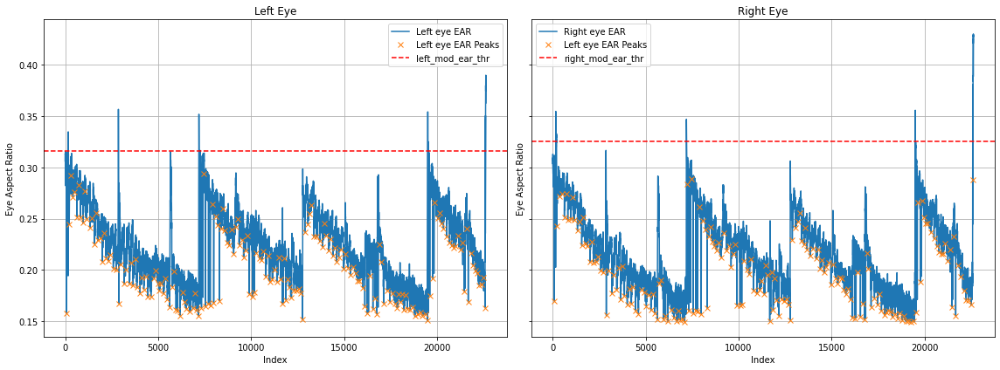

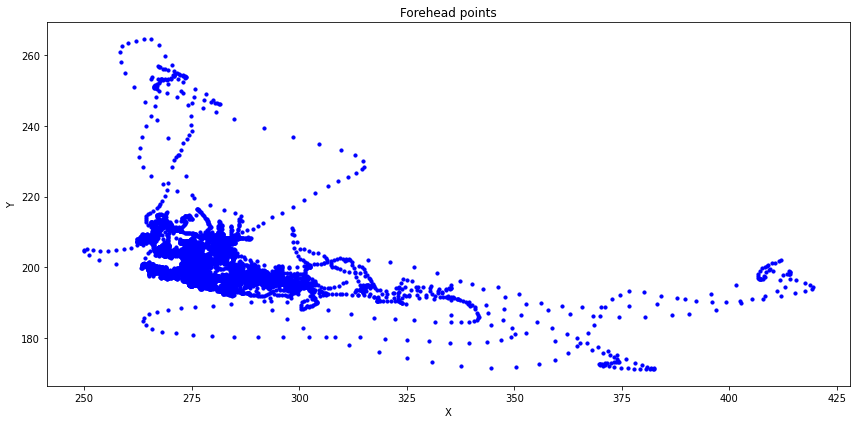

DwDkzsq5iZbIESsEYQLd
Good data for  DwDkzsq5iZbIESsEYQLd ,  98.7891019172553 %


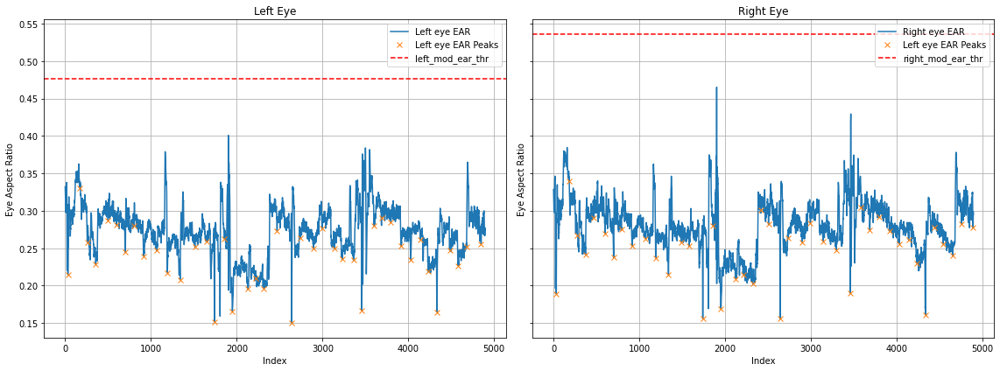

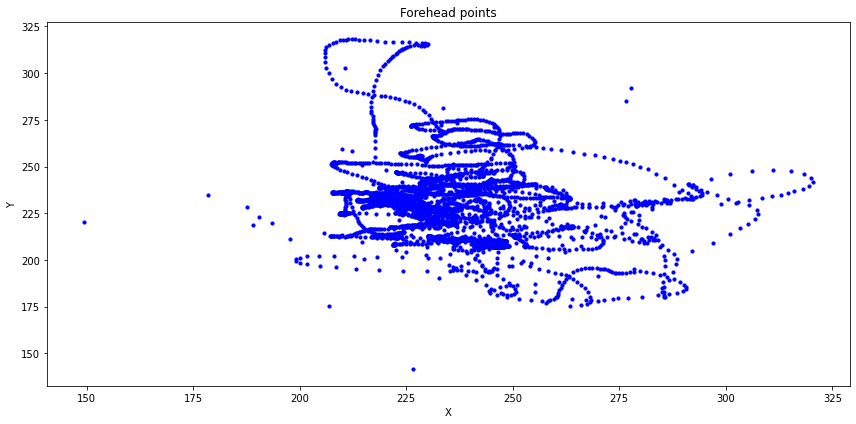

cMpLCmJgp8TeH9MwHVjg
Good data for  cMpLCmJgp8TeH9MwHVjg ,  95.92297762478485 %


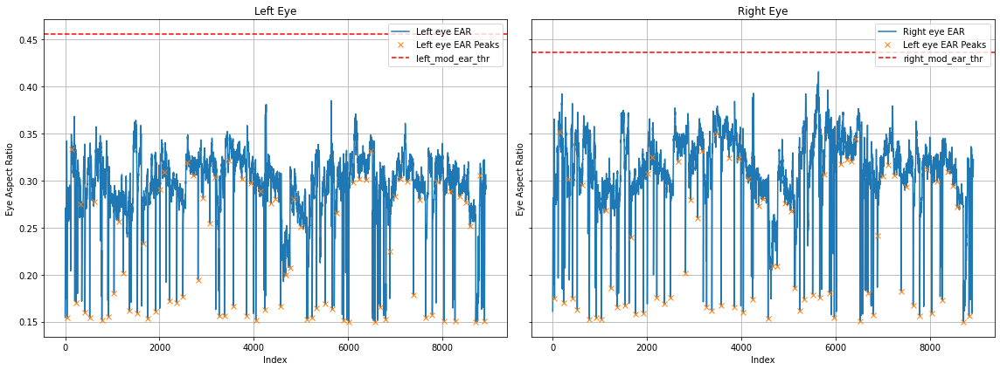

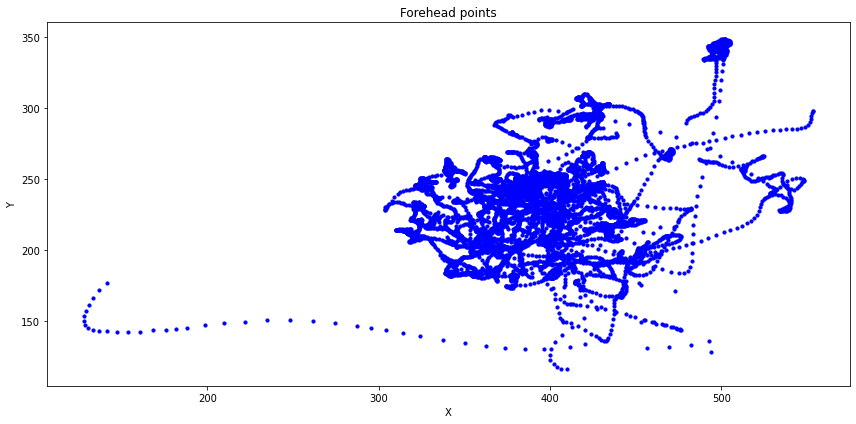

cClGkJjNGafOrZhRrvPr
Good data for  cClGkJjNGafOrZhRrvPr ,  98.65697930427125 %


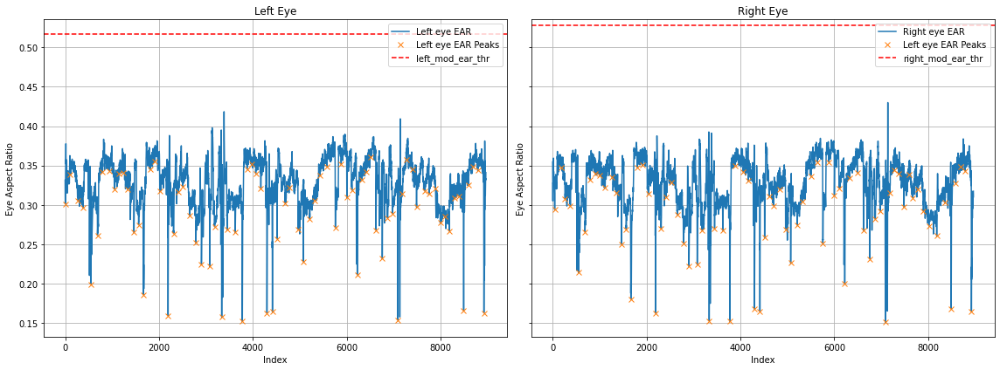

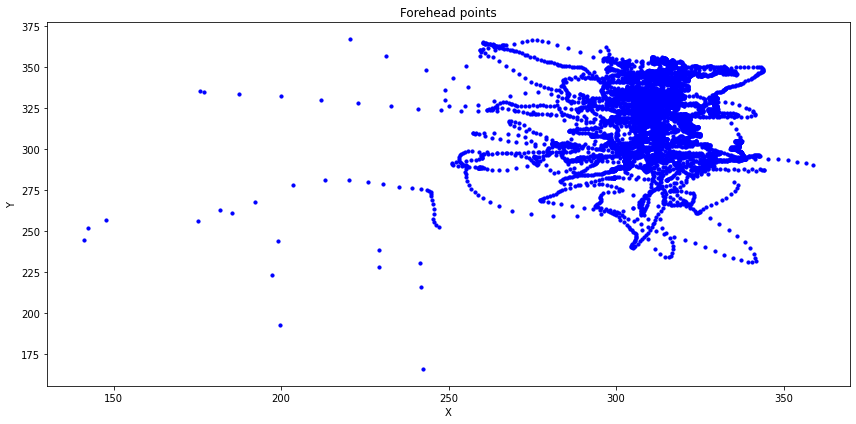

['5n0g1LGcORhAO1DXcLQk', 'Tu0xsSHZFpHueJ5gJnFx']
5n0g1LGcORhAO1DXcLQk
Good data for  5n0g1LGcORhAO1DXcLQk ,  99.48662523642258 %


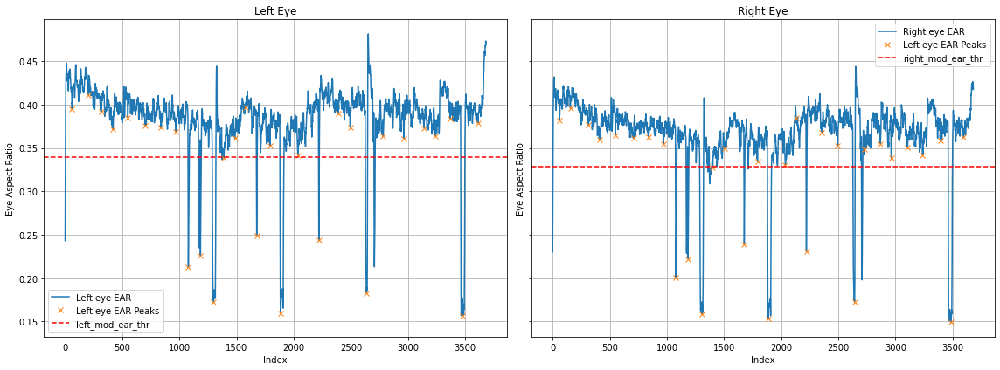

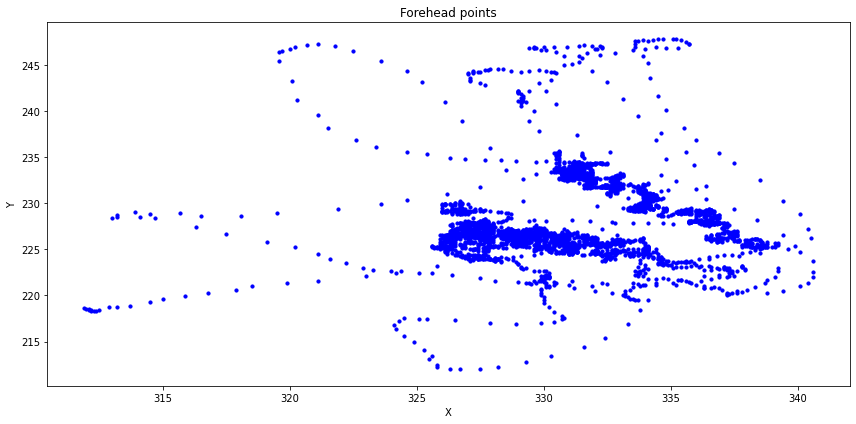

Tu0xsSHZFpHueJ5gJnFx
Good data for  Tu0xsSHZFpHueJ5gJnFx ,  100.0 %


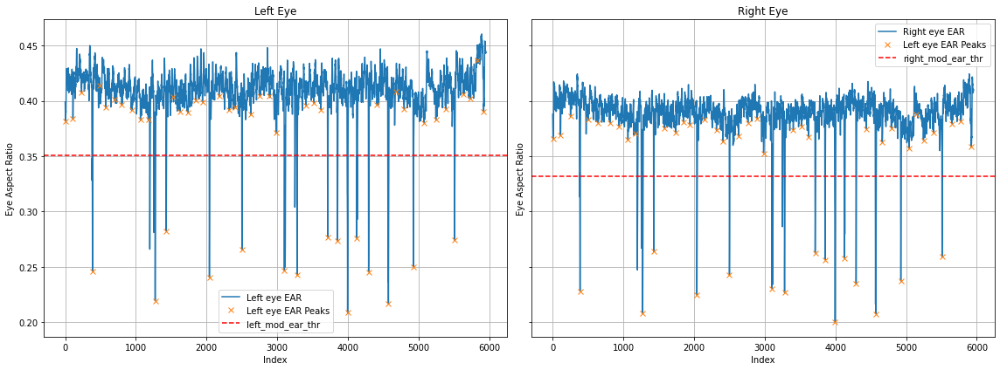

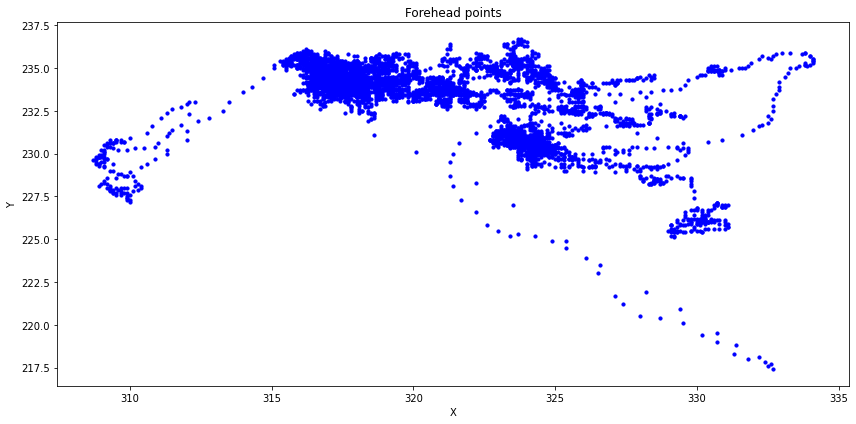

['IuvwDmEfmA2BGRGXqcuX', '7Bo5WX4PfxXwnh5QVCMk']
IuvwDmEfmA2BGRGXqcuX
Good data for  IuvwDmEfmA2BGRGXqcuX ,  100.0 %


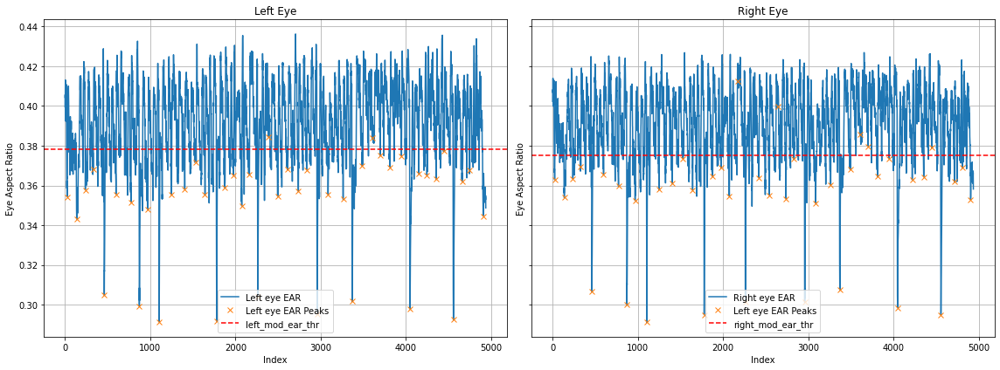

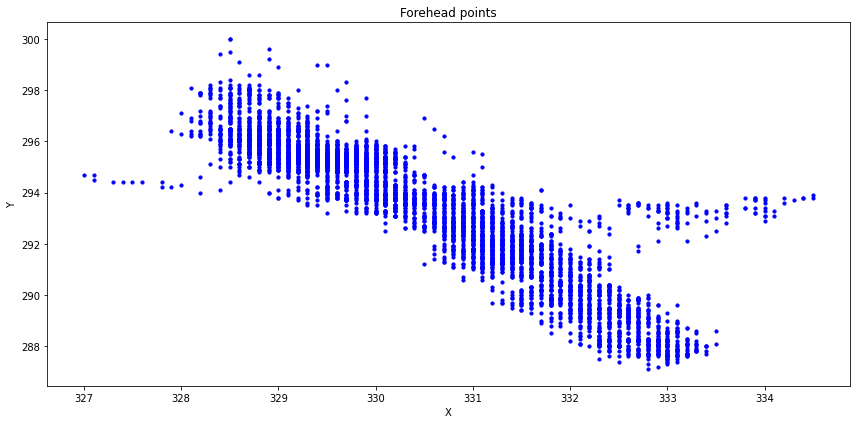

7Bo5WX4PfxXwnh5QVCMk
Good data for  7Bo5WX4PfxXwnh5QVCMk ,  100.0 %


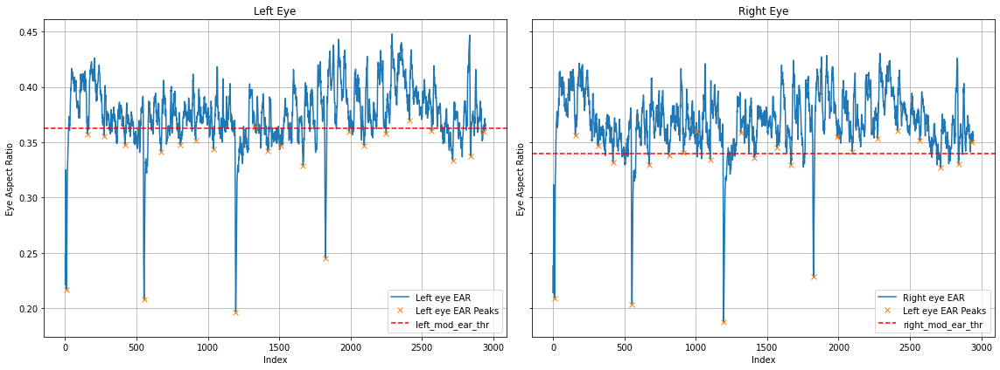

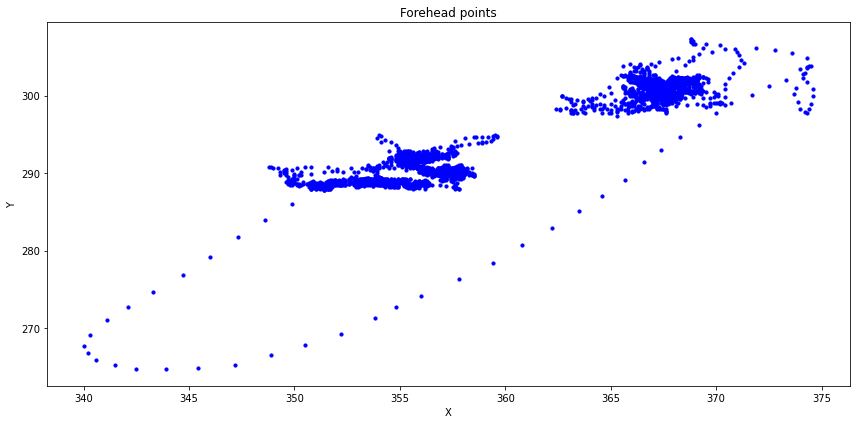

,Session_id,BPOGX,BPOGY,Left_closed,Right_closed,Valid_data,Session_desc,Duration_sec
0,0vDqTTS4iDY6DF5NOp8f,"[-35.0, 0.2, 48.9, 88.0, 126.2, 146.3, 143.1, ...","[140.8, 140.3, 141.0, 140.6, 138.8, 137.2, 126...","[True, False, False, False, False, False, Fals...","[True, True, True, True, False, True, False, T...",1.000000,Normal Scan,273.000000
1,IxFK072TVWPwYlGys7rw,"[30.6, 82.9, 142.8, 184.7, 229.8, 283.6, 307.3...","[158.2, 154.7, 146.6, 132.5, 119.8, 135.6, 160...","[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal...",1.000000,Normal Read,185.500000
2,2N0kUSJASI5JIwtMnJ6Z,"[1242.9, 1260.6, 1243.1, 1222.5, 1206.1, 1169....","[319.1, 354.4, 394.2, 420.2, 421.9, 407.6, 386...","[True, True, False, False, False, False, False...","[True, True, False, False, False, False, False...",0.999344,Normal Scan,304.766667
3,eVx48oKwJpOecNEasAHf,"[679.6, 692.7, 698.4, 711.4, 746.1, 843.4, 100...","[110.3, 107.4, 102.8, 109.5, 115.4, 132.1, 88....","[False, False, False, False, False, False, Tru...","[False, False, False, False, False, True, True...",0.999872,Normal Read,518.866667
4,qxdzibb5ytmZyniXGkN2,"[2806.5, 3401.2, 4244.1, 4703.6, 4860.1, 4774....","[1791.8, 1902.1, 2050.6, 2048.4, 2019.7, 1909....","[True, True, True, True, True, True, True, Tru...","[True, True, True, True, True, True, True, Tru...",0.950809,Normal Scan,96.000000


In [61]:
def store_trajectories_and_calibration_error_from_folder(users_list, folder_name, Fs):
    # opens all files from the folder, extracts the trajectories, and then stores all of them in the dataframe.
    # Also stores the calibration data
    x = []
    y = []
    left_eye_cl = []
    right_eye_cl = []
    
    calibration_error = []
    valid_data = []
    sessions_with_good_data = []
    duration_sec = []
    names_for_bad_records = []
    session_descriptions = []
    for user_name in users_list:
        session_ids = os.listdir(os.path.join(folder_name, user_name, "sessions"))
        print(session_ids)
        for session_id in session_ids:
            if session_id in sessions_dict:
                file_path = os.path.join(folder_name, user_name, "sessions", session_id, "filter.csv")
                file_path_calib = os.path.join(folder_name, user_name, "sessions", session_id, r"meta.json")
                print(session_id)

                # reading trajectory data:
                dd = pd.read_csv(file_path)

                xx = np.array(dd["BPOGX"])
                yy = np.array(dd["BPOGY"])
                N_orig = np.size(xx)
                ind = np.logical_not(np.isnan(xx))
                xx = xx[ind]  # removing
                N_red = np.size(xx)
                yy = yy[ind]

                perc = N_red / N_orig
                if perc >= 0.8:  # finding good recordings
                    print("Good data for ", session_id, ", ", perc * 100, "%")
                    dd_val = dd[ind]
                    left_cl, right_cl = count_ear(dd_val, session_id)
                    
                    plot_head_point(np.array(dd_val["X1"]), np.array(dd_val["Y1"]), ind, session_id)
                    
                    left_eye_cl.extend([left_cl.tolist()])
                    right_eye_cl.extend([right_cl.tolist()])
                    
                    valid_data.append(perc)
                    sessions_with_good_data.append(session_id)
                    
                    x.extend([xx.tolist()])
                    y.extend([yy.tolist()])
                    duration_sec.extend([xx.size/Fs])
                    session_desc = sessions_dict[session_id]
                    session_descriptions.append(session_desc)
                    
                    # no calibration info in the json!!!
                    
                    # reading calibration data:
#                     with open(file_path_calib) as f:
#                         dd_c = json.load(f)
#                     calibration_error.extend([dd_c["calibration"]['error']])
    DF = pd.DataFrame(sessions_with_good_data, columns=["Session_id"])
    DF["BPOGX"] = x
    DF["BPOGY"] = y
    DF["Left_closed"] = left_eye_cl
    DF["Right_closed"] = right_eye_cl
#     DF["calibration_error"] = calibration_error
    DF["Valid_data"] = valid_data
    DF["Session_id"] = sessions_with_good_data
    DF["Session_desc"] = session_descriptions
    DF["Duration_sec"] = duration_sec
    # DF = DF[~DF["User_names"].isin(names_for_bad_records)]

    return DF

Fs = 30 # is it true for us?

df = store_trajectories_and_calibration_error_from_folder(users_names, users_path, Fs)
df.head()

In [6]:
def print_animated_trajectory(df, session_id='qxdzibb5ytmZyniXGkN2'):
    x = df.loc[df['Session_id'] == session_id, "BPOGX"].tolist()[0]  # extracting one coordinate
    y = df.loc[df['Session_id'] == session_id, "BPOGY"].tolist()[0]  # extracting one coordinate

    x = x[0:1000]
    y = y[0:1000]
    test_name = df.loc[df['Session_id'] == session_id, "Session_desc"].tolist()[0]
    fig, ax = plt.subplots()
    plt.gca().invert_yaxis()
    plt.gca().xaxis.set_ticks_position('top')
    plt.xlabel('Pixels')
    plt.ylabel('Pixels')
    plt.title(session_id + ', ' + test_name)
    line, = ax.plot(x, y, color='k')

    def update(num, x, y, line):
        line.set_data(x[:num], y[:num])
        # line.axes.axis([0, 10, 0, 1])
        return line,

    ani = animation.FuncAnimation(fig, update, len(x), fargs=[x, y, line],
                                  interval=33, blit=True)
    ani.save('conc_eyetrack.gif')
    plt.show()

    return

In [7]:
df.columns

Index(['Session_id', 'BPOGX', 'BPOGY', 'Valid_data', 'Session_desc',
       'Duration_sec'],
      dtype='object')

In [ ]:
print_animated_trajectory(df)

In [ ]:
print_animated_trajectory(df, 'fXIYXEjpMOyuuDXaYrK8')

# Fixations

In [44]:
def fixation_for_all_trajectories(df, fixation_window_size, threshold, Fs, test_name):
    # For all trajectories in the dataframe, fixation is defined in the window of FIXATION_WINDOW (samples). if Dispersion
    # is less than CALIBRATION ERROR multiplied by fixation_threshold_coeff.

    err = 50
    # return array of 1s if a window contains fixation, 0s otherwise
    df["Fixation_indicators"] = [rolling_window_analysis_for_fixations(x, y, fixation_window_size, err, threshold)
                                 for (x, y) in
                                 zip(df["BPOGX"], df["BPOGY"])]
    # returns duration of fixations in seconds
    df["Total_fixation_length"] = [sum(x) for x in df["Fixation_indicators"]] # in samples
    df["Total_fixation_length"] = [(x + fixation_window_size)/Fs for x in df["Total_fixation_length"]] # in seconds
    df["Fixation_ratio"] = [(100 * x) / y for (x, y) in zip(df["Total_fixation_length"], df["Duration_sec"])]
    
    return df

In [45]:
def rolling_window_analysis_for_fixations(x, y, fixation_window_size, err, threshold):
    # x -- X trajectory
    # y -- Y trajectory
    # Window Size -- in samples
    #  th -- threshold

    results = []
    i = 0
    while i < len(x) - fixation_window_size + 1:
        this_window_xs = x[i: i + fixation_window_size]
        this_window_ys = y[i: i + fixation_window_size]
        res = window_threshold_analyse(this_window_xs, this_window_ys, err, threshold)
        results.append(res)
        i += 1

    return results

In [46]:
def window_threshold_analyse(x, y, err, threshold):
    if (max(x) - min(x) <= err + threshold) and \
        (max(y) - min(y) <= err + threshold):
        
        return 1  # fixation detected
    return 0

In [47]:
def fixation_distribution_statistics(df, Fs, test_name, threshold, fixation_window_size):
    durs = []
    fixation_number = []
    medians = []
    for index, row in df.iterrows():
        # convert to string of characters:
        Str = str(row["Fixation_indicators"])[1:-1]
        new_Str = Str
        l_dif = 1 # length difference counter
        while l_dif > 0:
            new_Str = Str.replace("0, 0, ", "0, ")
            l_dif = len(Str) - len(new_Str)
            Str = new_Str
        new_list = [int(s) for s in Str.split(',')]
        positions = [i for i, e in enumerate(new_list) if e == 0]  # find positions of separating zeros
        durations = [positions[0]] + [e-1 for e in list(np.diff(positions))]   # in samples
        if durations[0] == 0:  # removing first and last single zero (if any)
            durations = durations[1:]
        if durations[-1] == 0:
            durations = durations[:-1]
        dur_ = [e/Fs for e in durations]  # in seconds
        durs.extend([dur_])
        medians.extend([stats.median(dur_)])
        fixation_number.extend([len(dur_)])


    df["Fixations"] = durs
    all_durations_for_group = [item for sublist in durs for item in sublist]
    
    plt.title(test_name)
    plt.boxplot(durs)
    plt.xlabel("# Subject")
    plt.ylabel("Fixation, sec.")
    plt.grid()
    plt.savefig(test_name + "_fix_boxplot_thr_" + str(threshold) + "_window_" + str(fixation_window_size / Fs) + ".jpeg")
    plt.show()


    return df, all_durations_for_group, fixation_number, durs


['0vDqTTS4iDY6DF5NOp8f', 'IxFK072TVWPwYlGys7rw']
0vDqTTS4iDY6DF5NOp8f
Good data for  0vDqTTS4iDY6DF5NOp8f ,  100.0 %
IxFK072TVWPwYlGys7rw
Good data for  IxFK072TVWPwYlGys7rw ,  100.0 %
['2N0kUSJASI5JIwtMnJ6Z', 'eVx48oKwJpOecNEasAHf']
2N0kUSJASI5JIwtMnJ6Z
Good data for  2N0kUSJASI5JIwtMnJ6Z ,  99.93441906219259 %
eVx48oKwJpOecNEasAHf
Good data for  eVx48oKwJpOecNEasAHf ,  99.98715313463515 %
['qxdzibb5ytmZyniXGkN2', '8I5OjidfaOip7sBIdNv1']
qxdzibb5ytmZyniXGkN2
Good data for  qxdzibb5ytmZyniXGkN2 ,  95.0808847804556 %
8I5OjidfaOip7sBIdNv1
Good data for  8I5OjidfaOip7sBIdNv1 ,  99.27872230808862 %
['S4S21Dhf1s4TQT14Nd4Y', 'm5GzWYq0Bv5vdsLum2mA', 'qolKFgxi6Kt6FqEKE7zR']
qolKFgxi6Kt6FqEKE7zR
Good data for  qolKFgxi6Kt6FqEKE7zR ,  99.98024496246542 %
['y28aaUsUOIQXfN07Ja8L', 'SoO55MIfSyBEqQ6AD5iG']
y28aaUsUOIQXfN07Ja8L
Good data for  y28aaUsUOIQXfN07Ja8L ,  99.6221382529451 %
SoO55MIfSyBEqQ6AD5iG
Good data for  SoO55MIfSyBEqQ6AD5iG ,  98.67659222497932 %
['hUEkI2mVf34Ufg2BHBAB', 'KpvwhSkbepJ

Good data for  R4uaqbx8esZy3qEXYdJq ,  98.41304113138291 %
5awGCn0TYzocJrEQtR9e
Good data for  5awGCn0TYzocJrEQtR9e ,  99.67406624383368 %
DwDkzsq5iZbIESsEYQLd
Good data for  DwDkzsq5iZbIESsEYQLd ,  98.7891019172553 %
cMpLCmJgp8TeH9MwHVjg
Good data for  cMpLCmJgp8TeH9MwHVjg ,  95.92297762478485 %
cClGkJjNGafOrZhRrvPr
Good data for  cClGkJjNGafOrZhRrvPr ,  98.65697930427125 %
['5n0g1LGcORhAO1DXcLQk', 'Tu0xsSHZFpHueJ5gJnFx']
5n0g1LGcORhAO1DXcLQk
Good data for  5n0g1LGcORhAO1DXcLQk ,  99.48662523642258 %
Tu0xsSHZFpHueJ5gJnFx
Good data for  Tu0xsSHZFpHueJ5gJnFx ,  100.0 %
['IuvwDmEfmA2BGRGXqcuX', '7Bo5WX4PfxXwnh5QVCMk']
IuvwDmEfmA2BGRGXqcuX
Good data for  IuvwDmEfmA2BGRGXqcuX ,  100.0 %
7Bo5WX4PfxXwnh5QVCMk
Good data for  7Bo5WX4PfxXwnh5QVCMk ,  100.0 %


/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

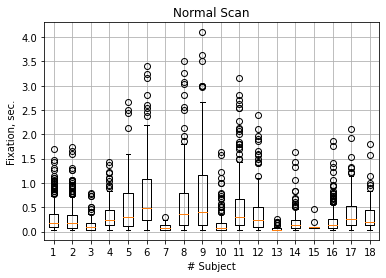

/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

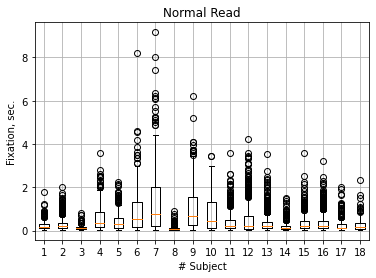

/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

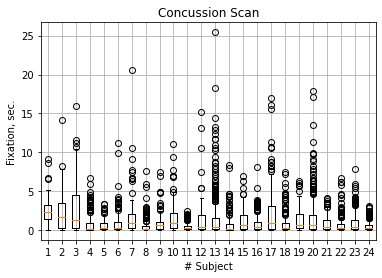

/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/home/olha/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

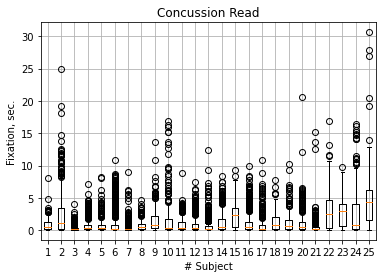

In [63]:
fixation_hist = []
med = []
fixation_number = []
fixation_ratio = []
all_durations = []

sessions_id = []
groups = []
tasks = []
fixation_length = []


df = store_trajectories_and_calibration_error_from_folder(users_names, users_path, Fs)
test_names = df["Session_desc"].unique()
for test in test_names:
    df_curr = df[df["Session_desc"] == test]
    
    group, task = test.split()
    groups.extend([group] * len(df_curr))
    tasks.extend([task] * len(df_curr))
    sessions_id.extend(df_curr["Session_id"].to_list())
    
    
    # Fixation
    fixation_win_size = int(0.2 * Fs)    # samples
    thr = 100   # pixels, threshold for fixation: if deviation in the window is less --> fixation
    df_curr = fixation_for_all_trajectories(df_curr, fixation_win_size, thr, Fs, test)
    df_curr, all_durs, fix_number, durs_boxes = fixation_distribution_statistics(df_curr, Fs, test, thr, fixation_win_size)
    all_durations.append(durs_boxes)
    fixation_hist.extend([all_durs])
    fixation_number.extend([fix_number])
    fixation_ratio.extend([df_curr["Fixation_ratio"].to_list()])
    
    fixation_length.extend([df_curr["Total_fixation_length"].to_list()])

In [80]:
fixation_number_s = [item for sublist in fixation_number for item in sublist]
fixation_length_s = [item for sublist in fixation_length for item in sublist]
fixation_ratio_s = [item for sublist in fixation_ratio for item in sublist]

data = {
    'session_id': sessions_id,
    'group': groups,
    'task': tasks,
    'fixation_number': fixation_number_s,
    'fixation_length': fixation_length_s,
    'fixation_ratio': fixation_ratio_s
}

df_fix = pd.DataFrame(data)
df_fix.head()

,session_id,group,task,fixation_number,fixation_length,fixation_ratio
0,0vDqTTS4iDY6DF5NOp8f,Normal,Scan,481,132.400000,48.498168
1,2N0kUSJASI5JIwtMnJ6Z,Normal,Scan,601,155.433333,51.000766
2,qxdzibb5ytmZyniXGkN2,Normal,Scan,130,18.766667,19.548611
3,SoO55MIfSyBEqQ6AD5iG,Normal,Scan,126,42.466667,53.394803
4,KpvwhSkbepJQTVPLuhOg,Normal,Scan,71,40.700000,69.139298


In [86]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

X = df_fix[['task', 'fixation_number', 'fixation_length', 'fixation_ratio']]
y = df_fix['group']

X_encoded = pd.get_dummies(X)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8235294117647058


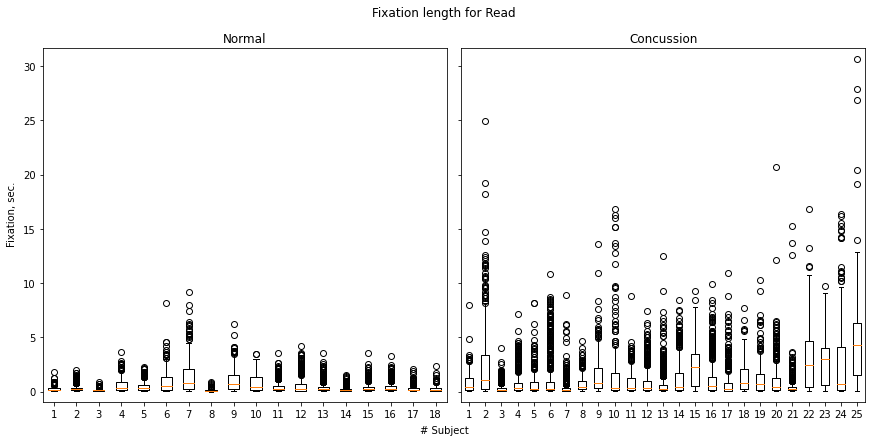

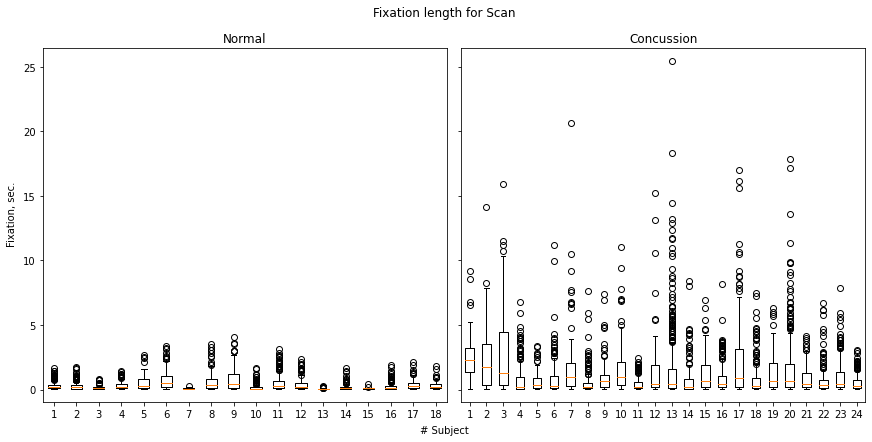

In [36]:
read_tasks = [all_durations[1], all_durations[3]]
scan_tasks = [all_durations[0], all_durations[2]]

tasks_dict = {0: "Normal", 1: "Concussion"}
titles = ["Read", "Scan"]

for task_type, title in zip((read_tasks, scan_tasks), titles):

    fig, axes = plt.subplots(nrows=1, ncols=len(task_type), figsize=(12, 6), sharey=True)
    
    # Plot boxplots for each list of lists
    for i, data in enumerate(task_type):
        axes[i].boxplot(data)
        axes[i].set_title(tasks_dict[i])

    # Set the y-axis limits to be the same for all subplots
    min_value = min([min(min(sublist) for sublist in data) for data in task_type])
    max_value = max([max(max(sublist) for sublist in data) for data in task_type])
    for ax in axes:
        ax.set_ylim(min_value - 1, max_value + 1)

    # Add labels and title
    
    plt.suptitle(f'Fixation length for {title}')
    fig.text(0.5, 0.0, '# Subject', ha='center', va='center')
    fig.text(0.0, 0.5, 'Fixation, sec.', ha='center', va='center', rotation='vertical')

    # Adjust layout and show plot
    plt.tight_layout()
    plt.savefig("Fixation length for " + title + ".jpeg")
    plt.show()

In [37]:
qntls = np.quantile(fixation_hist[0], [0.25, 0.5, 0.75])
print("Duration of all fixations, " + test_names[0] + " :", qntls)
qntls = np.quantile(fixation_hist[1], [0.25, 0.5, 0.75])
print("Duration of all fixations, " + test_names[1] + " :", qntls)
qntls = np.quantile(fixation_hist[2], [0.25, 0.5, 0.75])
print("Duration of all fixations, " + test_names[2] + " :", qntls)
qntls = np.quantile(fixation_hist[3], [0.25, 0.5, 0.75])
print("Duration of all fixations, " + test_names[3] + " :", qntls)

U1, p = mannwhitneyu(fixation_hist[0], fixation_hist[2])
print('Fixations, 0 vs 2', U1, p)
U1, p = mannwhitneyu(fixation_hist[1], fixation_hist[3])
print('Fixations, 1 vs 3', U1, p)

Duration of all fixations, Normal Scan : [0.06666667 0.16666667 0.4       ]
Duration of all fixations, Normal Read : [0.1 0.2 0.5]
Duration of all fixations, Concussion Scan : [0.13333333 0.4        1.33333333]
Duration of all fixations, Concussion Read : [0.1        0.3        0.96666667]
Fixations, 0 vs 2 6533598.5 1.935054991149983e-166
Fixations, 1 vs 3 53579430.5 5.8112972269607085e-95


In [38]:
qntls = np.quantile(fixation_number[0], [0.25, 0.5, 0.75])
print("Number of fixations, " + test_names[0] + " :", qntls)
qntls = np.quantile(fixation_number[1], [0.25, 0.5, 0.75])
print("Number of fixations, " + test_names[1] + " :", qntls)
qntls = np.quantile(fixation_number[2], [0.25, 0.5, 0.75])
print("Number of fixations, " + test_names[2] + " :", qntls)
qntls = np.quantile(fixation_number[3], [0.25, 0.5, 0.75])
print("Number of fixations, " + test_names[3] + " :", qntls)

U1, p = mannwhitneyu(fixation_number[0], fixation_number[2])
print(U1, p)
U1, p = mannwhitneyu(fixation_number[1], fixation_number[3])
print(U1, p)

Number of fixations, Normal Scan : [127.  175.5 239.5]
Number of fixations, Normal Read : [339.75 445.5  777.25]
Number of fixations, Concussion Scan : [143.75 194.   267.25]
Number of fixations, Concussion Read : [315. 396. 589.]
197.5 0.32363740912284045
203.0 0.29829403257517195


In [39]:
qntls = np.quantile(fixation_ratio[0], [0.25, 0.5, 0.75])
print("Ratio of fixations, " + test_names[0] + " :", qntls)
qntls = np.quantile(fixation_ratio[1], [0.25, 0.5, 0.75])
print("Ratio of fixations, " + test_names[1] + " :", qntls)
qntls = np.quantile(fixation_ratio[2], [0.25, 0.5, 0.75])
print("Ratio of fixations, " + test_names[2] + " :", qntls)
qntls = np.quantile(fixation_ratio[3], [0.25, 0.5, 0.75])
print("Ratio of fixations, " + test_names[3] + " :", qntls)

U1, p = mannwhitneyu(fixation_ratio[0], fixation_ratio[2])
print(U1, p)
U1, p = mannwhitneyu(fixation_ratio[1], fixation_ratio[3])
print(U1, p)

Ratio of fixations, Normal Scan : [23.68813347 50.72832159 66.30367402]
Ratio of fixations, Normal Read : [48.25600246 59.80459211 70.35157588]
Ratio of fixations, Concussion Scan : [73.97598482 82.20258699 88.72801696]
Ratio of fixations, Concussion Read : [77.66916145 84.36270246 88.7693812 ]
24.0 5.658205605250284e-07
61.0 2.8476552225449457e-05
